# CS780: Deep Reinforcement Learning Assignment - 1
***Instructor: Ashutosh Modi***


- Submission Deadline: 07/02/2026; 11:59 PM
- Submission Form: [https://forms.gle/KZ8EZwUuddw1Gh648](https://forms.gle/KZ8EZwUuddw1Gh648)


## Instructions
Read all the instructions below carefully before you start working on the assignment.
- The purpose of this course is that you learn RL and the best way to do that is by implementation and experimentation.
- The assignment requires your to implement some algorithms and you are required report your findings after experimenting with those algorithms.
- You are to treat this colab notebook as a mix of report and code repo, such that all the code blocks are executable from end-to-end and the write about your observations and findings in relecant markdown cells.
- You are expected to implement algorithms on your own and not copy it from other sources/class mates.
Of course, you can refer to lecture slides.
- If you use any reference or material (including code), please cite the source, else it will be considered
plagiarism. But referring to other sources that directly solve the problems given in the assignment is not
allowed. There is a limit to which you can refer to outside material.
- This is an individual assignment.
- In case your solution is found to have an overlap with solution by someone else (including external sources),
all the parties involved will get zero in this and all future assignments plus further more penalties in the
overall grade. We will check not just for lexical but also semantic overlap. Same applies for the code as
well. **Even an iota of cheating would NOT be tolerated**. If you cheat one line or cheat one page
the penalty would be same.
- Be a smart agent, think long term, if you cheat we will discover it somehow, the price you would be paying
is not worth it.
- In case you are struggling with the assignment, seek help from TAs. Cheating is not an option! I respect
honesty and would be lenient if you are not able to solve some questions due to difficulty in understanding.
Remember we are there to help you out, seek help if something is difficult to understand.
- The deadline for the submission is given above. Submit at least 30 minutes before the deadline, lot can
happen at the last moment, your internet can fail, there can be a power failure, you can be abducted by
aliens, etc.
- You have to submit your assignment via following Google Form (link above). You will be sharing your
code and a report having the details about the code and answer to questions in the assignment.
- The form would close after the deadline and we will not accept any solution. No reason what-so-ever
would be accepted for not being able to submit before the deadline.
- Since the assignment involves experimentation, reporting your results and observations, there is a lot
of scope for creativity and innovation and presenting new perspectives. Such efforts would be highly
appreciated and accordingly well rewarded. Be an exploratory agent!
In your plots, have a clear legend and clear lines, etc. Of course you would generating the plots in your
code but you must also put these plots in your report. Generate high resolution pdf/svg version of the
plots so that it doesn’t pixilate on zooming.
- For implementing a new environment in Gymaniusm, we have already shared a document about the
process, please refer to it. You are not required to render the environment on the screen/terminal. **Do
remember to set the seed, this will be useful for reproducing your experiments. And we
will use the seed provided by you to verify your results. Also for each instance of the
environment that you create use a different seed and save these seeds, these will be useful
for reproducing the results**. Do not set the seed to 42 :P
- For all experiments, report about the seed used in the code documentation and also in your report, write
about the seed used.
- In your report write about all things that are not obvious from the code e.g., if you have made any
assumptions, references/sources, running time, etc.
<!-- - Code should be written in Jupyter notebook and keep it very well documented (there are separate marks
for documentation). Include readme file that tells about how to run the code. Zip your documented
Jupyter notebook and readme. -->

## Problem 1: Multi-armed Bandits
$(10+10+60+20+20+20+20+20+20+20=220\text{ points})$

In lecture 6 we learnt about Multi-armed bandit. In this problem, you will be implementing Multi-armed bandit with different strategies. The aim is to compare the performance of different strategies.
In particular, you will be implementing 2-armed Bernoulli Bandit (Figure (a)) and 10-armed Gaussian Bandit (Figure (b)).

![multi-armed bandits](https://i.postimg.cc/d0LBhpRH/Screenshot-2026-01-18-at-2-55-07-PM.png)


**2-armed Bernoulli Bandit:** The mathematical formulation is as follows:

$$
R_0 \sim \text{Bernoulli}(\alpha)
$$
$$
R_1 \sim \text{Bernoulli}(\beta)
$$

**10-armed Gaussian Bandit:** The mathematical formulation is as follows:

$$
q_*(k) \sim N(\mu=0, \sigma^2=1)
$$
$$
R_k \sim N(\mu=q_*(k), \sigma^2=1)
$$

Note that in 10-armed Gaussian Bandit, for each arm $k$, the action value $q_*(k)$ is sampled from a standard Gaussian distribution and reward for the corresponding arm is sample from a gaussian distribution which has mean $q_*(k)$ and unit standard deviation.



In [1]:
# Install gymnasium
!pip install gymnasium

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym
from gymnasium import spaces
import matplotlib as mlt
import random

# For reproducibility
np.random.seed(40)

### 1. Create 2-armed bandit environment (10 points)
In Gymnasium create the environment for 2-armed Bernoulli Bandit. The environment should take $\alpha$ and $\beta$ as input parameters and simulate 2-armed bandit accordingly. Once you have implemented the environment, run it using different values of $\alpha$ and $\beta$ to make sure it is executing as expected. For, example, you can try with $(\alpha, \beta) = (0, 0), (1, 0), (0, 1), (1, 1), (0.5, 0.5)$, etc. Report about your test cases and how they point towards the correct implementation. Also report about your general observations.

In [3]:
class TwoArmedBernoulliBandit(gym.Env):
    """
    Gymnasium environment for a 2-armed Bernoulli Bandit.
    Action 0 - Bernoulli(alpha)
    Action 1 - Bernoulli(beta)
    """

    def __init__(self, alpha, beta):
        """
        Initialize the environment.

        Args:
            alpha (float): Success probability for Arm 0.
            beta (float): Success probability for Arm 1.
        """
        super().__init__()
        # Write your code here
        self.alpha = alpha
        self.beta = beta
        self.action_space = spaces.Discrete(2)
        self.observation_space = spaces.Discrete(1)

    def reset(self, seed=None, options=None):
        """
        Reset the environment.
        """
        super().reset(seed=seed)
        return 0, {}

    def step(self, action):
        """
        Execute one time step within the environment.

        Args:
            action (int): The selected arm (0 or 1).

        Returns: tuple of (observation, reward, terminated, truncated, info)
            observation (int): 0 (dummy state).
            reward (float): 1.0 (success) or 0.0 (failure).
            terminated (bool): False (episodic tasks usually end, but bandits are often treated as infinite or fixed step).
            truncated (bool): False.
            info (dict): Empty dictionary.
        """
        # Write your code here
        param = self.alpha if action == 0 else self.beta
        reward = self.np_random.binomial(1, param)

        return 0, reward, False, False, {}


In [4]:
def test_bernoulli_bandit(alpha, beta):
    """
    Test the 2-armed Bernoulli Bandit environment to verify probabilities.

    Args:
        alpha (float): Success probability for Arm 0.
        beta (float): Success probability for Arm 1.
    """
    steps = 10_000
    env = TwoArmedBernoulliBandit(alpha, beta)
    env.reset(seed = 1)
    # Write your code here

    rewards = {0: [], 1: []}
    # pulling both arms equally
    for _ in range(steps):
        action = env.np_random.choice(range(env.action_space.n))
        _, reward, _, _, _ = env.step(action)
        rewards[action].append(reward)

    print(f"(alpha, beta) = ({alpha}, {beta})")
    print(f"  Arm 0 mean reward = {np.mean(rewards[0]):.4f}")
    print(f"  Arm 1 mean reward = {np.mean(rewards[1]):.4f}")
    print("-" * 40)


In [5]:
# try for different values of alpha and beta!
test_cases = [
    (0, 0),
    (1, 0),
    (0, 1),
    (1, 1),
    (0.5, 0.5),
    (0.25, 0.75),
    (0.75, 0.25),
    (0.1, 0.9),
    (0.9, 0.1),
]

for alpha, beta in test_cases:
    test_bernoulli_bandit(alpha, beta)

(alpha, beta) = (0, 0)
  Arm 0 mean reward = 0.0000
  Arm 1 mean reward = 0.0000
----------------------------------------
(alpha, beta) = (1, 0)
  Arm 0 mean reward = 1.0000
  Arm 1 mean reward = 0.0000
----------------------------------------
(alpha, beta) = (0, 1)
  Arm 0 mean reward = 0.0000
  Arm 1 mean reward = 1.0000
----------------------------------------
(alpha, beta) = (1, 1)
  Arm 0 mean reward = 1.0000
  Arm 1 mean reward = 1.0000
----------------------------------------
(alpha, beta) = (0.5, 0.5)
  Arm 0 mean reward = 0.4980
  Arm 1 mean reward = 0.5022
----------------------------------------
(alpha, beta) = (0.25, 0.75)
  Arm 0 mean reward = 0.2537
  Arm 1 mean reward = 0.7574
----------------------------------------
(alpha, beta) = (0.75, 0.25)
  Arm 0 mean reward = 0.7463
  Arm 1 mean reward = 0.2426
----------------------------------------
(alpha, beta) = (0.1, 0.9)
  Arm 0 mean reward = 0.1046
  Arm 1 mean reward = 0.9014
----------------------------------------
(alp

**Observations:**

[Write your observations about the question and its solution here]


1. The 2-armed Bernoulli bandit is a non-episodic task, where at each time step the agent selects one of the two arms and receives a stochastic reward sampled from the corresponding Bernoulli distribution.

2. In this experiment, the agent follows a random action-selection policy, choosing each arm uniformly over 10,000 steps. Since no greedy or learning strategy is employed, both arms are sampled sufficiently often.

3. As a result, the empirical mean reward of each arm converges to its true Bernoulli parameter (α for Arm 0 and β for Arm 1), consistent with the Law of Large Numbers.

4. Although the empirical mean rewards converge to the true Bernoulli parameters, the random policy continues to sample suboptimal arms with approximately equal probability, leading to suboptimal cumulative reward.

Note: I have used seed = 1 (for reproducibilty)

### 2. Create 10-armed bandit environment (10 points)
Similarly, in Gymnasium create the environment for 10-armed Gaussian Bandit. Make sure it is executing as expected by creating certain test cases, e.g., by playing with $\sigma$. Report about your test cases and how they point towards the correct implementation. Also report about your general observations.



In [6]:
class TenArmedGaussianBandit(gym.Env):
    """
    Gymnasium environment for the 10-armed Gaussian Bandit.

    Mathematical Formulation:
        q*(k) ~ N(0, 1)
        R_t ~ N(q*(A_t), sigma^2)
    """

    def __init__(self, num_arms=10, sigma=1.0):
        """
        Initialize the environment.

        Args:
            num_arms (int): Number of arms (default = 10)
            sigma (float): Standard deviation of reward noise
        """
        super().__init__()

        # Write your code here
        self.num_arms = num_arms
        self.sigma = sigma

        self.action_space = spaces.Discrete(self.num_arms)
        self.observation_space = spaces.Discrete(1)


    def reset(self, seed=None, options=None):
        """
        Reset the environment.

        Returns:
            observation (int): Dummy observation
            info (dict)
        """
        # Write your code here
        super().reset(seed = seed)
        self.q_star = self.np_random.normal(0, 1, self.num_arms)

        return 0, {}

    def step(self, action):
        """
        Execute one step of the environment.

        Args:
            action (int): Selected arm (0 to num_arms - 1)

        Returns: tuple of (observation, reward, terminated, truncated, info)
            observation (int): 0 (dummy state).
            reward (float): Sampled Gaussian reward
            terminated (bool): False (episodic tasks usually end, but bandits are often treated as infinite or fixed step).
            truncated (bool): False.
            info (dict): Empty dictionary.
        """
        # Write your code here
        reward = self.np_random.normal(self.q_star[action], self.sigma)
        return 0, reward, False, False, {}


In [7]:
def test_gaussian_bandit(sigma, arm=0):
    """
    Pull a single arm repeatedly to verify Gaussian reward statistics.

    Verify two things:
      1. Does the sample mean converge to q*(k)?
      2. Does the sample standard deviation match sigma?

    Args:
        sigma (float): Standard deviation of Gaussian reward noise
        arm (int): Arm index to test (0 to 9)
    """
    steps = 10_000
    # Write your code here
    env = TenArmedGaussianBandit(num_arms = 10, sigma = sigma)
    env.reset(seed = 2)

    rewards = []
    for _ in range(steps):
        _, reward, _, _, _ = env.step(arm)
        rewards.append(reward)

    mean_reward = np.mean(rewards)
    std_reward = np.std(rewards)
    print(f"Sigma = {sigma}")
    print(f" Arm {arm} mean reward = {mean_reward:.4f}")
    print(f" Arm {arm} q_star = {env.q_star[arm]:.4f}")
    print(f" Arm {arm} std = {std_reward:.4f}")
    print("-" * 45)


In [8]:
# Test with different noise levels
sigmas = [0.01, 0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]

for sigma in sigmas:
    test_gaussian_bandit(sigma=sigma)


Sigma = 0.01
 Arm 0 mean reward = 0.1892
 Arm 0 q_star = 0.1891
 Arm 0 std = 0.0101
---------------------------------------------
Sigma = 0.05
 Arm 0 mean reward = 0.1897
 Arm 0 q_star = 0.1891
 Arm 0 std = 0.0503
---------------------------------------------
Sigma = 0.1
 Arm 0 mean reward = 0.1903
 Arm 0 q_star = 0.1891
 Arm 0 std = 0.1005
---------------------------------------------
Sigma = 0.5
 Arm 0 mean reward = 0.1955
 Arm 0 q_star = 0.1891
 Arm 0 std = 0.5027
---------------------------------------------
Sigma = 1.0
 Arm 0 mean reward = 0.2019
 Arm 0 q_star = 0.1891
 Arm 0 std = 1.0053
---------------------------------------------
Sigma = 2.0
 Arm 0 mean reward = 0.2147
 Arm 0 q_star = 0.1891
 Arm 0 std = 2.0106
---------------------------------------------
Sigma = 5.0
 Arm 0 mean reward = 0.2532
 Arm 0 q_star = 0.1891
 Arm 0 std = 5.0266
---------------------------------------------
Sigma = 10.0
 Arm 0 mean reward = 0.3173
 Arm 0 q_star = 0.1891
 Arm 0 std = 10.0532
----------

**Observations:**

[Write your observations about the question and its solution here]

*  For a fixed action value 𝑞∗(arm), the sample mean reward converges to 𝑞*
(arm) as the number of samples increases. When σ is small, the sample mean closely matches 𝑞∗(arm) even for a finite number of steps. As σ increases, the variance of the reward distribution increases, leading to larger finite-sample deviations of the sample mean from 𝑞∗(arm), although the estimator remains unbiased.

*  Additionally, the sample standard deviation of rewards closely matches the specified σ, validating the Gaussian reward model.


Note: Seed used here is 2 (for reproducibility)



### 3. Agents ($10 \times 6 = 60$ points)

#### 3. (a) Greedy agent (10 points)

Create a function that implements the **Pure Exploitation (Greedy) strategy** (the function should have same signature as shown in the lecture). Run this for 2-armed Bernoulli Bandit to generate a table of actions and rewards (as in the lecture) and manually verify that the strategy is working as expected.


In [9]:
def pure_exploitation(env, max_steps):
    """
    Implement the Pure Exploitation (Greedy) strategy for a bandit problem.

    Args:
        env (gym.Env): Bandit environment with discrete action space.
        max_steps (int): Number of interaction steps.

    Returns:
        actions (np.ndarray): Actions selected at each step.
        rewards (np.ndarray): Rewards received at each step.
    """
    # Write your code here
    actions = []
    rewards = []
    Q = np.zeros(shape = env.action_space.n, dtype = np.float32)
    N = np.zeros(shape = env.action_space.n, dtype = np.int32)

    for e in range(max_steps):
        arm = np.argmax(Q)
        _, reward, _, _, _ = env.step(arm)
        actions.append(arm)
        rewards.append(reward)
        N[arm] += 1
        Q[arm] += (reward - Q[arm]) / N[arm]

    # print(f"Estimated value Arm 0 = {Q[0]:.4f}\n"
    #       f"Estimated value Arm 1 = {Q[1]:.4f}")
    # print("-" * 22)
    return actions, rewards

In [10]:
def print_interaction_table(actions, rewards, rows=15):
    """
    Prints a table of actions and rewards
    """
    print("Step | Action | Reward")
    print("----------------------")
    for i in range(min(rows, len(actions))):
        print(f"{i:>4} | {actions[i]:>6} | {rewards[i]:>6}")

In [11]:
'''
Run it for 2-armed Bernoulli Bandit to generate a table of actions and rewards (use print_interaction_table) and
manually verify that the strategy is working as expected.
'''
test_cases = [
    (0, 0),
    (1, 0),
    (0, 1),
    (1, 1),
    (0.5, 0.5),
    (0.25, 0.75),
    (0.75, 0.25),
    (0.1, 0.9),
    (0.9, 0.1),
]

for alpha, beta in test_cases:
  print("-" * 22)
  print(f"alpha = {alpha} | beta = {beta}")
  print("-" * 22)
  env = TwoArmedBernoulliBandit(alpha, beta)
  env.reset(seed=3)

  actions, rewards = pure_exploitation(env, 10_000)
  print_interaction_table(actions, rewards)

----------------------
alpha = 0 | beta = 0
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      0
   1 |      0 |      0
   2 |      0 |      0
   3 |      0 |      0
   4 |      0 |      0
   5 |      0 |      0
   6 |      0 |      0
   7 |      0 |      0
   8 |      0 |      0
   9 |      0 |      0
  10 |      0 |      0
  11 |      0 |      0
  12 |      0 |      0
  13 |      0 |      0
  14 |      0 |      0
----------------------
alpha = 1 | beta = 0
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      1
   1 |      0 |      1
   2 |      0 |      1
   3 |      0 |      1
   4 |      0 |      1
   5 |      0 |      1
   6 |      0 |      1
   7 |      0 |      1
   8 |      0 |      1
   9 |      0 |      1
  10 |      0 |      1
  11 |      0 |      1
  12 |      0 |      1
  13 |      0 |      1
  14 |      0 |      1
----------------------
alpha = 0 | beta = 1
----------------------
Step | Action | R

**Observations:**

[Write your observations about the question and its solution here]

1. Under a pure greedy strategy with zero initialization, the agent initially selects an action based on tie-breaking since all estimated action values are equal. Once an action is selected, only its estimated value is updated, while the estimated value of the other arm remains unchanged. As a result, the greedy policy continues to select the same action at every subsequent step, never exploring the alternative arm.

2. Consequently, the estimated value of the chosen arm converges to its true reward probability, while the estimated value of the unselected arm remains at its initial value.

3. This strategy may get stuck selecting a suboptimal arm due to tie-breaking, which represents its inability to explore the other arms and its nature as a pure exploitation strategy.

Note: Seed used = 3 (for reproducibility).

#### 3. (b) Exploration Agent (10 points)


Create a function that implements the **Pure Exploration strategy** (the function should have same signature as shown in the lecture). Run this for 2-armed Bernoulli Bandit to generate a table of actions and rewards (as in the lecture) and manually verify that the strategy is working as expected.


In [12]:
def pure_exploration(env, max_steps):
    """
    Implements the Pure Exploration strategy for a bandit problem.

    Args:
        env (gym.Env): Bandit environment with discrete action space.
        max_steps (int): Number of interaction steps.

    Returns:
        actions (np.ndarray): Actions selected at each step.
        rewards (np.ndarray): Rewards received at each step.
    """
    # Write your code here
    actions = []
    rewards = []
    Q = np.zeros(shape = env.action_space.n, dtype = np.float32)
    N = np.zeros(shape = env.action_space.n, dtype = np.int32)

    for e in range(max_steps):
        arm = env.np_random.choice(range(env.action_space.n))
        _, reward, _, _, _ = env.step(arm)
        actions.append(arm)
        rewards.append(reward)
        N[arm] += 1
        Q[arm] += (reward - Q[arm]) / N[arm]

    # print(f"Estimated value Arm 0 = {Q[0]:.4f}\n"
    #       f"Estimated value Arm 1 = {Q[1]:.4f}")
    # print("-" * 22)
    return actions, rewards

In [13]:
'''
Run it for 2-armed Bernoulli Bandit to generate a table of actions and rewards (use print_interaction_table)  and
manually verify that the strategy is working as expected.
'''

test_cases = [
    (0, 0),
    (1, 0),
    (0, 1),
    (1, 1),
    (0.5, 0.5),
    (0.25, 0.75),
    (0.75, 0.25),
    (0.1, 0.9),
    (0.9, 0.1),
]

for alpha, beta in test_cases:
  print("-" * 22)
  print(f"alpha = {alpha} | beta = {beta}")
  print("-" * 22)
  env = TwoArmedBernoulliBandit(alpha, beta)
  env.reset(seed=4)

  actions, rewards = pure_exploration(env, 10_000)
  print_interaction_table(actions, rewards)

----------------------
alpha = 0 | beta = 0
----------------------
Step | Action | Reward
----------------------
   0 |      1 |      0
   1 |      1 |      0
   2 |      1 |      0
   3 |      1 |      0
   4 |      1 |      0
   5 |      1 |      0
   6 |      1 |      0
   7 |      0 |      0
   8 |      0 |      0
   9 |      1 |      0
  10 |      0 |      0
  11 |      0 |      0
  12 |      1 |      0
  13 |      1 |      0
  14 |      1 |      0
----------------------
alpha = 1 | beta = 0
----------------------
Step | Action | Reward
----------------------
   0 |      1 |      0
   1 |      1 |      0
   2 |      1 |      0
   3 |      1 |      0
   4 |      1 |      0
   5 |      1 |      0
   6 |      1 |      0
   7 |      0 |      1
   8 |      0 |      1
   9 |      0 |      1
  10 |      1 |      0
  11 |      1 |      0
  12 |      0 |      1
  13 |      1 |      0
  14 |      0 |      1
----------------------
alpha = 0 | beta = 1
----------------------
Step | Action | R

**Observations:**

[Write your observations about the question and its solution here]

1. Using an exploration strategy, the agent continues to sample all actions regardless of their current estimated values. As a result, both arms are explored sufficiently often, allowing their estimated action values to converge to the true reward probabilities.

2. Unlike the pure greedy strategy, which may become permanently stuck on the arm selected during tie-breaking.

3. Exploration strategy prevented lock-in by ensuring that all actions are sampled sufficiently often, allowing their expected rewards to be accurately estimated.

Note: Seed used is 4 (for reproducibility)

#### 3. (c) $\epsilon $-greedy agent (10 points)

Create a function that implements the **epsilon-Greedy strategy** (the function should have same signature as shown in the lecture). Run this for 2-armed Bernoulli Bandit with different values of epsilon, ranging from small to large values. Verify that your implementation is working.


In [14]:
def epsilon_greedy(env, max_steps, epsilon):
    """
    Implement the Epsilon-Greedy strategy for a bandit problem.

    Args:
        env (gym.Env): Bandit environment with discrete action space.
        max_steps (int): Number of interaction steps.
        epsilon (float): Probability of choosing a random action (exploration).

    Returns:
        actions (np.ndarray): Actions selected at each step.
        rewards (np.ndarray): Rewards received at each step.
    """
    # Write your code here
    actions = []
    rewards = []
    Q = np.zeros(shape = env.action_space.n, dtype = np.float32)
    N = np.zeros(shape = env.action_space.n, dtype = np.int32)

    for e in range(max_steps):
        if env.np_random.random() > epsilon:
            arm = np.argmax(Q)
        else:
            arm = env.np_random.choice(range(env.action_space.n))

        _, reward, _, _, _ = env.step(arm)
        actions.append(arm)
        rewards.append(reward)
        N[arm] += 1
        Q[arm] += (reward - Q[arm]) / N[arm]

    # print("-" * 22)
    # print(f"Estimated value Arm 0 = {Q[0]:.4f}\n"
    #       f"Estimated value Arm 1 = {Q[1]:.4f}")
    return actions, rewards

In [15]:
'''
Run it for 2-armed Bernoulli Bandit to generate a table of actions and rewards (use print_interaction_table)  and
manually verify that the strategy is working as expected.

use diff values of epsilons!
epsilons = [0.01, 0.1, 0.5, 1.0]
'''

alpha, beta = 0.7, 0.3
env = TwoArmedBernoulliBandit(alpha, beta)
env.reset(seed = 5)

# Write your code here
epsilons = [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0]

for eps in epsilons:
  actions, rewards = epsilon_greedy(env, 10_000, eps)

  print("-" * 22)
  print(f"epsilon = {eps}")
  print("-" * 22)
  print_interaction_table(actions, rewards)


----------------------
epsilon = 0.001
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      0
   1 |      0 |      1
   2 |      0 |      1
   3 |      0 |      1
   4 |      0 |      0
   5 |      0 |      1
   6 |      0 |      0
   7 |      0 |      0
   8 |      0 |      1
   9 |      0 |      1
  10 |      0 |      1
  11 |      0 |      1
  12 |      0 |      0
  13 |      0 |      0
  14 |      0 |      1
----------------------
epsilon = 0.01
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      1
   1 |      0 |      0
   2 |      0 |      1
   3 |      0 |      1
   4 |      0 |      0
   5 |      0 |      1
   6 |      0 |      1
   7 |      0 |      0
   8 |      0 |      0
   9 |      0 |      0
  10 |      0 |      1
  11 |      0 |      1
  12 |      0 |      1
  13 |      0 |      1
  14 |      0 |      1
----------------------
epsilon = 0.1
----------------------
Step | Action | Reward
------------

**Observations:**

[Write your observations about the question and its solution here]

1. As ε increases, the agent explores more frequently, resulting in more balanced sampling of both arms and improved estimation of their true expected rewards.
2. For small ε, the policy behaves nearly greedily; early stochastic rewards can cause one arm to dominate action selection, leading to insufficient sampling of the other arm.
3. Consequently, the estimated value of the under-sampled arm may remain far from its true reward distribution parameter, demonstrating how inadequate exploration can cause **premature convergence** to suboptimal value estimates.

Note: Seed used is 5 (for reproducibility)

#### 3. (d) Decaying $\epsilon $-greedy agent (10 points)


Create a function that implements the **decaying epsilon-Greedy strategy** (the function should have same signature as shown in the lecture). You can try two different versions of decay: linear and exponential. Start with the value of 1.0 for epsilon and decay it linearly/exponentially with pre-defined rate to 0.0. You can try with different rates of decays. The type of decay and the final decay rate are input parameters to the function, include these in the function definition.

    

In [16]:
def decaying_epsilon_greedy(env, max_steps,
                            epsilon_start,
                            epsilon_end,
                            decay_type
                            ):
    """
    Implements a decaying Epsilon-Greedy strategy.

    Args:
        env (gym.Env): Bandit environment with discrete action space.
        max_steps (int): Number of interaction steps.
        epsilon_start (float): Initial value of epsilon.
        epsilon_end (float): Final value of epsilon.
        decay_type (str): Type of decay ('linear' or 'exponential').

    Returns:
        actions (np.ndarray): Actions selected at each step.
        rewards (np.ndarray): Rewards received at each step.
    """
    # Write your code here
    actions = []
    rewards = []
    Q = np.zeros(shape = env.action_space.n, dtype = np.float32)
    N = np.zeros(shape = env.action_space.n, dtype = np.int32)
    epsilon = epsilon_start

    if decay_type == "linear":
      decay_rate = (epsilon_start - epsilon_end) / max(1, (max_steps - 1))
    else:
      decay_rate = np.exp(np.log((1e-8 + epsilon_end) / (epsilon_start + 1e-8)) / (max_steps - 1))

    for e in range(max_steps):
        if decay_type == "linear":
            epsilon = max(epsilon_end, epsilon - decay_rate)
        else:
            epsilon = max(epsilon_end, epsilon * decay_rate)

        if env.np_random.random() > epsilon:
            arm = np.argmax(Q)
        else:
            arm = env.np_random.choice(range(env.action_space.n))

        _, reward, _, _, _ = env.step(arm)
        actions.append(arm)
        rewards.append(reward)
        N[arm] += 1
        Q[arm] += (reward - Q[arm]) / N[arm]

    # print("-" * 22)
    # print(f"Estimated value Arm 0 = {Q[0]:.4f}\n"
    #       f"Estimated value Arm 1 = {Q[1]:.4f}")
    return actions, rewards


In [17]:
'''
Run it for 2-armed Bernoulli Bandit to generate a table of actions and rewards (use print_interaction_table)  and
manually verify that the strategy is working as expected.

play with diff start and end values!
configs = [
    ("linear", 1.0, 0.0),
    ("exponential", 1.0, 0.01)
]

'''

alpha, beta = 0.75, 0.25
env = TwoArmedBernoulliBandit(alpha, beta)
env.reset(seed = 6)

configs = [
    ("linear", 2.0, 0.8),
    ("linear", 2.0, 0.4),
    ("linear", 1.2, 0.4),
    ("linear", 1.0, 0.0),
    ("linear", 0.8, 0.15),
    ("linear", 0.5, 0.01),
    ("exponential", 1.8, 0.8),
    ("exponential", 1.0, 0.01),
    ("exponential", 0.8, 0.04),
    ("exponential", 0.6, 0.1),
    ("exponential", 0.1, 0.01),
    ("exponential", 0.001, 0.0004),
]

# Write your code here

for decay_type, epsilon_start, epsilon_end in configs:
  actions, rewards = decaying_epsilon_greedy(env, 10_000, epsilon_start, epsilon_end, decay_type)
  print(f"-" * 22)
  print(f"decay_type = {decay_type} | epsilon_start = {epsilon_start} | epsilon_end = {epsilon_end}")
  print(f"-" * 22)
  print_interaction_table(actions, rewards)


----------------------
decay_type = linear | epsilon_start = 2.0 | epsilon_end = 0.8
----------------------
Step | Action | Reward
----------------------
   0 |      1 |      0
   1 |      0 |      0
   2 |      0 |      1
   3 |      1 |      0
   4 |      1 |      0
   5 |      1 |      1
   6 |      0 |      1
   7 |      0 |      1
   8 |      1 |      0
   9 |      0 |      0
  10 |      0 |      0
  11 |      0 |      1
  12 |      0 |      1
  13 |      0 |      1
  14 |      1 |      0
----------------------
decay_type = linear | epsilon_start = 2.0 | epsilon_end = 0.4
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      1
   1 |      0 |      1
   2 |      1 |      0
   3 |      0 |      1
   4 |      0 |      1
   5 |      0 |      0
   6 |      0 |      1
   7 |      0 |      1
   8 |      1 |      0
   9 |      1 |      0
  10 |      1 |      0
  11 |      0 |      1
  12 |      0 |      1
  13 |      1 |      0
  14 |      0 |      1
--

**Observations:**

[Write your observations about the question and its solution here]

1. Although different ε-decay schedules are used, the final estimated action values converged close to their true reward probabilities.

2. The primary effect of ε-decay is not on the final learned values, but on how efficiently and safely the agent explores early on before settling into exploitation.

3. In exponential ε-decay, reducing the exploration range causes ε to drop rapidly, leading to fewer samples for suboptimal arms. As a result, early stochastic rewards can inflate their Q-values, which are not later corrected due to insufficient exploration.

4. Better than ε-greedy strategy as this strategy giving agent the flexibility to shift its behaviour unlike in ε-greedy, where agent has to make a permanent trade-off.

Note: Seed used is 6 (for reproducibility).

#### 3. (e) Softmax agent (10 points)


Create a function that implements the **Softmax strategy** (the function should have same signature as shown in the lecture). You would have to play with the initial temperature parameter. For example, you start with initial temperature of 100 and decay it linearly to 0.01 or you start with initial temperature of infty and decay it linearly to 0.005, etc.


In [18]:
def softmax(env, max_steps,
                     temp_start,
                     temp_end,
                     decay_type):
    """
    Implements the Softmax (Boltzmann) exploration strategy.

    Args:
        env (gym.Env): Bandit environment with discrete action space.
        max_steps (int): Number of interaction steps.
        temp_start (float): Initial temperature (Tau).
        temp_end (float): Final temperature.
        decay_type (str): 'linear' or 'exponential'

    Returns:
        actions (np.ndarray): Actions selected at each step.
        rewards (np.ndarray): Rewards received at each step.
    """
    # Write your code here
    actions = []
    rewards = []

    Q = np.zeros(shape = env.action_space.n, dtype = np.float32)
    N = np.zeros(shape = env.action_space.n, dtype = np.int32)
    T = temp_start

    if decay_type == "linear":
        decay_rate = (temp_start - temp_end) / max(1, (max_steps - 1))
    else:
        decay_rate = np.exp(np.log((1e-8 + temp_end) / (temp_start + 1e-8)) / (max_steps - 1))


    for e in range(max_steps):
      # temperature schedule
      if decay_type == "linear":
          T = max(temp_end, T - decay_rate)
      else:
          T = max(temp_end, T * decay_rate)

      probs = np.exp(Q / (T + 1)) / np.sum(np.exp(Q / (T + 1)))
      arm = env.np_random.choice(env.action_space.n, 1, p = probs).item()

      _, reward, _, _, _ = env.step(arm)
      actions.append(arm)
      rewards.append(reward)

      N[arm] += 1
      Q[arm] += (reward - Q[arm]) / N[arm]

    # print("-" * 22)
    # print(f"Estimated value Arm 0 = {Q[0]:.4f}\n"
    #       f"Estimated value Arm 1 = {Q[1]:.4f}")
    return actions, rewards


In [19]:
'''
Run it for 2-armed Bernoulli Bandit to generate a table of actions and rewards (use print_interaction_table)  and
manually verify that the strategy is working as expected.

play with diff start and end values!
configs = [
    ("linear", 100.0, 0.01),
    ("linear", 1e6, 0.005),
    ("exponential", 100.0, 0.01)
]

'''

alpha, beta = 0.15 , 0.85
env = TwoArmedBernoulliBandit(alpha, beta)
env.reset(seed = 7)

configs = [
    ("linear", 10, 0.4),
    ("linear", 100.0, 0.01),
    ("linear", 1e6, 0.005),
    ("exponential", 10, 0.4),
    ("exponential", 100.0, 0.01),
    ("exponential", 1e6, 0.005),
]
# Write your code here
for decay_type, temp_start, temp_end in configs:
    actions, rewards = softmax(env, max_steps = 10_000, temp_start = temp_start, temp_end = temp_end, decay_type = decay_type)
    print(f"-" * 22)
    print(f"decay_type = {decay_type} | temp_start = {temp_start} | temp_end = {temp_end}")
    print(f"-" * 22)
    print_interaction_table(actions, rewards)


----------------------
decay_type = linear | temp_start = 10 | temp_end = 0.4
----------------------
Step | Action | Reward
----------------------
   0 |      1 |      0
   1 |      1 |      1
   2 |      0 |      1
   3 |      0 |      0
   4 |      1 |      1
   5 |      0 |      0
   6 |      0 |      0
   7 |      1 |      1
   8 |      1 |      1
   9 |      1 |      0
  10 |      0 |      0
  11 |      1 |      1
  12 |      0 |      0
  13 |      0 |      1
  14 |      1 |      1
----------------------
decay_type = linear | temp_start = 100.0 | temp_end = 0.01
----------------------
Step | Action | Reward
----------------------
   0 |      1 |      0
   1 |      0 |      0
   2 |      0 |      0
   3 |      1 |      1
   4 |      0 |      1
   5 |      0 |      1
   6 |      0 |      0
   7 |      1 |      1
   8 |      1 |      0
   9 |      0 |      0
  10 |      0 |      0
  11 |      0 |      0
  12 |      1 |      1
  13 |      1 |      1
  14 |      1 |      1
------------

**Observations:**

[Write your observations about the question and its solution here]

1. In the initial steps, a higher temperature causes the probabilites almost equivalent, leading to frequent switching between actions regardless of reward (simply favouring exploration).

2. As the temperature decays, the action probabilities become more peaked, and the agent is favouring the arm with higher estimated value.

3. With linear temperature decay, the transition from exploration to exploitation is gradual, resulting in smoother shifts in action selection over time.

4. With exponential temperature decay, the agent is committing more quickly to one arm, as the temperature drops faster in early steps.

Note: Seed used is 7 (for reproducibility)

#### 3. (f) UCB agent (10 points)



Create a function that implements the **UCB strategy** (the function should have same signature as shown in the lecture). You would have to play with the `c` parameter. For example, you can try `c=0.2`, `c=0.5`, etc.


In [20]:
def ucb_strategy(env, max_steps, c):
    """
    Implement the Upper Confidence Bound (UCB) strategy.

    Args:
        env (gym.Env): Bandit environment with discrete action space.
        max_steps (int): Number of interaction steps.
        c (float): Exploration coefficient controlling optimism.

    Returns:
        actions (np.ndarray): Actions selected at each step.
        rewards (np.ndarray): Rewards received at each step.
    """
    # Write your code here
    actions = []
    rewards = []

    Q = np.zeros(shape = env.action_space.n, dtype = np.float32)
    N = np.zeros(shape = env.action_space.n, dtype = np.int32)
    e = 0

    while e < max_steps:
        if e < env.action_space.n:
          arm = e
        else:
          U = c * np.sqrt( np.log(e) / N )
          arm = np.argmax(Q + U)

        _, reward, _, _, _ = env.step(arm)
        actions.append(arm)
        rewards.append(reward)

        N[arm] += 1
        Q[arm] += (reward - Q[arm]) / N[arm]
        e += 1

    # print("-" * 22)
    # print(f"Estimated value Arm 0 = {Q[0]:.4f}\n"
    #       f"Estimated value Arm 1 = {Q[1]:.4f}")
    return actions, rewards


In [21]:
'''
Run it for 2-armed Bernoulli Bandit to generate a table of actions and rewards (use print_interaction_table)  and
manually verify that the strategy is working as expected.

play with diff c values
c_values = [0.0, 0.2, 0.5, 1.0]

'''
alpha, beta = 0.2, 0.8
env = TwoArmedBernoulliBandit(alpha, beta)
env.reset(seed = 8)

c_values = [0.0, 0.2, 0.5, 0.6, 1.2, 2.0, 8.0]

# Write your code here
for c in c_values:
  actions, rewards = ucb_strategy(env, 10_000, c)

  print(f"-" * 22)
  print(f"c_value : {c}")
  print(f"-" * 22)
  print_interaction_table(actions, rewards)

----------------------
c_value : 0.0
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      0
   1 |      1 |      0
   2 |      0 |      0
   3 |      0 |      0
   4 |      0 |      1
   5 |      0 |      0
   6 |      0 |      0
   7 |      0 |      0
   8 |      0 |      0
   9 |      0 |      0
  10 |      0 |      0
  11 |      0 |      0
  12 |      0 |      0
  13 |      0 |      0
  14 |      0 |      1
----------------------
c_value : 0.2
----------------------
Step | Action | Reward
----------------------
   0 |      0 |      0
   1 |      1 |      0
   2 |      0 |      0
   3 |      1 |      1
   4 |      1 |      1
   5 |      1 |      1
   6 |      1 |      0
   7 |      1 |      1
   8 |      1 |      1
   9 |      1 |      1
  10 |      1 |      1
  11 |      1 |      1
  12 |      1 |      0
  13 |      1 |      1
  14 |      1 |      1
----------------------
c_value : 0.5
----------------------
Step | Action | Reward
---------------

**Observations:**

[Write your observations about the question and its solution here]

1. With small exploration coefficients, the algorithm is heavily favouring the better-performing arm with no or little exploration.
In above observation, for c <= 0.5 no exploration happened, agent follows complete exploitation.

2. At moderate c, the exploration term becomes more influential. The agent balances exploration and exploitation better, occasionally re-trying less-selected arms even after identifying a good arm, reduces the risk of early wrong commitment.

3. With very high c, exploration dominates. The agent repeatedly selects the less-tried arm even when it appears suboptimal, leading to unstable rewards and slower convergence.

Note: Seed used is 8 (for reproducibility).


### 4. 2-armed bandit testbed (20 points)

Create 50 different 2-armed Bernoulli Bandit environments by sampling different values of $\alpha$ and $\beta$ from a standard uniform distribution ($U(0,1)$). Run each of the agents above (6 in total) for 1000 time-steps (this is one run) for each instance of the environment. At each time step record the received reward. For a given agent, at each time step, average out the rewards over 50 instances of the environment. Draw a plot (e.g., using Matplotlib) of average rewards received vs. time step. Do this for all agents and plot it in the same plot. Now you can compare different agents (i.e., different strategies). Since different agents have different hyper-parameters, play with different settings and you can generate multiple different plots so as to aid comparison. Analyze the plots, write about your key observations, e.g., what strategy works
better, what settings for a strategy works better, what your findings about the agents, etc.

In [26]:
def run_experiment_bernoulli(agent_func, agent_params, num_envs=50, steps=1000):
    """
    Runs an agent  across multiple 2-armed Bernoulli bandit environments and
    returns the average reward per time step.

    Args:
        agent_func: Agent function from Question 3.
        agent_params: Dictionary of agent hyperparameters.
        num_envs: Number of environments.
        steps: Number of steps per environment.

    Returns:
        avg_rewards: Array of average rewards.

    NOTE: increase the num_envs to get the much smoother curve. maybe 500 or 1000
    """
    # Write your code here

    # using env seed from 9 to 1008
    avg_rewards = np.zeros(steps)

    for i in range(num_envs):
      seed = 9 + i
      np.random.seed(seed)
      random.seed(seed)

      alpha = np.random.uniform(0,1)
      beta = np.random.uniform(0,1)

      env = TwoArmedBernoulliBandit(alpha, beta)
      env.reset(seed = seed)

      _, rewards = agent_func(env, steps, **agent_params)
      avg_rewards += np.array(rewards)

    return avg_rewards / num_envs

In [27]:
import matplotlib as mlt

def plot_agent_comparison(results_dict):
    """
    Plots average reward vs time step for multiple agents. (in single graph)

    Args:
        results_dict: Dictionary mapping agent name -> avg reward array.
    """
    # Write your code here
    colors = mlt.colormaps["tab20"](np.linspace(0, 1, len(results_dict)))
    plt.figure(figsize=(15, 7))

    for i, (agent_name, rewards) in enumerate(results_dict.items()):
        plt.plot(rewards, label=agent_name, color=colors[i])

    plt.xlabel("Time step")
    plt.ylabel("Average reward")
    plt.title("Bernoulli Bandit Agent Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()


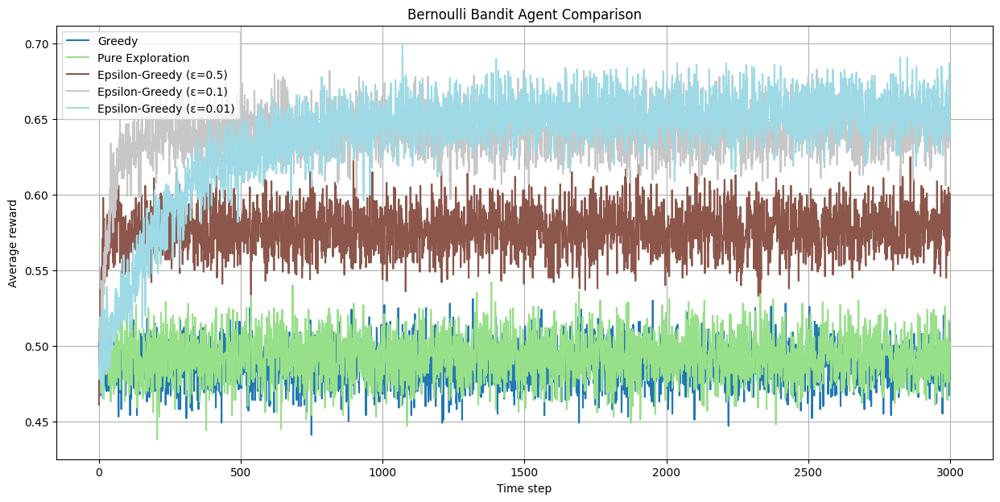

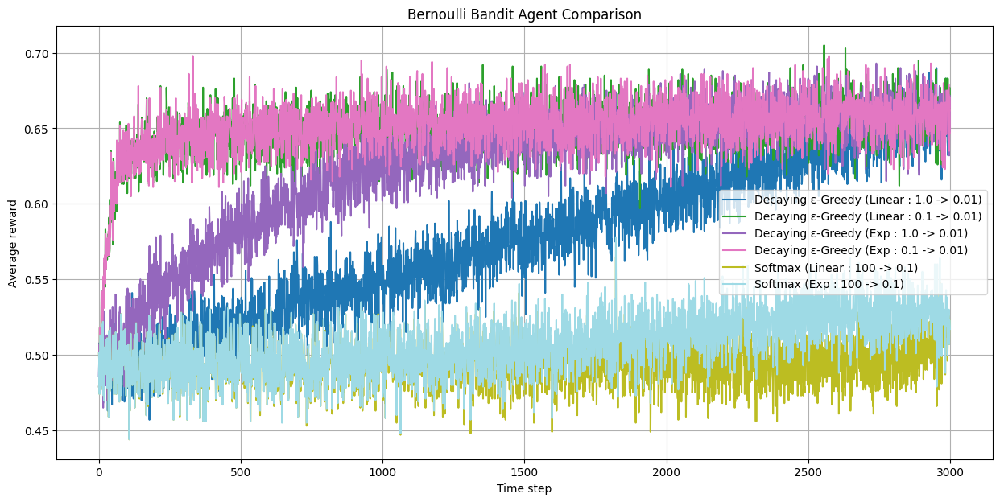

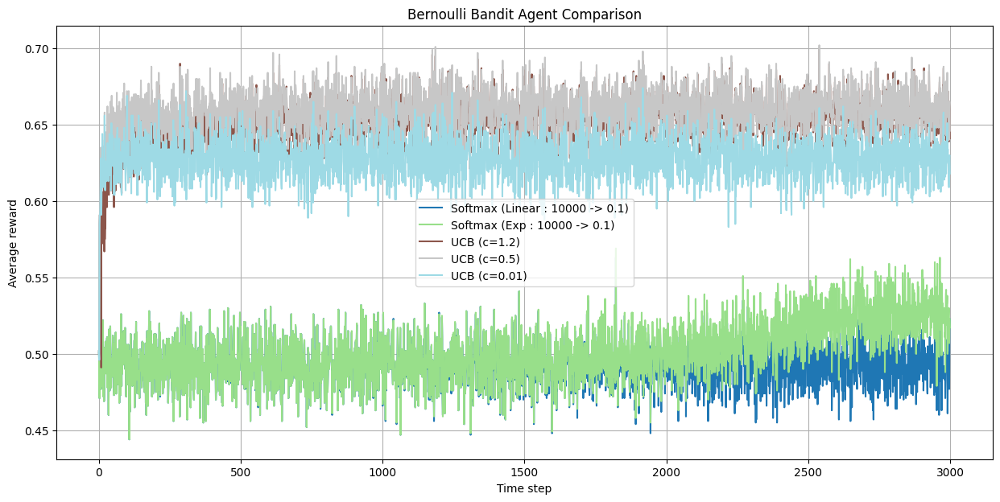

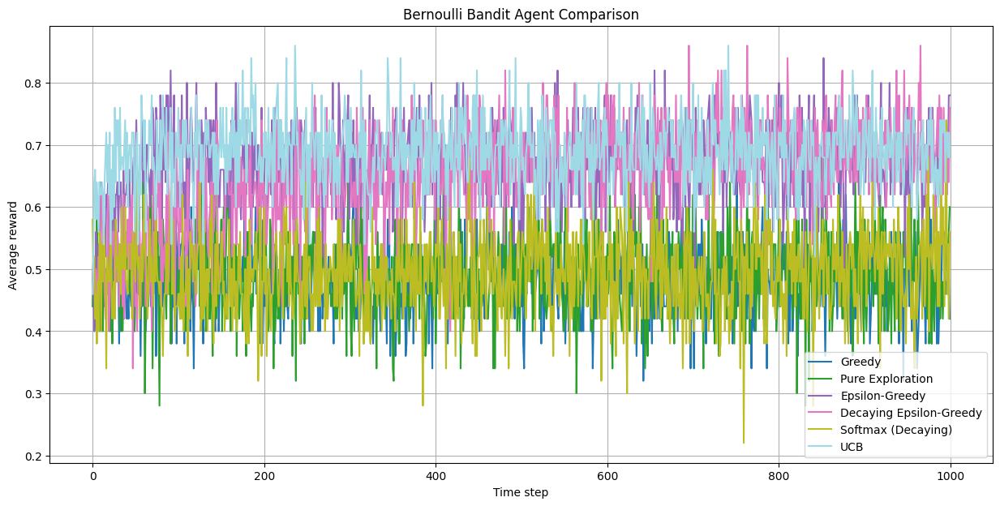

In [28]:
# TODO: Define the agents and hyperparameters you want to compare

agents_to_test = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Decaying Epsilon-Greedy",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Decaying)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "UCB",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    }
]

agents_to_test1 = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy (ε=0.5)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.5}
    },
    {
        "name": "Epsilon-Greedy (ε=0.1)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Epsilon-Greedy (ε=0.01)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.01}
    }
]

agents_to_test2 = [
    {
        "name": "Decaying ε-Greedy (Linear : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Linear : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Linear : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "exponential"}
    }
]

agents_to_test3 = [
    {
        "name": "Softmax (Linear : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "exponential"}
    },
    {
        "name": "UCB (c=1.2)",
        "func": ucb_strategy,
        "params": {"c": 1.2}
    },
    {
        "name": "UCB (c=0.5)",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    },
    {
        "name": "UCB (c=0.01)",
        "func": ucb_strategy,
        "params": {"c": 0.01}
    }
]


# TODO: Loop through 'agents_to_test':
#   1. Call run_experiment_bernoulli for each agent.
#   2. Store the resulting curve in a dictionary (e.g., experiment_results_bernoulli).

# TODO: Call plot_agent_comparison(experiment_results_bernoulli).

'''
You must run the experiment multiple times with different configurations, diff agents_to_test, for example:

Different values of epsilon for epsilon-greedy (e.g., 0.01, 0.1, 0.5)

Different decay types (linear vs exponential)

Different UCB values (e.g., c = 0.2, 0.5, 1.0)

Different Softmax temperatures
'''

# ------------------------ running for 1000 envs and 3000 steps for better plots ----------------------------------
np.random.seed(42)
agent_dict1 = {}
for agent_info in agents_to_test1:
    agent_dict1[agent_info["name"]] = run_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 1000,steps = 3000)
plot_agent_comparison(agent_dict1)

np.random.seed(42)
agent_dict2 = {}
for agent_info in agents_to_test2:
    agent_dict2[agent_info["name"]] = run_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_agent_comparison(agent_dict2)

np.random.seed(42)
agent_dict3 = {}
for agent_info in agents_to_test3:
    agent_dict3[agent_info["name"]] = run_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_agent_comparison(agent_dict3)

# ------------------------ running for 50 envs and 1000 steps ----------------------------------

np.random.seed(42)
agent_dict = {}
for agent_info in agents_to_test:
    agent_dict[agent_info["name"]] = run_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 50, steps = 1000)
plot_agent_comparison(agent_dict)

**Observations:**

[Write your observations about the question and its solution here]

In 4th plot, I have taken 50 envs and run it for 1000 steps, but as figure conveyed, curves are very noisy making it difficult to see which strategy is truly better. So, made observations based on first 3 plots:

1. Greedy Strategy: The agent frequently gets stuck selecting a suboptimal arm because it lacks exploration; wrong early estimates cannot be corrected without it. This results in a significantly lower average reward that remains flat and stagnant over time.

2. Pure Exploration: The agent continues to select arms randomly even after identifying the optimal one, wasting pulls on suboptimal arms.This leads to a low, fluctuating average reward that never converges toward the optimal value.

3. $\epsilon$-greedy Strategy:

    1. $\epsilon = 0.5$: The average reward remains almost constant at a mediocre level because excessive exploration prevents the agent from fully exploiting the optimal arm.
    
    2. $\epsilon = 0.1$: The agent explores enough to discover the optimal arm and then exploits it, achieving a high, near-optimal average reward.
    
    3. $\epsilon = 0.01$: The agent explores very little, leading to slow convergence as early wrong estimates take much longer to correct compared to the $\epsilon = 0.1$ case.
    
4. Decaying $\epsilon$-greedy Strategy:

    1. Linear Decay:
    
        1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: High early exploration causes slow initial convergence; the reward increases very gradually over the 3,000 steps.

        2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: Balanced early exploration and sufficient later exploitation lead to fast convergence to a high average reward.
        
    2. Exponential Decay:
    
        1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: The reward gradually improves and converges toward the optimal value, but the process is slower than the low-start variant due to excessive early exploration.
        
        2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: Performance is equivalent to the high-performing linear decay variant, achieving near-optimal rewards rapidly.
        
5. Softmax Strategy:

    1. Linear Decay:
    
        1. t-start = 100, t-end = 0.1: Performance remains stagnant at ~0.5 average reward, indicating the temperature remains too high to allow the agent to transition from random exploration to exploitation.
        
        2. t-start = 10,000, t-end = 0.1: The extremely high temperature forces excessive exploration for too long, leading to significantly slower convergence and lower overall rewards.
        
    2. Exponential Decay:
    
        1. t-start = 100, t-end = 0.1: The agent may pick a suboptimal arm due to early wrong estimates combined with a fast temperature drop, causing premature exploitation and a lower average reward.
        
        2. t-start = 10,000, t-end = 0.1: The agent remains trapped in a loop of random choices; the overwhelming initial temperature drowns out any learning signal, leaving the reward curve flat.
        
6. UCB (Upper Confidence Bound) Strategy:

    1. $c = 1.2$: The agent tries all arms initially due to the high uncertainty bonus. While this leads to a strong final average reward, convergence is slightly slower than lower $c$ values due to persistent exploration.
    
    2. $c = 0.5$: This provides the best balance between exploration and exploitation in these plots, reaching the optimal average reward faster than the other UCB variants.
    
    3. $c = 0.01$: The minimal exploration bonus keeps the agent nearly greedy; it achieves a solid 0.63 reward, though it lacks just enough curiosity to bridge the gap to the 0.67 peak seen with more active exploration.

\
Note: Seed used here are from 9 to 1008.

### 5. 10-armed bandit testbed (20 points)
Repeat the same thing as above for 10-armed Gaussian Bandit.

In [29]:
def run_experiment_gaussian(agent_func, agent_params,
                                       num_envs=50, steps=1000, sigma=1.0):
    """
    Runs an agent on multiple 10-armed Gaussian bandit environments and
    returns the average reward per time step.

    Args:
        agent_func: Agent function from Question 3.
        agent_params: Dictionary of agent hyperparameters.
        num_envs: Number of environments.
        steps: Number of steps per environment.
        sigma: Reward noise standard deviation.

    Returns:
        avg_rewards: Array of average rewards (length = steps).

    NOTE: increase the num_envs to get the much smoother curve. maybe 500 or 1000
    """

    # Write your code here

    # (using seed from 2001 to 3000)
    avg_rewards = np.zeros(steps)
    num_arms = 10

    for i in range(num_envs):
      seed = 2001 + i
      np.random.seed(seed)
      random.seed(seed)

      env = TenArmedGaussianBandit(num_arms, sigma)
      env.reset(seed = seed)

      _, rewards = agent_func(env, steps, **agent_params)
      avg_rewards += np.array(rewards)

    return avg_rewards / num_envs


In [30]:
def plot_agent_comparison(results_dict):
    """
    same as Q4
    Plots average reward vs time step for multiple agents. (in single graph)

    Args:
        results_dict: Dictionary mapping agent name -> avg reward array.
    """
    # TODO:
    # 1. Create a matplotlib figure
    # 2. For each agent:
    #    - Plot average rewards vs time step
    #    - Use agent name as label
    # 3. Add title, axis labels, legend, and grid
    # 4. Show the plot
    plt.figure(figsize=(15, 7))
    colors = mlt.colormaps["tab20"](np.linspace(0, 1, len(results_dict)))

    for i, (agent_name, rewards) in enumerate(results_dict.items()):
        plt.plot(rewards, label=agent_name, color = colors[i])

    plt.xlabel("Time step")
    plt.ylabel("Average reward")
    plt.title("10-armed Gaussian Bandit Agent Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()


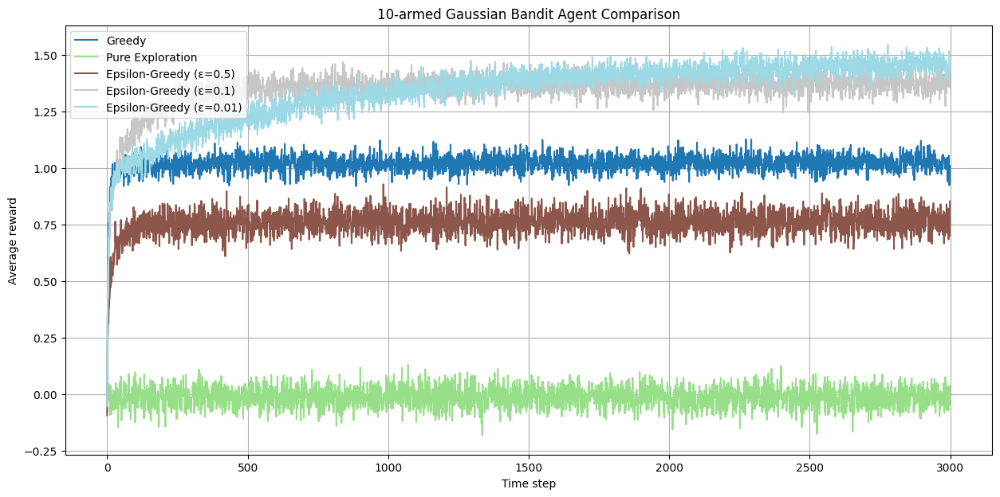

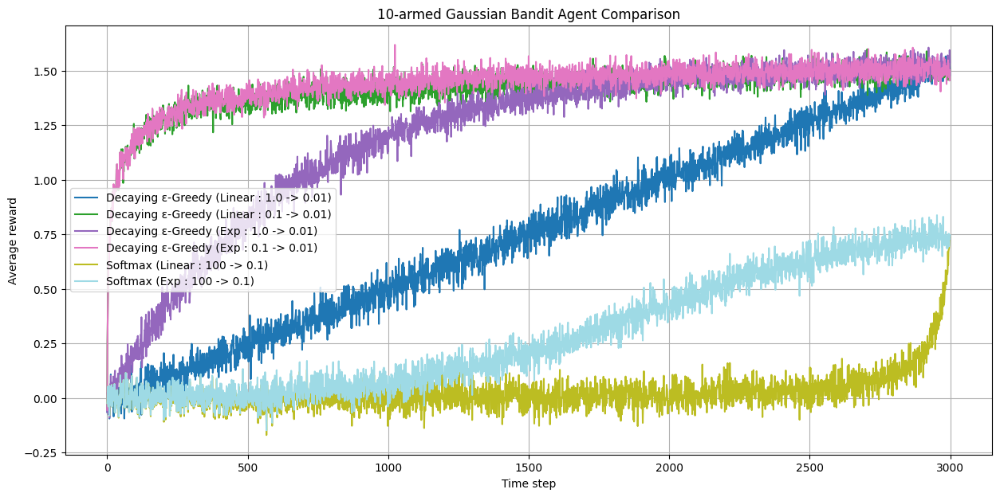

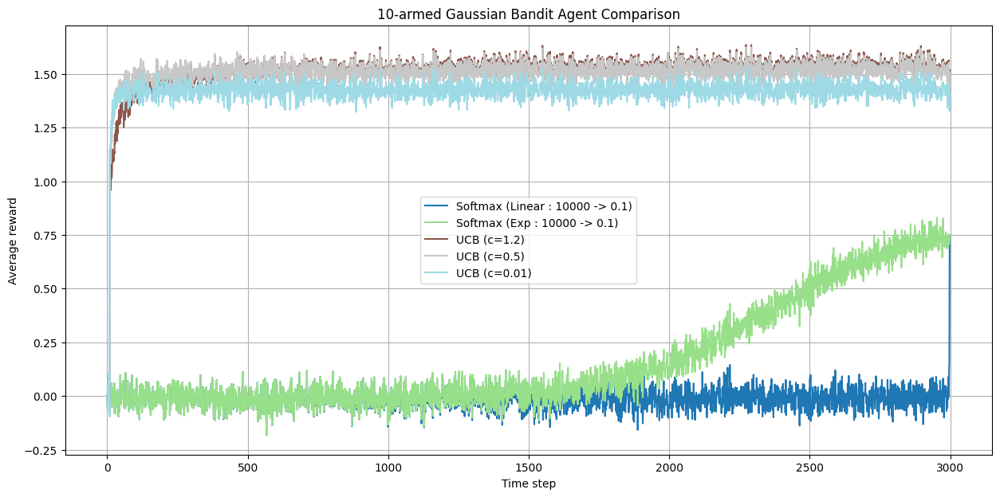

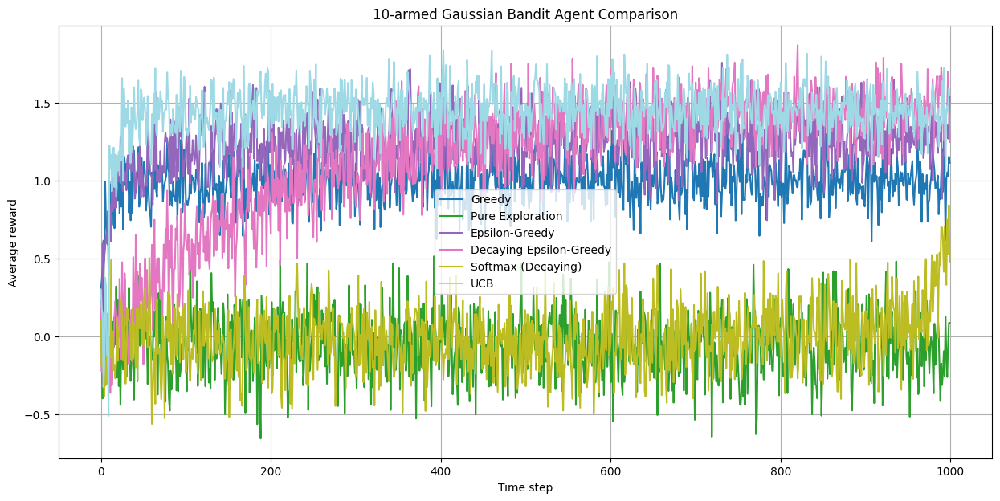

In [31]:
# TODO: Define the agents and hyperparameters you want to compare

agents_to_test = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Decaying Epsilon-Greedy",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Decaying)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "UCB",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    }
]

agents_to_test1 = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy (ε=0.5)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.5}
    },
    {
        "name": "Epsilon-Greedy (ε=0.1)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Epsilon-Greedy (ε=0.01)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.01}
    }
]

agents_to_test2 = [
    {
        "name": "Decaying ε-Greedy (Linear : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Linear : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Linear : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "exponential"}
    }
]

agents_to_test3 = [
    {
        "name": "Softmax (Linear : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "exponential"}
    },
    {
        "name": "UCB (c=1.2)",
        "func": ucb_strategy,
        "params": {"c": 1.2}
    },
    {
        "name": "UCB (c=0.5)",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    },
    {
        "name": "UCB (c=0.01)",
        "func": ucb_strategy,
        "params": {"c": 0.01}
    }
]



# TODO: Loop through 'agents_to_test':
#   1. Call run_experiment_gaussian for each agent.
#   2. Store the resulting curve in a dictionary (e.g., experiment_results_gaussian).

# TODO: Call plot_agent_comparison(experiment_results_gaussian).

'''
You must run the experiment multiple times with different configurations, diff agents_to_test, for example:

Different values of epsilon for epsilon-greedy (e.g., 0.01, 0.1, 0.5)

Different decay types (linear vs exponential)

Different UCB values (e.g., c = 0.2, 0.5, 1.0)

Different Softmax temperatures
'''

# ------------------------ running for 1000 envs and 3000 steps for better plots ---------------
np.random.seed(42)
random.seed(42)
agent_dict1 = {}
for agent_info in agents_to_test1:
    agent_dict1[agent_info["name"]] = run_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000,steps = 3000)
plot_agent_comparison(agent_dict1)

np.random.seed(42)
random.seed(42)
agent_dict2 = {}
for agent_info in agents_to_test2:
    agent_dict2[agent_info["name"]] = run_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_agent_comparison(agent_dict2)

np.random.seed(42)
random.seed(42)
agent_dict3 = {}
for agent_info in agents_to_test3:
    agent_dict3[agent_info["name"]] = run_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)

plot_agent_comparison(agent_dict3)

# ------------------------ running for 50 envs and 1000 steps ----------------------------------

np.random.seed(42)
random.seed(42)
agent_dict = {}
for agent_info in agents_to_test:
    agent_dict[agent_info["name"]] = run_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 50, steps = 1000)

plot_agent_comparison(agent_dict)

**Observations:**

[Write your observations about the question and its solution here]

1. Greedy Strategy: In the Bernoulli case, the average reward stagnates at a low level (approx. 0.5) because the agent lacks exploration; early incorrect estimates cannot be corrected and here for 10-armed environment, the reward stabilizes quickly around 1.0, but this is significantly lower than the optimal potential (approx. 1.5+), indicating it settled on a suboptimal arm.

2. Pure Exploration: The agent selects arms randomly, resulting in an average reward that fluctuates around 0.5 in the 2-armed case and stays near 0.0 in the 10-armed case. It fails to converge because it continues to waste pulls on suboptimal arms even after identifying better options.

3. $\epsilon$-Greedy Strategy:

    1. $\epsilon = 0.5$: The average reward remains almost constant and mediocre (approx. 0.6 for Bernoulli, 0.75 for 10-armed) due to persistent, excessive exploration.
    
    2. $\epsilon = 0.1$: This achieves near-optimal rewards (approx. 0.65 for Bernoulli, 1.4 for 10-armed) as the agent balances sufficient exploration with strong exploitation.
    
    3. $\epsilon = 0.01$: The reward increases very slowly, taking much longer to converge than $\epsilon=0.1$ because early wrong estimates are harder to correct with minimal exploration but finally able to make an avg reward ~1.5 at 3000 steps.
    
4. Decaying $\epsilon$-Greedy Strategy:

    1. Linear Decay:
    
        1. $\epsilon$-start = 1.0 $\rightarrow$ 0.01: High initial exploration leads to a very gradual, linear increase in reward, eventually reaching near-optimal levels by step 3,000.
        
        2. $\epsilon$-start = 0.1 $\rightarrow$ 0.01: Balanced parameters lead to the fastest convergence to a high, stable average reward.
        
    2. Exponential Decay:
    
        1. $\epsilon$-start = 1.0 $\rightarrow$ 0.01: The reward improves gradually, eventually converging to optimal levels, though slower than the 0.1 start variant.
        
        2. $\epsilon$-start = 0.1 $\rightarrow$ 0.01: Works equivalently to the best linear decay agents, reaching peak average rewards rapidly.
        
  5. Softmax Strategy:
  
      1. Linear Decay:
      
          1. t-start = 100 $\rightarrow$ 0.1: Reward stays near 0.0 for almost the entire duration before a sharp, late jump.
          
          2. t-start = 10,000 $\rightarrow$ 0.1: High temperature causes excessive exploration for too long, leading to much slower convergence and lower overall rewards.
          
      2. Exponential Decay:
      
          1. t-start = 100 $\rightarrow$ 0.1: The agent starts slowly with a flat reward curve, but once the temperature cools after 1,000 steps, it begins a steady climb to an impressive 0.75 average reward
          
          2. t-start = 10,000 $\rightarrow$ 0.1: Performs almost similar to its best linear variant, ultimately making an avg reward ~0.75.
          
  6. UCB (Upper Confidence Bound) Strategy:
  
      1. $c = 1.2$: Effectively tries all arms initially due to the high uncertainty bonus, leading to strong final rewards (approx. 1.50+).
      
      2. $c = 0.5$: Provides the most efficient balance in these plots, reaching the optimal average reward faster than other UCB variants.
      
      3. c=0.01 : The minimal exploration bonus keeps the agent nearly greedy; it achieves ~1.35 reward, though it lacks just enough curiosity to bridge the gap to the 1.52 peak seen with more active exploration.
\
Note: Seed used here are from 2001 to 3000.

### 6. 2-armed Regret (20 points)
In the lecture we defined *Regret* as $\sum_{e=1}^{E} \mathbb{E}[v_* - q_*(A_e)]$, i.e. episode wise sum of the expected value of the difference between optimal action value ($v_*$) and true value ($q_*$) of taking an action $A_e$. For the 2-armed Bernoulli Bandit plot the regret vs episodes for each of the agent. Use the same setting of 50 environment instances as in the previous part. What do you observe? How do regrets evolve for different methods? Describe your observations in details.



In [35]:
def run_regret_experiment_bernoulli(agent_func, agent_params,
                                    num_envs=50, steps=1000):
    """
    Runs a bandit agent on multiple 2-armed Bernoulli environments and
    computes the average cumulative regret.

    Args:
        agent_func: Agent function (from Question 3).
        agent_params: Dictionary of agent hyperparameters.
        num_envs: Number of environments to average over.
        steps: Number of episodes per environment.

    Returns:
        avg_cumulative_regret: Cumulative expected regret (length = steps).
    """

    # Write your code here
    avg_cum_regret = np.zeros(steps)

    for i in range(num_envs):
      seed = 9 + i
      np.random.seed(seed)
      random.seed(seed)
      alpha = np.random.uniform(0,1)
      beta = np.random.uniform(0,1)

      env = TwoArmedBernoulliBandit(alpha, beta)
      env.reset(seed = seed)

      actions, _ = agent_func(env, steps, **agent_params)

      true_value = [alpha, beta]
      optimal_value = max(true_value)
      true_action_value = np.array([true_value[arm] for arm in actions])

      cum_regret = np.cumsum(optimal_value - true_action_value)
      avg_cum_regret += cum_regret

    return avg_cum_regret / num_envs

In [36]:
def plot_regret_comparison(results_dict):
    """
    Plots cumulative regret vs episodes for multiple agents.

    Args:
        results_dict: Mapping agent name -> cumulative regret array.
    """
    # Write your code here
    color = mlt.colormaps["tab20"](np.linspace(0, 1, len(results_dict)))
    plt.figure(figsize=(15,7))

    for i, (agent_name, regret) in enumerate(results_dict.items()):
        plt.plot(regret, label=agent_name, color = color[i])

    plt.xlabel("Time step")
    plt.ylabel("Average Cummulative regret")
    plt.title("Bernoulli Bandit Regret Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

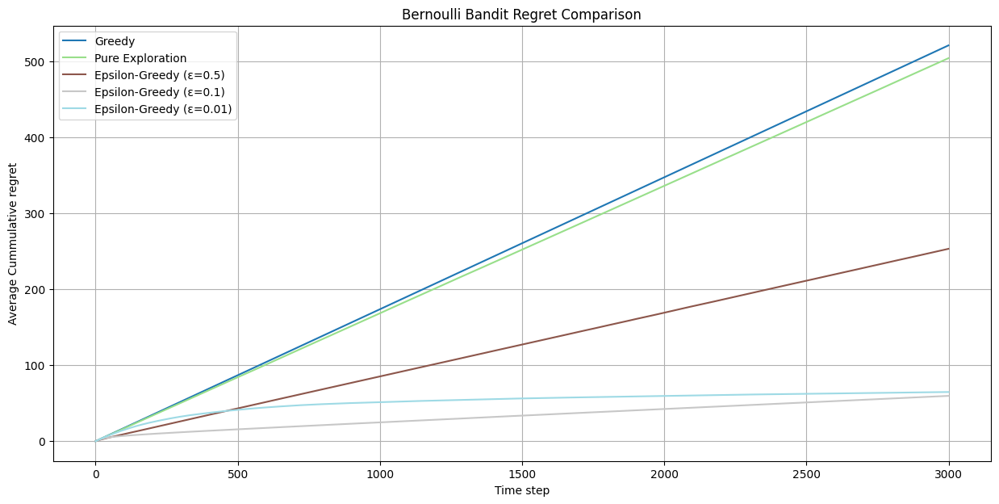

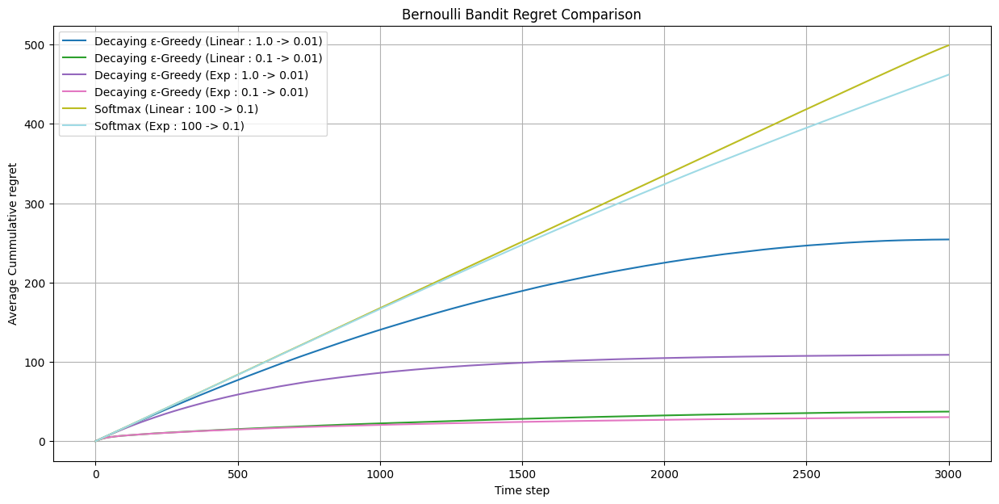

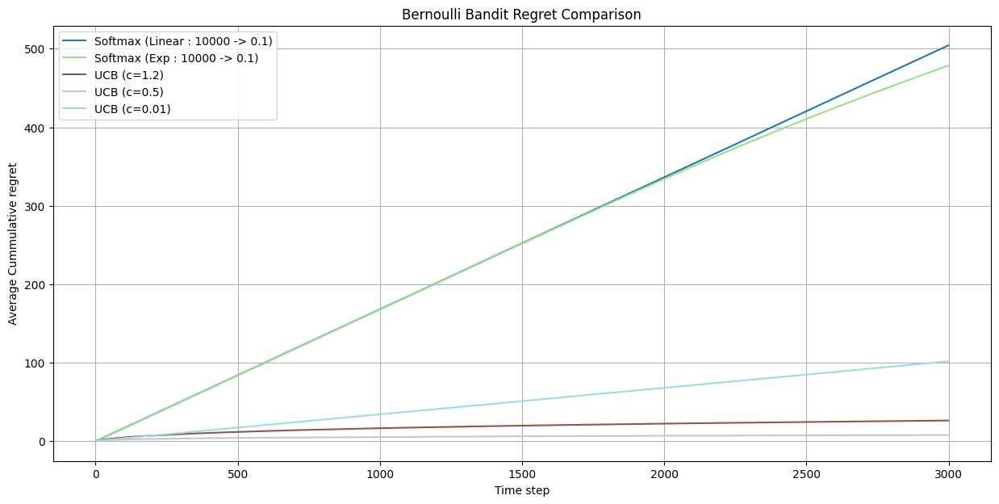

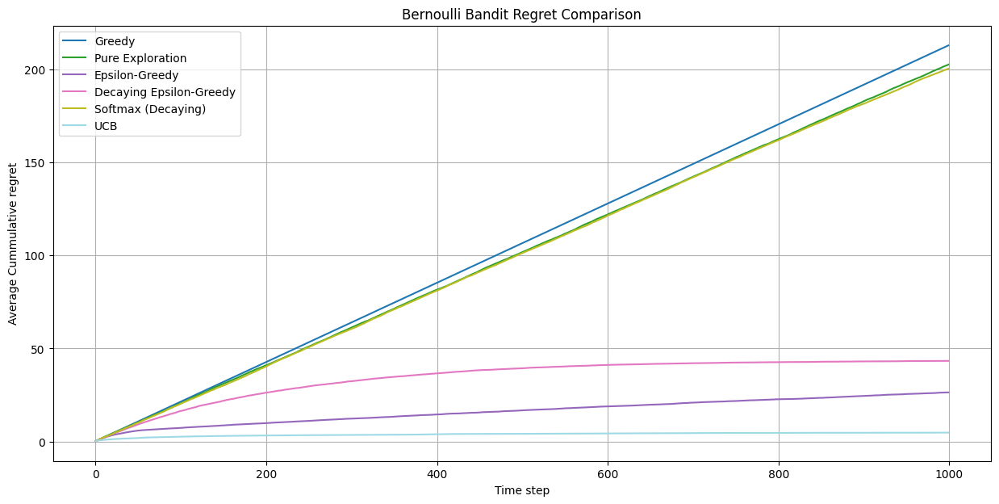

In [37]:
'''
Use the same setting of 50 environment
instances as in the previous part. What do you observe? How do regrets evolve for different methods?
Describe your observations in details.
'''

agents_to_test = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Decaying Epsilon-Greedy",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Decaying)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "UCB",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    }
]

agents_to_test1 = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy (ε=0.5)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.5}
    },
    {
        "name": "Epsilon-Greedy (ε=0.1)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Epsilon-Greedy (ε=0.01)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.01}
    }
]

agents_to_test2 = [
    {
        "name": "Decaying ε-Greedy (Linear : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Linear : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Linear : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "exponential"}
    }
]

agents_to_test3 = [
    {
        "name": "Softmax (Linear : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "exponential"}
    },
    {
        "name": "UCB (c=1.2)",
        "func": ucb_strategy,
        "params": {"c": 1.2}
    },
    {
        "name": "UCB (c=0.5)",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    },
    {
        "name": "UCB (c=0.01)",
        "func": ucb_strategy,
        "params": {"c": 0.01}
    }
]

# -------------------- running for 1000 envs and 3000 steps for smooth curves -----------------------
np.random.seed(42)
random.seed(42)
agent_dict1 = {}
for agent_info in agents_to_test1:
    agent_dict1[agent_info["name"]] = run_regret_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 1000,steps = 3000)
plot_regret_comparison(agent_dict1)

np.random.seed(42)
random.seed(42)
agent_dict2 = {}
for agent_info in agents_to_test2:
    agent_dict2[agent_info["name"]] = run_regret_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 1000,steps = 3000)
plot_regret_comparison(agent_dict2)

np.random.seed(42)
random.seed(42)
agent_dict3 = {}
for agent_info in agents_to_test3:
    agent_dict3[agent_info["name"]] = run_regret_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 1000,steps = 3000)
plot_regret_comparison(agent_dict3)

# -------------------- running for 50 envs and 1000 steps (as mentioned) ----------------------------

np.random.seed(42)
random.seed(42)
agent_dict = {}
for agent_info in agents_to_test:
    agent_dict[agent_info["name"]] = run_regret_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs = 50,steps = 1000)
plot_regret_comparison(agent_dict)

**Observations:**

[Write your observations about the question and its solution here]

1. Greedy Agent: The regret curve increases linearly at a steep constant rate, reaching 500+ in 3000 steps. This indicates that agent is likely to identify a sub-optimal arm early and stops exploring, resulting in continuous, high regret.

2. Pure Exploration Agent: The regret curve is nearly identical to the Greedy agent, also reaching 500 in 3000 steps. While this agent explores several arms, it fails to transition to exploitation, meaning it never "picks" the optimal arm to reduce its accumulated regret.

3. $\epsilon$-Greedy Strategy

    1. $\epsilon = 0.5$: The regret increases linearly but with a lower slope than the Greedy agent, ending at roughly 250. This shows that while high exploration prevents getting "stuck" as badly as Greedy, it still explores far too much to achieve low regret.

    2. $\epsilon = 0.1$: This curve is significantly lower and sub-linear, flattening out as the agent identifies the optimal arm. It achieves the lowest regret in the first plot (around 60), representing a strong balance of exploration and exploitation.

    3. $\epsilon = 0.01$: The curve is sub-linear but has a steeper initial slope than $\epsilon = 0.1$, ending at roughly 65. This implies that with very low exploration, the agent takes much longer to discover the optimal arm.

  4. Decaying $\epsilon$-Greedy Strategy
  
      1. Linear Decay:
          
          1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: Shows high initial regret due to excessive early exploration, eventually curving to end at roughly 250.
          
          2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: The curve is much flatten and lower, indicating that starting with a more reasonable exploration rate leads to faster convergence and very low final regret.
        
      2. Exponential Decay:
      
          1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: Converges much faster than its linear counterpart, flattening out to reach approximately 110 in 3000 steps.
          
          2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: This is one of the top-performing strategies, showing an almost flat curve that achieves very low regret quickly.
          
  5. Softmax Strategy
      
      1. Linear Decay:
        
          1. t-start = 100, t-end = 0.1: This follows a steep linear path similar to the Greedy/Exploration agents, ending near 500.
          
          2. t-start = 10000, t-end = 0.1: Increasing the temperature to 10,000 causes even higher initial exploration; the regret remains linear and high because the exploration phase lasts too long.
        
      2. Exponential Decay:
        
          1. t-start = 100, t-end = 0.1: Shows linear behavior and ends significantly higher (around 450) than $\epsilon$-greedy methods, likely due to premature exploitation of a sub-optimal arm after a fast temperature drop.
          
          2. t-start = 10000, t-end = 0.1: While it begins with steep regret, the exponential drop allows it to eventually starts flattening slightly better than the linear version, though it still finishes with high regret (around 470).
          
  6. UCB (Upper Confidence Bound) Strategy
      
      1. $c = 1.2$: Performs exceptionally well, finishing just slightly above the $c=0.5$ agent. It achieves a near-optimal reward very early in the simulation.

      2. $c = 0.5$: This is the best performing agent overall. The curve is almost perfectly flat and stays near zero regret, as the uncertainty bonus effectively manages exploration without wasting steps once the optimal arm is found.
      
      3. $c = 0.01$: Shows a significantly higher linear slope compared to other UCB values, ending near 100. Because the exploration bonus is so small, it acts almost like a Greedy agent and likely gets stuck on a sub-optimal choice.
\
Note:  Seed used here are from 9 to 1008.

### 7. 10-armed Regret (20 points)

Repeat the same thing as above for 10-armed Gaussian Bandit.



In [38]:
def run_regret_experiment_gaussian(agent_func, agent_params,
                                   num_envs=50, steps=1000):
    """
    Runs a bandit agent on multiple 10-armed Gaussian environments and
    computes the average cumulative regret.

    Args:
        agent_func: Agent function.
        agent_params: Dictionary of agent hyperparameters.
        num_envs: Number of environments to average over.
        steps: Number of episodes per environment.

    Returns:
        avg_cumulative_regret: Cumulative expected regret (length = steps).
    """
    # Write your code here
    avg_cum_regret = np.zeros(steps)
    num_arms = 10
    sigma = 1.0

    # Write your code here
    for i in range(num_envs):
      seed = 2001 + i
      np.random.seed(seed)
      random.seed(seed)

      env = TenArmedGaussianBandit(num_arms, sigma)
      env.reset(seed = seed)

      true_value = env.q_star
      optimal_value = max(true_value)

      actions, _ = agent_func(env, steps, **agent_params)

      true_action_value = np.array([true_value[arm] for arm in actions])
      cum_regret = np.cumsum(optimal_value - true_action_value)
      avg_cum_regret += cum_regret

    return avg_cum_regret / num_envs

In [39]:
def plot_regret_comparison(results_dict):
    """
    same as q6
    Plots cumulative regret vs episodes for multiple agents.

    Args:
        results_dict: Mapping agent name -> cumulative regret array.
    """
    # Write your code here
    color = mlt.colormaps["tab20"](np.linspace(0, 1, len(results_dict)))
    plt.figure(figsize=(15, 7))

    for i, (agent_name, regret) in enumerate(results_dict.items()):
        plt.plot(regret, label=agent_name, color=color[i])

    plt.xlabel("Time step")
    plt.ylabel("Average Cummulative regret")
    plt.title("10-armed Gaussian Bandit regret Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

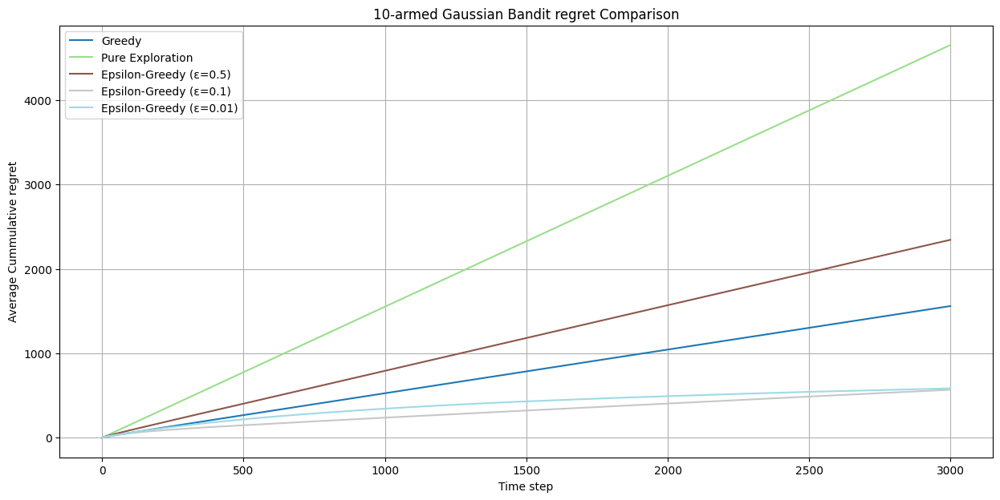

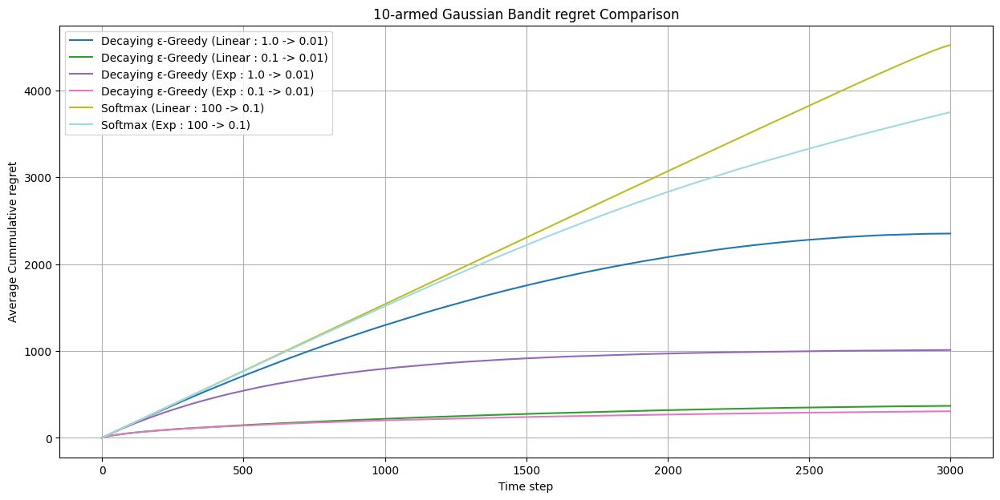

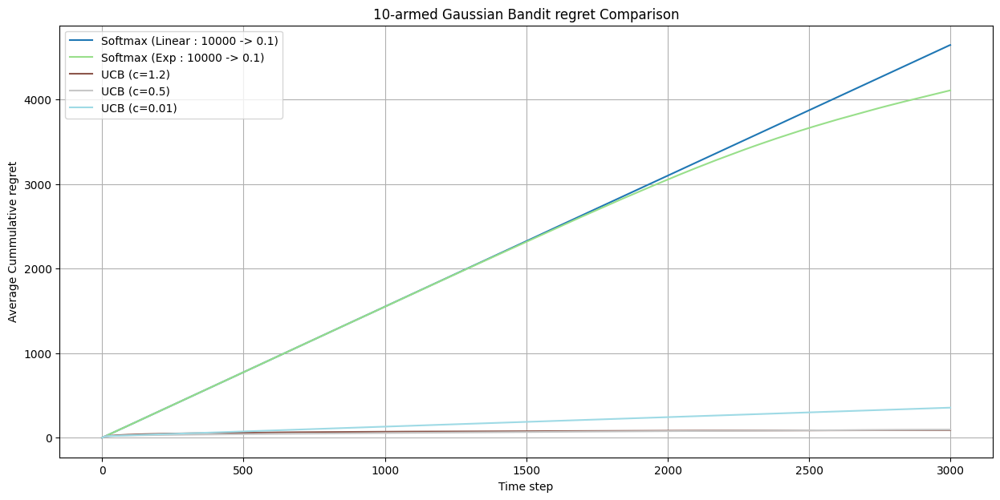

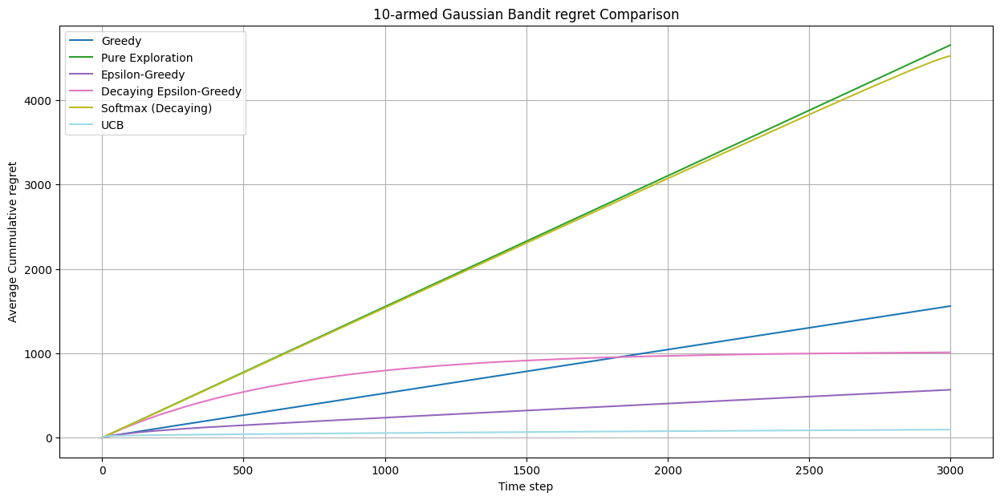

In [40]:
'''
Use the same setting of 50 environment
instances as in the previous part. What do you observe? How do regrets evolve for different methods?
Describe your observations in details.
'''

agents_to_test = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Decaying Epsilon-Greedy",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Decaying)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "UCB",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    }
]

agents_to_test1 = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy (ε=0.5)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.5}
    },
    {
        "name": "Epsilon-Greedy (ε=0.1)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Epsilon-Greedy (ε=0.01)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.01}
    }
]

agents_to_test2 = [
    {
        "name": "Decaying ε-Greedy (Linear : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Linear : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Linear : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "exponential"}
    }
]

agents_to_test3 = [
    {
        "name": "Softmax (Linear : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "exponential"}
    },
    {
        "name": "UCB (c=1.2)",
        "func": ucb_strategy,
        "params": {"c": 1.2}
    },
    {
        "name": "UCB (c=0.5)",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    },
    {
        "name": "UCB (c=0.01)",
        "func": ucb_strategy,
        "params": {"c": 0.01}
    }
]



# TODO: Loop through 'agents_to_test':
#   1. Call run_experiment_gaussian for each agent.
#   2. Store the resulting curve in a dictionary (e.g., experiment_results_gaussian).

# TODO: Call plot_agent_comparison(experiment_results_gaussian).

'''
You must run the experiment multiple times with different configurations, diff agents_to_test, for example:

Different values of epsilon for epsilon-greedy (e.g., 0.01, 0.1, 0.5)

Different decay types (linear vs exponential)

Different UCB values (e.g., c = 0.2, 0.5, 1.0)

Different Softmax temperatures
'''
# ---------------------- runnning for 1000 envs and 3000 steps for smooth curves -----------

np.random.seed(42)
random.seed(42)
agent_dict1 = {}
for agent_info in agents_to_test1:
    agent_dict1[agent_info["name"]] = run_regret_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_regret_comparison(agent_dict1)

np.random.seed(42)
random.seed(42)
agent_dict2 = {}
for agent_info in agents_to_test2:
    agent_dict2[agent_info["name"]] = run_regret_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_regret_comparison(agent_dict2)

np.random.seed(42)
random.seed(42)
agent_dict3 = {}
for agent_info in agents_to_test3:
    agent_dict3[agent_info["name"]] = run_regret_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_regret_comparison(agent_dict3)

# -------------------- running for 50 envs and 1000 steps ----------------------------------

np.random.seed(42)
random.seed(42)
agent_dict = {}
for agent_info in agents_to_test:
    agent_dict[agent_info["name"]] = run_regret_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs = 1000, steps = 3000)
plot_regret_comparison(agent_dict)

**Observations:**

1. Greedy Agent: The regret curve increases linearly, reaching approximately 1,500 in 3,000 steps. Unlike the 2-armed case, the slope is lower than pure exploration, indicating that while it often gets stuck on sub-optimal arms, it still performs better than random guessing in a higher-dimensional space.

2. Pure Exploration Agent: The regret curve shows the highest linear increase, reaching nearly 4,500 in 3,000 steps. In a 10-armed environment, exploring indefinitely is extremely costly because the agent spends 90% of its time on sub-optimal arms.

3. $\epsilon$-Greedy Strategy

    1. $\epsilon = 0.5$: The regret curve increases linearly to approximately 2,300. The slope is higher than the greedy agent because it forces excessive exploration in a multi-arm environment where the cost of "guessing wrong" is high.
    
    2. $\epsilon = 0.1$: This is the best-performing static $\epsilon$ strategy, showing a sub-linear curve that flattens significantly, ending near 600.
    
    3. $\epsilon = 0.01$: Similar to the 2-armed case, this curve is sub-linear but flattens much more slowly than $\epsilon = 0.1$, ending around 600. The low exploration rate makes it take longer to "find" the best arm among the ten options.
    
4. Decaying $\epsilon$-Greedy Strategy

    1. Linear Decay:
    
        1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: Shows steep initial regret that eventually curves, ending at roughly 2,300.
        
        2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: One of the top performers, maintaining a very low, nearly flat curve ending under 400.
        
    2. Exponential Decay:
    
        1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: Shows a clear sub-linear "knee" around step 1,000 and flattens to end near 2,000.

        2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: Achieves the lowest final regret among all $\epsilon$-greedy methods, with a nearly horizontal curve.
        
  5. Softmax Strategy
  
      1. Linear Decay:
      
          1. t-start = 100, t-end = 0.1: The regret increases linearly at a very steep rate, ending near 4,600.
          
          2. t-start = 10000, t-end = 0.1: Similar to the linear 100 case, the extremely high temperature causes the agent to behave like a pure exploration agent for the duration of the test, ending near 4,600.
          
      2. Exponential Decay:
      
          1. t-start = 100, t-end = 0.1: Shows a linear slope ending around 3,800. The fast decay leads to premature exploitation of whatever arm looked best early on.
          
          2. t-start = 10000, t-end = 0.1: Initially matches the linear slope but begins to show slight sub-linear curvature toward the end, finishing near 4,100.
          
  6. UCB (Upper Confidence Bound) Strategy
  
      1. $c = 1.2$: An exceptionally strong performer, with a curve that flattens almost immediately, ending with very low regret (near 50).
      
      2. $c = 0.5$: Matches the $c=1.2$ performance nearly perfectly, demonstrating UCB's efficiency in managing a 10-arm search space.
      
      3. $c = 0.01$: Unlike the other UCB variants, this shows a higher linear slope, ending near 400. With such a low exploration bonus, it behaves more like the greedy agent and takes longer to identify the optimal arm among the many sub-optimal ones.
\
Note: Seed used here are from 2001 to 3000.

![plot](https://i.postimg.cc/k4NtGvZP/Screenshot-2026-01-18-at-2-55-16-PM.png)

### 8. Reward vs episodes for all agents (20 points)

Plot average rewards vs episodes for each of the 6 agents in the same plot. Basically, for each agent, run 50 instances of 2-armed Bernoulli Bandit environment, run the agent for 1000 episodes; calculate the average reward at each step across all 50 instances and plot the average reward vs episodes. Just to give an example of the plot see the top plot in Figure 2.


In [41]:
'''
You may have already implemented the required experimental setup in a previous question.
In your observations, explicitly mention: Which previous question this experiment overlaps with if it does.

If you believe this experiment is not identical to what you implemented earlier,
clearly explain why and provide the necessary code. Feel free to add the code cells below.
'''

'\nYou may have already implemented the required experimental setup in a previous question.\nIn your observations, explicitly mention: Which previous question this experiment overlaps with if it does.\n\nIf you believe this experiment is not identical to what you implemented earlier,\nclearly explain why and provide the necessary code. Feel free to add the code cells below.\n'

**Observations:**

[Write your observations about the question and its solution here]

Already done in Question 3

(where each agent runs over 1000 envs within which it runs for 3000 steps or episodes)

Note: Multi Arm Bandit is a stateless MDP, where agent pulls an arm and get immediate reward and with a single step, an episode ends. So, it is similar to the Question 3.

### 9. Optimal Action % vs episode for all agents (20 points)
Plot % Optimal Action vs episodes for each of the 6 agents in the same plot. Basically, for each agent, run 50 instances of 2-armed Bernoulli Bandit environment, run the agent for 1000 episodes; calculate on an average (across 50 instances) for each episode how often (in %) the agent selects the optimal action and plot % Optimal Action vs episodes. Just to give an example of the plot see the bottom plot in Figure 2.



In [42]:
def run_optimal_action_experiment_bernoulli(agent_func, agent_params,
                                            num_envs=50, steps=1000):
    """
    Runs an agent on multiple 2-armed Bernoulli bandit environments and
    computes the percentage of optimal actions selected per episode.

    Args:
        agent_func: Bandit agent function.
        agent_params: Dictionary of agent hyperparameters.
        num_envs: Number of environments to average over.
        steps: Number of episodes per environment.

    Returns:
        pct_optimal_action: Percentage of optimal action per episode (length = steps).
    """
    # Write your code here
    prcnt_optimal_action = np.zeros(steps)

    for i in range(num_envs):
      seed = i + 9
      np.random.seed(seed)
      random.seed(seed)
      alpha = np.random.uniform(0,1)
      beta = np.random.uniform(0,1)

      env = TwoArmedBernoulliBandit(alpha, beta)
      env.reset(seed = seed)

      actions, _ = agent_func(env, steps, **agent_params)

      optimal_action = np.argmax([alpha, beta])
      prcnt_optimal_action += np.array(actions == optimal_action)

    return prcnt_optimal_action / num_envs

In [43]:
def plot_optimal_action_comparison(results_dict):
    """
    Plots % Optimal Action vs Episodes for multiple agents.

    Args:
        results_dict: Mapping agent name -> % optimal action array.
    """
    # Write your code here
    color = mlt.colormaps["tab20"](np.linspace(0, 1, len(results_dict)))
    plt.figure(figsize=(15, 7))

    for i, (agent_name, rewards) in enumerate(results_dict.items()):
        plt.plot(rewards, label=agent_name, color=color[i])

    plt.xlabel("Time step")
    plt.ylabel("% Optimal Action")
    plt.title("Bernoulli Bandit optimal action % Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

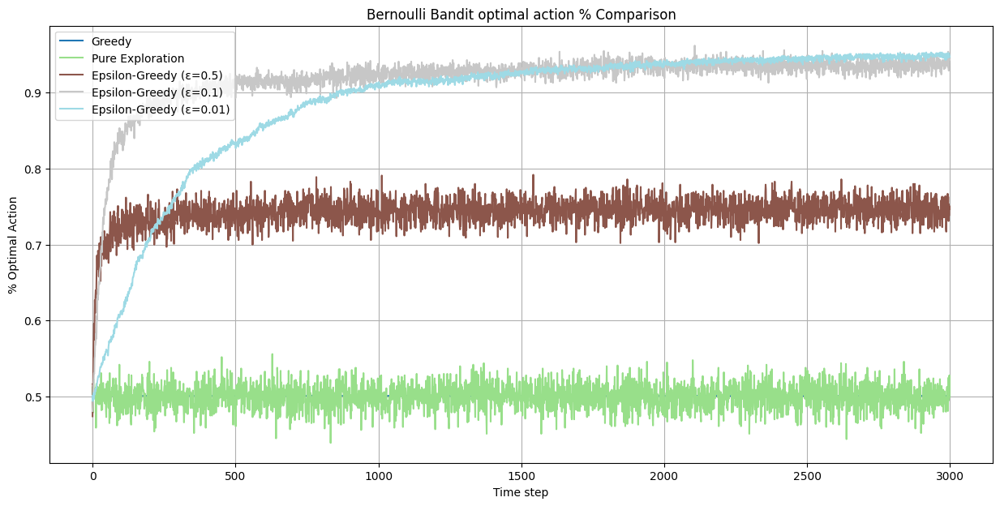

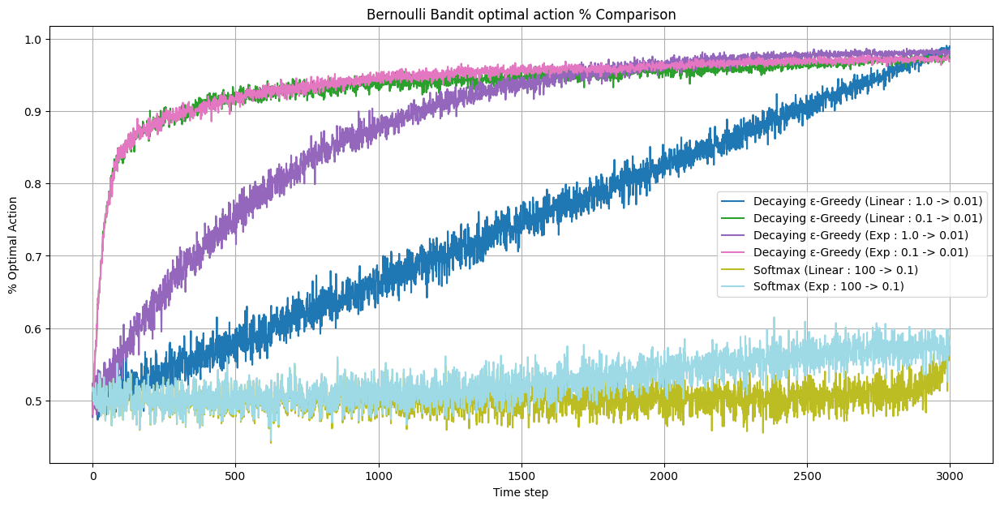

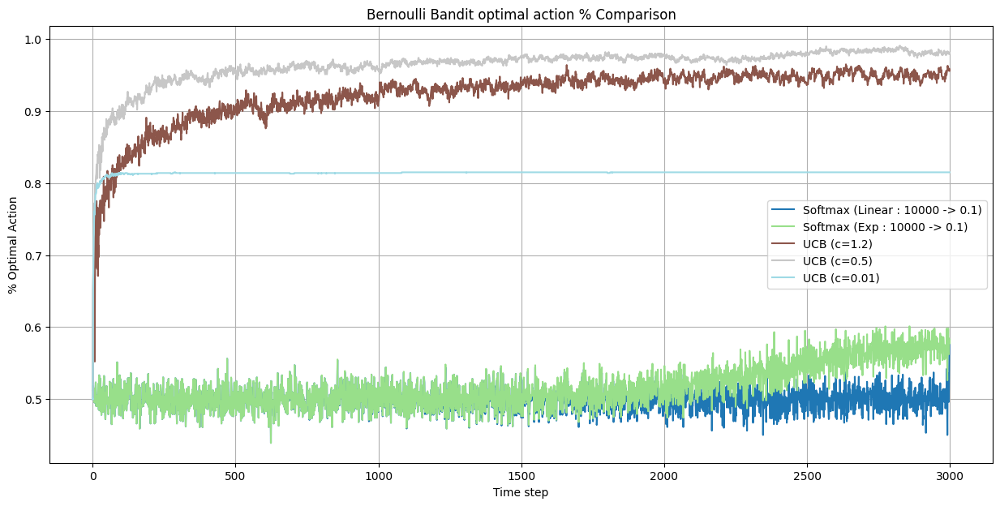

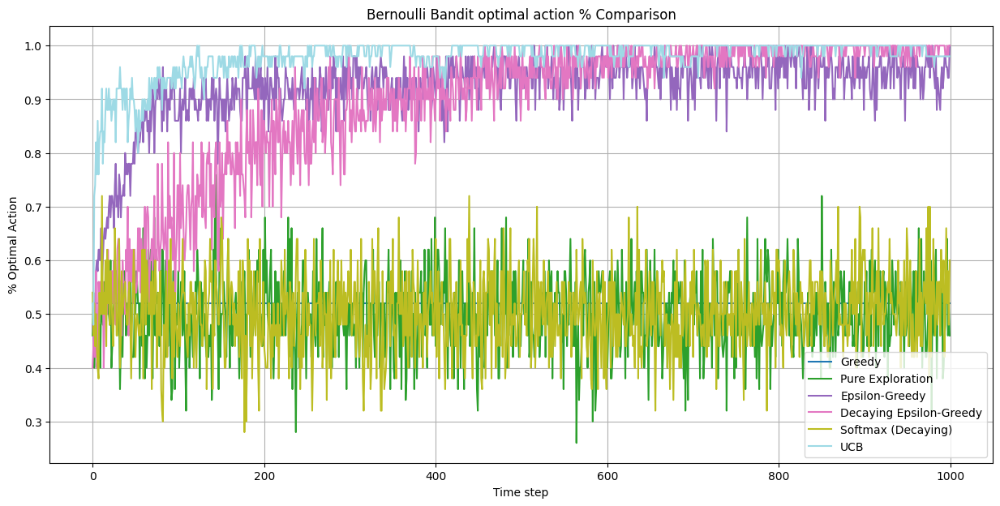

In [44]:
# TODO: Define the agents and hyperparameters you want to compare
# NOTE: set num_envs=500 to see smoother curve!

agents_to_test = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Decaying Epsilon-Greedy",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Decaying)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "UCB",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    }
]

agents_to_test1 = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy (ε=0.5)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.5}
    },
    {
        "name": "Epsilon-Greedy (ε=0.1)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Epsilon-Greedy (ε=0.01)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.01}
    }
]

agents_to_test2 = [
    {
        "name": "Decaying ε-Greedy (Linear : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Linear : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Linear : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "exponential"}
    }
]

agents_to_test3 = [
    {
        "name": "Softmax (Linear : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "exponential"}
    },
    {
        "name": "UCB (c=1.2)",
        "func": ucb_strategy,
        "params": {"c": 1.2}
    },
    {
        "name": "UCB (c=0.5)",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    },
    {
        "name": "UCB (c=0.01)",
        "func": ucb_strategy,
        "params": {"c": 0.01}
    }
]

# TODO: Loop through 'agents_to_test':
#   1. Call run_optimal_action_experiment_bernoulli for each agent.
#   2. Store the resulting curve in a dictionary (e.g., optimal_action_results_bernoulli).

# TODO: Call plot_optimal_action_comparison(optimal_action_results_bernoulli).

# ---------------------- running for 1000 envs and 3000 steps for smooth curves ---------------

np.random.seed(42)
random.seed(42)
optimal_action_results_bernoulli1 = {}
for agent_info in agents_to_test1:
    optimal_action_results_bernoulli1[agent_info["name"]] = run_optimal_action_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs=1000, steps=3000)
plot_optimal_action_comparison(optimal_action_results_bernoulli1)

np.random.seed(42)
random.seed(42)
optimal_action_results_bernoulli2 = {}
for agent_info in agents_to_test2:
    optimal_action_results_bernoulli2[agent_info["name"]] = run_optimal_action_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs=1000, steps=3000)
plot_optimal_action_comparison(optimal_action_results_bernoulli2)

np.random.seed(42)
random.seed(42)
optimal_action_results_bernoulli3 = {}
for agent_info in agents_to_test3:
    optimal_action_results_bernoulli3[agent_info["name"]] = run_optimal_action_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs=1000, steps=3000)
plot_optimal_action_comparison(optimal_action_results_bernoulli3)

# ------------------- running for 50 envs and 1000 steps -------------------------------

np.random.seed(42)
random.seed(42)
optimal_action_results_bernoulli = {}
for agent_info in agents_to_test:
    optimal_action_results_bernoulli[agent_info["name"]] = run_optimal_action_experiment_bernoulli(agent_info["func"], agent_info["params"], num_envs=50, steps=1000)
plot_optimal_action_comparison(optimal_action_results_bernoulli)

**Observations:**

[Write your observations about the question and its solution here]

1. Greedy Agent: The % optimal action remains at 0.5 throughout the entire 3,000 steps. This indicates that the agent immediately settled on a sub-optimal arm based on initial limited information and, because it never explores, it never discovers the better alternative.

2. Pure Exploration Agent: The % optimal action fluctuates consistently around 0.5 (50%). Since this agent explores randomly without ever favoring the best-performing arm, its performance is equivalent to a coin flip in a 2-armed bandit environment.

3. $\epsilon$-Greedy Strategy:

    1. $\epsilon = 0.5$: The agent quickly reaches and maintains about 0.75 (75%) optimal action. This matches the theoretical limit where it exploits the best arm 50% of the time and explores (randomly picking between two arms) the other 50% of the time.
    
    2. $\epsilon = 0.1$: Performance stabilizes at approximately 0.95 (95%). This represents a superior balance, as the agent spends far more time exploiting the optimal arm once found.
    
    3. $\epsilon = 0.01$: The curve climbs much more slowly than $\epsilon = 0.1$ but eventually reaches near 0.97 (97%) in 3000 steps. The low exploration rate means it takes longer to become confident about which arm is best.
    
4. Decaying $\epsilon$-Greedy Strategy:

    1. Linear Decay:
    
        1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: Starts at 0.5 and climbs linearly, reaching near 1.0 by the final step. The high initial exploration prevents premature convergence.
        
        2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: Rapidly climbs to 0.9 within the first 250 steps and maintains near-perfect performance thereafter.
        
    2. Exponential Decay:
    
        1. $\epsilon$-start = 1.0, $\epsilon$-end = 0.01: Shows a faster, curved climb to 0.97 compared to linear decay, reaching peak performance around step 2,000.
        
        2. $\epsilon$-start = 0.1, $\epsilon$-end = 0.01: Performing similar to its linear variant, eventually reaching to an avg reward of 0.97.
        
5. Softmax Strategy
    
    1. Linear Decay
    
        1. t-start = 100 $\rightarrow$ 0.1: The optimal action rate stays flat near 0.5, mirroring pure exploration with almost no exploitation gain.
        
        2. t-start = 10,000 $\rightarrow$ 0.1: High initial temperature forces uniform exploration for most of the duration, keeping performance around 0.5 to 0.6.
        
    2. Exponential Decay
    
        1. t-start = 100 $\rightarrow$ 0.1: Performance fluctuates between 0.5 and 0.6, indicating the decay rate fails to help the agent prioritize the best arm.
        
        2. t-start = 10,000 $\rightarrow$ 0.1: High temperature causes the agent to act like a pure explorer; it begins to distinguish the optimal arm very late in the process, and ends making around 0.58 avg reward in 3000 steps.
    
6. UCB (Upper Confidence Bound) Strategy

    1. $c = 1.2$ and $c = 0.5$: Both curves show a near-instantaneous vertical climb to 9.5 and 9.8 respectively. UCB is highly effective here as it tries all arms initially and then aggressively exploits the best arm as its confidence grows.
    
    2. $c = 0.01$: Also reaches 0.82 very quickly, though it shows slightly more initial noise than the higher constants. The low exploration bonus is still sufficient in this 2-armed environment to identify the optimal action rapidly.

\
Note: Seed used here are from 9 to 1008.

### Plots for 10-armed bandit (20 points)
Repeat the above for 10-armed Gaussian Bandit.
- Average reward vs episodes for all the agents in the 10-armed bandit setting.
- Optimal action % vs episodes for all the agents in the 10-armed bandit setting.

In [45]:
import numpy as np
import matplotlib.pyplot as plt

def run_optimal_action_experiment_gaussian(agent_func, agent_params,
                                           num_envs=50, steps=1000):
    """
    Runs an agent on multiple 10-armed Gaussian bandit environments and
    computes the percentage of optimal actions selected per episode.

    Args:
        agent_func: Bandit agent function.
        agent_params: Dictionary of agent hyperparameters.
        num_envs: Number of environments to average over.
        steps: Number of episodes per environment.

    Returns:
        pct_optimal_action: Percentage of optimal action per episode (length = steps).
    """
    # Write your code here
    sigma = 1.0
    num_arms = 10
    prcnt_optimal_action = np.zeros(steps)

    for i in range(num_envs):
      seed = 2001 + i
      np.random.seed(seed)
      random.seed(seed)

      env = TenArmedGaussianBandit(num_arms, sigma)
      env.reset(seed = seed)

      actions, _ = agent_func(env, steps, **agent_params)

      optimal_action = np.argmax(env.q_star)
      prcnt_optimal_action += np.array(actions == optimal_action)

    return prcnt_optimal_action / num_envs


In [46]:
def plot_optimal_action_comparison(results_dict):
    """
    Plots % Optimal Action vs Episodes for multiple agents.

    Args:
        results_dict: Mapping agent name -> % optimal action array.
    """
    # Write your code here
    color = mlt.colormaps["tab20"](np.linspace(0, 1, len(results_dict)))
    plt.figure(figsize=(15, 7))

    for i, (agent_name, rewards) in enumerate(results_dict.items()):
        plt.plot(rewards, label=agent_name, color=color[i])

    plt.xlabel("Time step")
    plt.ylabel("% Optimal Action")
    plt.title("10-armed bandit optimal action % Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

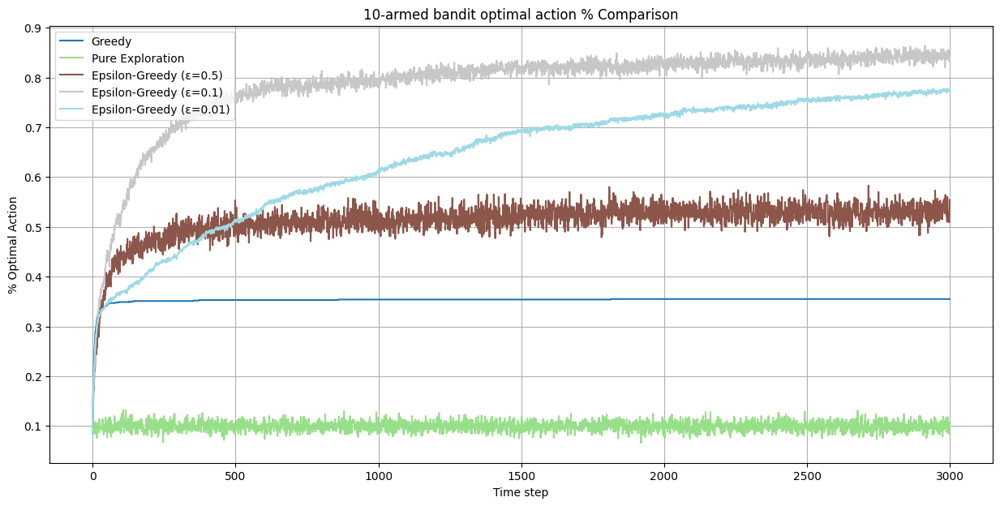

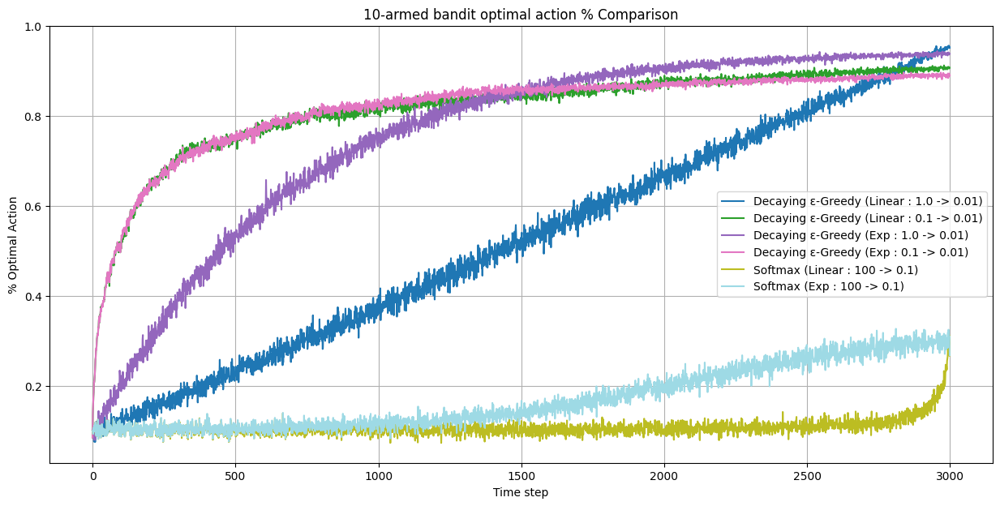

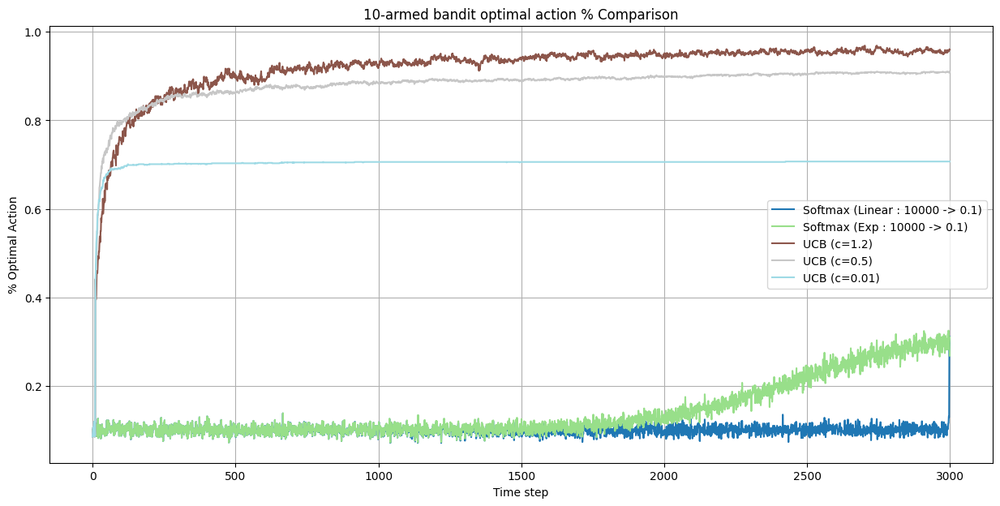

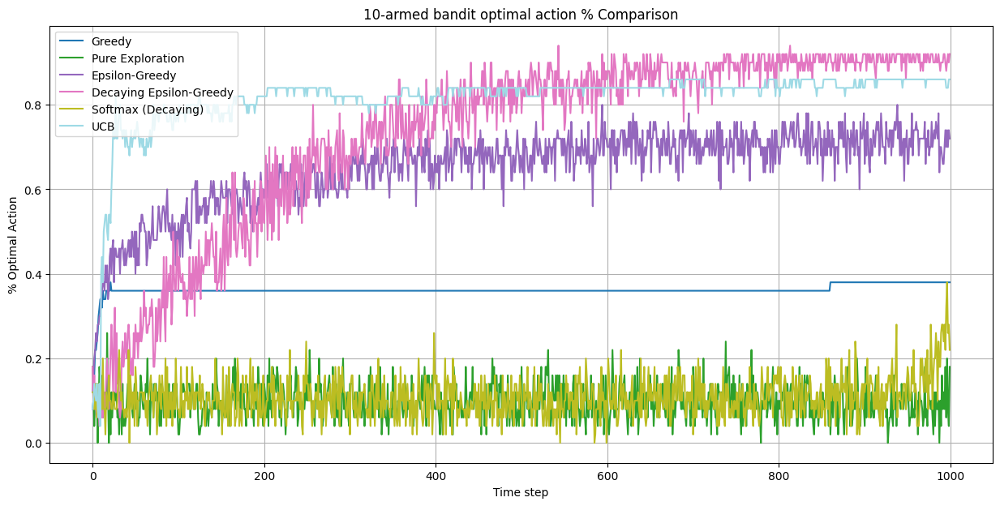

In [47]:
# TODO: Define the agents and hyperparameters you want to compare
# NOTE: set num_envs=500 to see smoother curve!

agents_to_test = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Decaying Epsilon-Greedy",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Decaying)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "UCB",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    }
]

agents_to_test1 = [
    {
        "name": "Greedy",
        "func": pure_exploitation,
        "params": {}
    },
    {
        "name": "Pure Exploration",
        "func": pure_exploration,
        "params": {}
    },
    {
        "name": "Epsilon-Greedy (ε=0.5)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.5}
    },
    {
        "name": "Epsilon-Greedy (ε=0.1)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.1}
    },
    {
        "name": "Epsilon-Greedy (ε=0.01)",
        "func": epsilon_greedy,
        "params": {"epsilon": 0.01}
    }
]

agents_to_test2 = [
    {
        "name": "Decaying ε-Greedy (Linear : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Linear : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "linear"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 1.0 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 1.0, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Decaying ε-Greedy (Exp : 0.1 -> 0.01)",
        "func": decaying_epsilon_greedy,
        "params": {"epsilon_start": 0.1, "epsilon_end": 0.01, "decay_type": "exponential"}
    },
    {
        "name": "Softmax (Linear : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 100 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 100, "temp_end": 0.1, "decay_type": "exponential"}
    }
]

agents_to_test3 = [
    {
        "name": "Softmax (Linear : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "linear"}
    },
    {
        "name": "Softmax (Exp : 10000 -> 0.1)",
        "func": softmax,
        "params": {"temp_start": 10000, "temp_end": 0.1, "decay_type": "exponential"}
    },
    {
        "name": "UCB (c=1.2)",
        "func": ucb_strategy,
        "params": {"c": 1.2}
    },
    {
        "name": "UCB (c=0.5)",
        "func": ucb_strategy,
        "params": {"c": 0.5}
    },
    {
        "name": "UCB (c=0.01)",
        "func": ucb_strategy,
        "params": {"c": 0.01}
    }
]


# TODO: Loop through 'agents_to_test':
#   1. Call run_optimal_action_experiment_gaussian for each agent.
#   2. Store the resulting curve in a dictionary (e.g., optimal_action_results_gaussian).

# TODO: Call plot_optimal_action_comparison(optimal_action_results_gaussian).

# ----------------- running for 1000 envs and 3000 steps for smooth curves ------------

np.random.seed(42)
random.seed(42)
optimal_action_results_gaussian1 = {}
for agent_info in agents_to_test1:
    optimal_action_results_gaussian1[agent_info["name"]] = run_optimal_action_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs=1000, steps=3000)
plot_optimal_action_comparison(optimal_action_results_gaussian1)

np.random.seed(42)
random.seed(42)
optimal_action_results_gaussian2 = {}
for agent_info in agents_to_test2:
    optimal_action_results_gaussian2[agent_info["name"]] = run_optimal_action_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs=1000, steps=3000)
plot_optimal_action_comparison(optimal_action_results_gaussian2)

np.random.seed(42)
random.seed(42)
optimal_action_results_gaussian3 = {}
for agent_info in agents_to_test3:
    optimal_action_results_gaussian3[agent_info["name"]] = run_optimal_action_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs=1000, steps=3000)
plot_optimal_action_comparison(optimal_action_results_gaussian3)

# ------------------- running for 50 envs and 1000 steps ----------------------------

np.random.seed(42)
random.seed(42)
optimal_action_results_gaussian = {}
for agent_info in agents_to_test:
    optimal_action_results_gaussian[agent_info["name"]] = run_optimal_action_experiment_gaussian(agent_info["func"], agent_info["params"], num_envs=50, steps=1000)
plot_optimal_action_comparison(optimal_action_results_gaussian)

**Observations:**

[Write your observations about the question and its solution here]

1. Greedy Agent: The % optimal action remains flat at approximately 0.35 after a very brief initial climb. This suggests that while it found an arm better than random, it quickly settled on a sub-optimal one and never explored enough to find the true best arm.

2. Pure Exploration Agent: The performance fluctuates steadily around 0.1 (10%) throughout the 3,000 steps. In a 10-armed environment, random exploration results in choosing the optimal arm only 1 out of 10 times on average.

3. $\epsilon$-Greedy Strategy:

    1. $\epsilon = 0.5$: Stabilizes around 0.55 optimal action. Similar to the 2-armed case, the excessive exploration prevents it from fully exploiting the best arm.
    
    2. $\epsilon = 0.1$: Reaches approximately 0.85 optimal action, showing a strong sub-linear climb that flattens as it successfully identifies the best arm.
    
    3. $\epsilon = 0.01$: Climbs slowly but steadily, reaching about 0.78 by the 3,000th step. The very low exploration rate makes convergence significantly slower than the $\epsilon = 0.1$ case.
    
4. Decaying $\epsilon$-Greedy Strategy:

    1. Linear Decay:
    
        1. $\epsilon$-start = 1.0 $\rightarrow$ 0.01: Shows a slow, linear climb, reaching nearly 0.95 optimal action by the end of the simulation.
        
        2. $\epsilon$-start = 0.1 $\rightarrow$ 0.01: Rapidly climbs to 0.75 in the first 500 steps and sustains a slow increase toward 0.90.
        
    2. Exponential Decay:
    
        1. $\epsilon$-start = 1.0 $\rightarrow$ 0.01: Displays a much faster climb than linear decay, reaching 0.85 optimal action by step 1,500 and nearly 0.95 by step 3,000.
        
        2. $\epsilon$-start = 0.1 $\rightarrow$ 0.01: This is a top-tier performer, reaching 0.90 almost immediately and maintaining high performance throughout.
        
5. Softmax Strategy:

    1. Linear Decay:
    
        1. t-start = 100 $\rightarrow$ 0.1: Stays mostly flat around 0.1, barely outperforming pure exploration until a sharp jump at the very final steps.
        
        2. t-start = 10,000 $\rightarrow$ 0.1: Remains flat at the 0.1 level for the entire duration, as the high temperature forces uniform exploration.
        
    2. Exponential Decay:
    
        1. t-start = 100 $\rightarrow$ 0.1: Climbs slowly and noisily to approximately 0.3 by the 3,000th step.
        
        2. t-start = 10,000 $\rightarrow$ 0.1: Stays near 0.1 for the first 2,000 steps before beginning a late climb to roughly 0.3.
        
6. UCB (Upper Confidence Bound) Strategy:

    1. $c = 1.2$: Achieves the highest performance, rapidly climbing to and maintaining approximately 0.95 optimal action.
    
    2. $c = 0.5$: Performs very similarly to $c=1.2$, reaching about 0.90 optimal action quickly and showing highly stable behavior.
    
    3. $c = 0.01$: Reaches a plateau near 0.7 very quickly but fails to improve further. The low exploration bonus causes it to converge prematurely to a sub-optimal arm, similar to a greedy approach.

\
Note: Seed used here are from 2001 to 3000.

## Problem 2: Monte Carlo Estimates and TD Learning
($10+10+40+40+20+20+20+20+20+20+10+20+20+20+10=300$ points)

In lecture 7, we saw the **Random Walk Environment (RWE)**. Figure 3 is the RWE for reference, please refer to the lecture for more details. In a nutshell, there are 5 non-terminal states, and two terminal states. An action leading to state 6 gives a reward of +1 and rest all actions give a reward of 0. The environment is purely random, no matter what action you take there is 50% chance that it will be executed as intended and rest 50% times it goes in opposite direction.

![Random Walk Environment](https://i.postimg.cc/brNB9nrP/Whats-App-Image-2026-01-22-at-1-50-50-PM.jpg)


In lecture 7, we learnt about Monte Carlo method and TD learning method for estimating the value of a state:

**Monte Carlo Estimate:**
$$
V_{e+1}(s) = V_{e}(s) + \alpha(e) [G_{e} - V_{e}(s)]
$$

**TD Learning Estimate:**
$$
V_{t+1}(S_{t}) = V_{t}(S_{t}) + \alpha(t) [R_{t+1} + \gamma V_{t}(S_{t+1}) - V_{t}(S_{t})]
$$

In this problem, you are required to calculate Monte Carlo and TD estimates for the RWE. Assume $\gamma=0.99$, policy ($\pi$) is "go left".

### Prerequisites & Environment Setup
First, we define the **Random Walk Environment (RWE)** and the helper function to calculate the **True Values** of the states.

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Set seed for reproducibility
np.random.seed(40)

# --- Random Walk Environment ---
class RandomWalkEnv:
    """
    7-state Random Walk Environment.
    States: 0 (Terminal), 1, 2, 3, 4, 5, 6 (Terminal).
    Start State: 3.
    Actions: 0 (Left), 1 (Right). (Environment ignores action due to 50% randomness)
    Rewards: +1 when transitioning to state 6, 0 otherwise.
    """
    def __init__(self):
        self.observation_space = [0, 1, 2, 3, 4, 5, 6]
        self.start_state = 3
        self.current_state = self.start_state
        self.end_states = [0, 6]
        self.pi = 0       # go_left
        self.policy = {
            0 : {
                0 : [(1, 0, 0)], # <Transition_Prob, Next_State, Reward>
                1 : [(1, 0, 0)],
            },
            1 : {
                0 : [(0.5, 0, 0), (0.5, 2, 0)],
                1 : [(0.5, 2, 0), (0.5, 0, 0)],
            },
            2 : {
                0 : [(0.5, 1, 0), (0.5, 3, 0)],
                1 : [(0.5, 3, 0), (0.5, 1, 0)],
            },
            3 : {
                0 : [(0.5, 2, 0), (0.5, 4, 0)],
                1 : [(0.5, 4, 0), (0.5, 2, 0)],
            },
            4 : {
                0 : [(0.5, 3, 0), (0.5, 5, 0)],
                1 : [(0.5, 5, 0), (0.5, 3, 0)],
            },
            5 : {
                0 : [(0.5, 4, 0), (0.5, 6, 1)],
                1 : [(0.5, 6, 1), (0.5, 4, 0)],
            },
            6 : {
                0 : [(1, 6, 1)],
                1 : [(1, 6, 1)],
            }
        }


    def reset(self):
        self.current_state = self.start_state
        return self.current_state

    def step(self, action):
        """
        Executes one time step within the environment.

        Args:
            action (int): The selected action (0 for Left, 1 for Right).
                          Note: The environment is random (50/50), so the specific action is often ignored in logic.

        Returns:
            next_state (int): The state after the transition.
            reward (float): The reward received (1 if reaching state 6, 0 otherwise).
            done (bool): True if the episode has ended (reached state 0 or 6), False otherwise.
            info (dict): Additional information (empty dictionary).
        """
        # Write your code here
        poss_next_state = self.policy[self.current_state][action]
        # because of 50% randomness choosing next states randmoly
        next_state_prob, next_state, reward = poss_next_state[np.random.choice(len(poss_next_state))]
        self.current_state = next_state

        done = True if self.current_state in self.end_states else False
        return next_state, reward, done, {}

# --- True Value Calculation (Helper) ---
def get_true_values(gamma=0.99):
    """
    Solves the Bellman system of equations for the random walk.
    V(s) = 0.5*[R_left + gamma*V(s-1)] + 0.5*[R_right + gamma*V(s+1)]
    """
    # States 1, 2, 3, 4, 5 are variables.
    A = np.zeros((5,5))
    b = np.zeros((5,))
    v = np.zeros((7,))
    # Map back to full states 0..6 (Terminal states are 0)
    for i in range(5):
        A[i][i] = 1.0
        if i > 0:
            A[i][i-1] = -0.5 * gamma
        if i < 4:
            A[i][i+1] = -0.5 * gamma

    b[4] = 0.5
    v[1:6] = np.linalg.solve(A, b)
    return v

true_values = get_true_values()
print(f"True Values for States 0-6: {np.round(true_values, 4)}")

True Values for States 0-6: [0.     0.1501 0.3032 0.4624 0.631  0.8124 0.    ]


### 1. Generate trajectory (10 points)
Implement a function that would simulate and generate a trajectory for RWE for a given policy $\pi$ and maximum number of steps. The function definition would be like this:

In [49]:
def generateTrajectory(env, pi, maxSteps):
    """
    Simulates and generates a trajectory for the Random Walk Environment.

    Args:
        env (RandomWalkEnv): The environment instance.
        pi (int): The policy to follow (e.g., 0 for "go left").
        maxSteps (int): Maximum number of steps to run the episode.

    Returns:
        trajectory (list): A list of experience tuples, where each tuple is (state, action, reward, next_state).
                           Returns an empty list if the episode exceeds maxSteps without terminating.
    """
    # Write your code here
    trajectory = []
    state = env.reset()
    terminated = False

    for _ in range(maxSteps):
        action = pi
        next_state, reward, done, _ = env.step(action)
        trajectory.append((state, action, reward, next_state))
        state = next_state
        if done == True:
            terminated = True
            break

    if not terminated:
        return []
    return trajectory

# Test Case
env = RandomWalkEnv()
np.random.seed(50)      # for reproducibility

test_traj = generateTrajectory(env, 0, 100)
print(f"Sample Trajectory (Length {len(test_traj)}):", test_traj)

test_traj = generateTrajectory(env, 0, 10)
print(f"Sample Trajectory (Length {len(test_traj)}):", test_traj)

test_traj = generateTrajectory(env, 0, 5)
print(f"Sample Trajectory (Length {len(test_traj)}):", test_traj)

Sample Trajectory (Length 11): [(3, 0, 0, 2), (2, 0, 0, 1), (1, 0, 0, 2), (2, 0, 0, 3), (3, 0, 0, 4), (4, 0, 0, 3), (3, 0, 0, 2), (2, 0, 0, 1), (1, 0, 0, 2), (2, 0, 0, 1), (1, 0, 0, 0)]
Sample Trajectory (Length 7): [(3, 0, 0, 4), (4, 0, 0, 5), (5, 0, 0, 4), (4, 0, 0, 5), (5, 0, 0, 4), (4, 0, 0, 5), (5, 0, 1, 6)]
Sample Trajectory (Length 0): []


The function returns a list of experience tuples. Here, `maxSteps` parameter is used to terminate the episode if it exceeds `maxSteps` count. In such a case, the partial trajectory is discarded and an empty list is returned. Test the function using suitable test cases and make sure it is working.

### 2. Step-size decay (10 points)
Implement a function that would decay the step size parameter ($\alpha$). The function definition would be like this:

In [50]:
def decayAlpha(initialValue, finalValue, maxSteps, decayType):
    """
    Generates a list of alpha values (step sizes) based on the specified decay type.

    Args:
        initialValue (float): The starting value of alpha.
        finalValue (float): The final value of alpha.
        maxSteps (int): The total number of steps/episodes to decay over.
        decayType (str): The type of decay ('linear' or 'exponential').

    Returns:
        alphas (np.ndarray): An array of alpha values for each step.
    """
    # Write your code here
    alphas = np.zeros(maxSteps)
    if decayType == "linear":
        decay_rate = (initialValue - finalValue) / max(1, (maxSteps - 1))
    else:
        decay_rate = np.exp(np.log((1e-8 + finalValue) / (initialValue + 1e-8)) / (maxSteps - 1))


    for i in range(maxSteps):
        if decayType == "linear":
            alphas[i] = initialValue - (i * decay_rate)
        else:
            alphas[i] = initialValue * (decay_rate ** i)

    return alphas

Here `decayType` can be `linear` or `exponential`. `maxSteps` is the maximum number of steps the step parameter should decay for. `initialValue` and `finalValue` are initial and final values of the step size parameter. The function should return a list of step size parameter values. Test the function by trying out different parameter settings. Plot value of $\alpha$ vs time step both for linear and exponential decays.

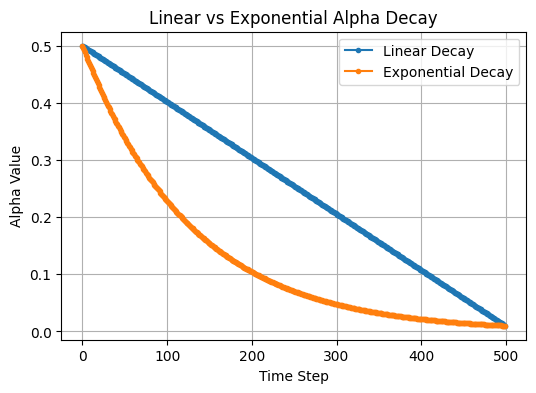

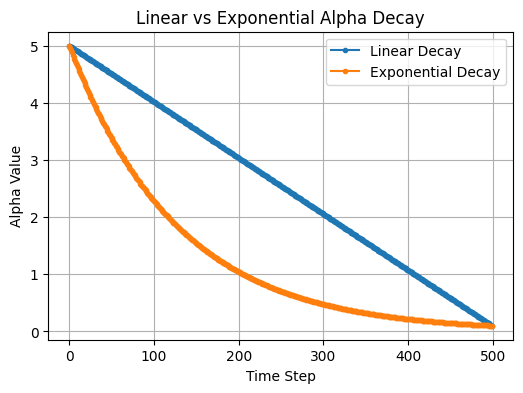

In [51]:
"""
Plot value of  α  vs time step both for linear and exponential decays.
"""
def plot_linear_vs_exponential_decay(linear_alphas, exponential_alphas):
    plt.figure(figsize=(6, 4))
    plt.plot(linear_alphas, label='Linear Decay', marker='.')
    plt.plot(exponential_alphas, label='Exponential Decay', marker='.')
    plt.xlabel('Time Step')
    plt.ylabel('Alpha Value')
    plt.title('Linear vs Exponential Alpha Decay')
    plt.legend()
    plt.grid(True)

linear_alphas1 = decayAlpha(0.5, 0.01, 500, 'linear')
exponential_alphas1 = decayAlpha(0.5, 0.01, 500, 'exponential')
plot_linear_vs_exponential_decay(linear_alphas1, exponential_alphas1)

linear_alphas2 = decayAlpha(5, 0.1, 500, 'linear')
exponential_alphas2 = decayAlpha(5, 0.1, 500, 'exponential')
plot_linear_vs_exponential_decay(linear_alphas2, exponential_alphas2)

### 3. Monte Carlo Prediction (40 points)
As explained in the lecture, implement `MonteCarloPrediction` algorithm. Use the same function definition as described in the slides. Make use of the functions implemented in above two parts. Note `MonteCarloPrediction` should work for both **FVMC** (First Visit MC) and **EVMC** (Every Visit MC) settings. Test the algorithm for RWE using some pre-defined test cases and see the algorithm produces the desired results. Report your test cases and observations.

In [52]:
def monte_carlo_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01,
                           decay_period=250, mc_type='FVMC', gamma=0.99):
    """
    Implements the Monte Carlo Prediction algorithm (works for both FVMC and EVMC).

    Args:
        env (RandomWalkEnv): The environment instance.
        num_episodes (int): Total number of episodes to simulate.
        alpha_start (float): Initial step size (learning rate).
        alpha_end (float): Final step size.
        decay_period (int): Number of episodes over which alpha decays.
        mc_type (str): Type of MC update - 'FVMC' (First Visit) or 'EVMC' (Every Visit).
        gamma (float): Discount factor.

    Returns:
        V_history (np.ndarray): History of value estimates for each state over all episodes.
                                Shape: [num_episodes, n_states]
    """
    # Write your code here
    V_history = np.zeros(shape=(num_episodes, len(env.observation_space)))
    v = np.zeros(len(env.observation_space))
    alphas = decayAlpha(alpha_start, alpha_end, decay_period, 'exponential')

    for e in range(num_episodes):
        alpha = alphas[e] if e < decay_period else alphas[decay_period-1]
        trajectory = generateTrajectory(env, 0, decay_period)

        visited = np.zeros(len(env.observation_space))

        G = 0
        for i, (s, a, r, ns) in enumerate(trajectory):
            if visited[s] and mc_type == 'FVMC':
                continue
            else:
                visited[s] = 1


            G = sum(gamma**(j-i) * trajectory[j][2] for j in range(i, len(trajectory)))
            v[s] = v[s] + alpha * (G - v[s])

        V_history[e] = v

    return V_history

In [53]:
# checking monte carlo prediction with the above RandomWalkEnv true values
"""
    7-state Random Walk Environment.
    States: 0 (Terminal), 1, 2, 3, 4, 5, 6 (Terminal).
    Start State: 3.
    Actions: 0 (Left), 1 (Right). (Environment ignores action due to 50% randomness)
    Rewards: +1 when transitioning to state 6, 0 otherwise.
"""

# true values for the above known env
true_values = get_true_values(gamma=0.99)
print(f"True Values: {np.round(true_values,4)}\n")

env = RandomWalkEnv()
np.random.seed(100)

num_episodes = 100
V_history = monte_carlo_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, mc_type="FVMC", gamma=0.99)
print(f"V at {num_episodes}th episode (FVMC): {np.round(V_history[num_episodes-1],4)}")

num_episodes = 100
V_history = monte_carlo_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, mc_type="EVMC", gamma=0.99)
print(f"V at {num_episodes}th episode (EVMC): {np.round(V_history[num_episodes-1],4)}")

num_episodes = 3000
V_history = monte_carlo_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, mc_type="FVMC", gamma=0.99)
print(f"V at {num_episodes}th episode (FVMC): {np.round(V_history[num_episodes-1],4)}")

num_episodes = 3000
V_history = monte_carlo_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, mc_type="EVMC", gamma=0.99)
print(f"V at {num_episodes}th episode (EVMC): {np.round(V_history[num_episodes-1],4)}")

True Values: [0.     0.1501 0.3032 0.4624 0.631  0.8124 0.    ]

V at 100th episode (FVMC): [0.     0.132  0.2954 0.513  0.6758 0.7931 0.    ]
V at 100th episode (EVMC): [0.     0.1001 0.1616 0.3211 0.4626 0.6772 0.    ]
V at 3000th episode (FVMC): [0.     0.1585 0.3234 0.4659 0.5982 0.7701 0.    ]
V at 3000th episode (EVMC): [0.     0.1604 0.3243 0.4934 0.6696 0.8387 0.    ]


1. On 100th Episode:

      At 100 episodes, EVMC is significantly farther from the true values than FVMC (e.g., State 1: 0.1001 vs 0.132).

      Reason: In a Random Walk (RWE), we might loop back and forth. In EVMC, if we visit State 1 three times in a single "bad" episode that ends in a loss, we count that loss three times. This correlates the errors and can slow down early learning compared to the unbiased FVMC.

2. On 3000th Episode:

      At 3000 episodes, EVMC has actually caught up and, in some states, looks slightly more accurate/stable than FVMC.

      Reason: Because EVMC uses more data points (every visit), given enough time (3000 episodes), the initial bias disappears, and the reduced variance allows it to settle closer to the true value than the potentially "jumpier" FVMC.
\
Note: Seed used is 100.

### 4. Temporal Difference Prediction (40 points)

As explained in the lecture, implement `TemporalDifferencePrediction` algorithm. Use the same function definition as described in the slides. Test the algorithm for RWE using some pre-defined test cases and see the algorithm produces the desired results. Report your test cases and observations.

In [54]:
def temporal_difference_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01,
                                   decay_period=250, gamma=0.99):
    """
    Implements the Temporal Difference TD(0) Prediction algorithm.

    Args:
        env (RandomWalkEnv): The environment instance.
        num_episodes (int): Total number of episodes to simulate.
        alpha_start (float): Initial step size.
        alpha_end (float): Final step size.
        decay_period (int): Number of episodes over which alpha decays.
        gamma (float): Discount factor.

    Returns:
        V_history (np.ndarray): History of value estimates for each state over all episodes.
                                Shape: [num_episodes, n_states]
    """
    # Write your code here
    V_history = np.zeros(shape=(num_episodes, len(env.observation_space)))
    v = np.zeros(len(env.observation_space))
    alpha = decayAlpha(alpha_start, alpha_end, decay_period, 'exponential')

    for e in range(num_episodes):
        state = env.reset()
        terminated = False

        while not terminated:
            action = env.pi
            next_state, reward, done, _ = env.step(action)
            td_target =  reward
            if not done:
              td_target = td_target + gamma * v[next_state]
            td_target = td_target - v[state]

            v[state] += alpha[state] * td_target
            state = next_state
            terminated = done

        V_history[e] = v

    return V_history

In [55]:
# checking TD prediction with the above RandomWalkEnv true values
"""
    7-state Random Walk Environment.
    States: 0 (Terminal), 1, 2, 3, 4, 5, 6 (Terminal).
    Start State: 3.
    Actions: 0 (Left), 1 (Right). (Environment ignores action due to 50% randomness)
    Rewards: +1 when transitioning to state 6, 0 otherwise.
    """

# true values for the above known env
true_values = get_true_values(gamma=0.99)
print(f"True Values: {np.round(true_values,4)}\n")

env = RandomWalkEnv()
np.random.seed(333)

# --------------------------------------------- alpha start = 0.5 -------------------------------------------

print(f"alpha_start = 0.5")
num_episodes = 100
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

num_episodes = 1000
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

num_episodes = 1500
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

num_episodes = 2000
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.5, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

# --------------------------------------------- alpha start = 0.05 -------------------------------------------

print(f"\nalpha_start = 0.05")
num_episodes = 100
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.05, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

num_episodes = 1000
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.05, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

num_episodes = 1500
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.05, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")

num_episodes = 2000
V_history = temporal_difference_prediction(env, num_episodes, alpha_start=0.05, alpha_end=0.01, decay_period=num_episodes, gamma=0.99)
print(f"V at {num_episodes}th episode: {np.round(V_history[num_episodes-1],4)}")



True Values: [0.     0.1501 0.3032 0.4624 0.631  0.8124 0.    ]

alpha_start = 0.5
V at 100th episode: [0.     0.0235 0.2319 0.62   0.8186 0.9777 0.    ]
V at 1000th episode: [0.     0.0254 0.0586 0.4496 0.9338 0.9874 0.    ]
V at 1500th episode: [0.     0.0103 0.1086 0.3285 0.5445 0.836  0.    ]
V at 2000th episode: [0.     0.0136 0.1365 0.2968 0.9246 0.9976 0.    ]

alpha_start = 0.05
V at 100th episode: [0.     0.0335 0.137  0.2987 0.4684 0.7243 0.    ]
V at 1000th episode: [0.     0.1715 0.337  0.5168 0.6453 0.8652 0.    ]
V at 1500th episode: [0.     0.1264 0.3012 0.4458 0.6677 0.8471 0.    ]
V at 2000th episode: [0.     0.1432 0.2632 0.383  0.5872 0.786  0.    ]


**Observation for TD Prediction:**

The results indicate that TD prediction is highly sensitive to the initial learning rate ($\alpha$). A high $\alpha$ (0.5) prevents convergence by causing the value function to oscillate in response to the stochasticity of the environment. Conversely, a lower $\alpha$ (0.05) allows the agent to effectively bootstrap from its neighbors, resulting in a value function that gradually converges toward the true analytical values of the Random Walk.

Note: Seed used is 333.

### 5. First-Visit Monte Carlo estimate (20 points)
Plot the **MC-FVMC** estimate of each non-terminal state of RWE as it progress through different episodes. In the same plot also plot the true estimate. Take maximum of 500 episodes. You can play with different settings of $\alpha$, for example, the step size parameter ($\alpha$) starts from 0.5 and decreases exponentially to 0.01 till 250 episodes and after that it is constant. Or else you can also try with small $(<1)$ value of constant $\alpha$. Analyze the plots for each state and report your observations, findings and possible reasons for the observed behavior.

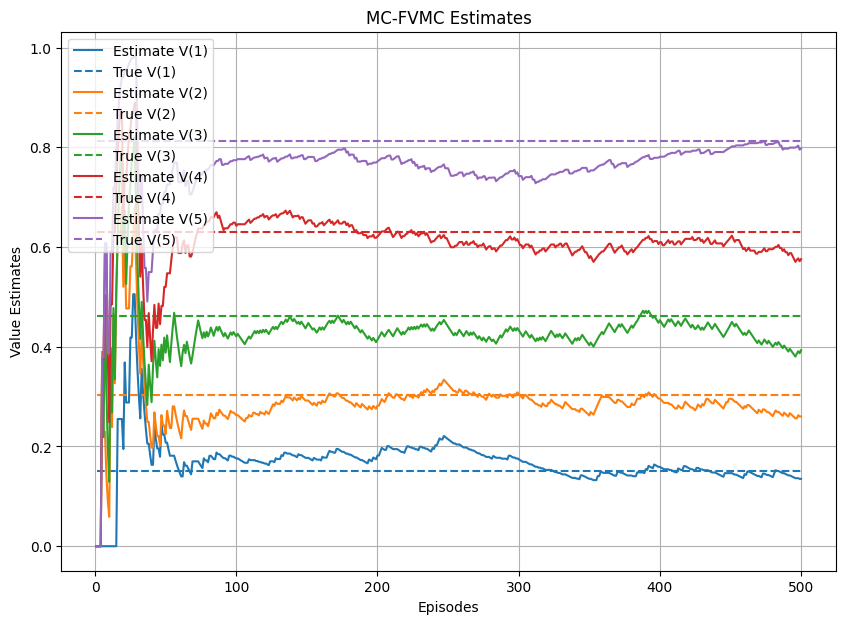

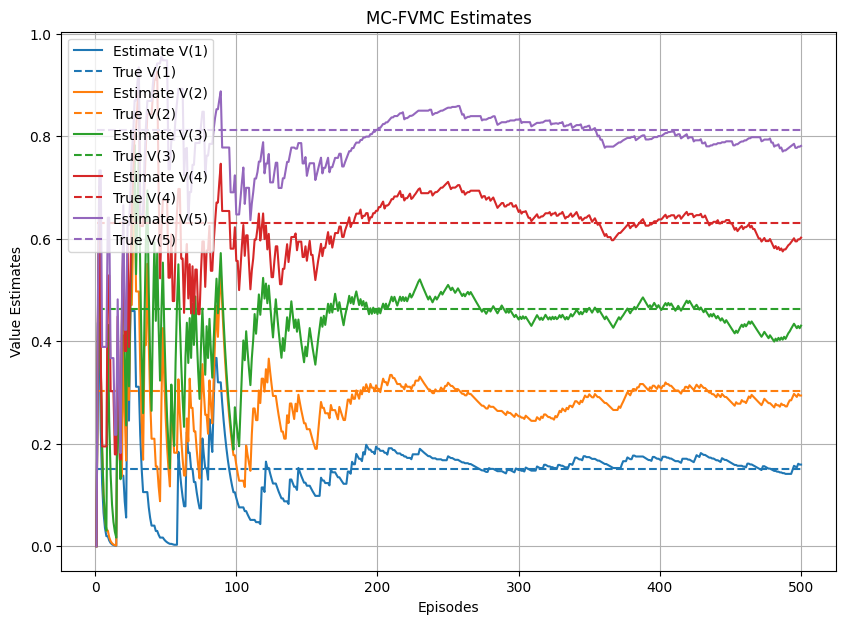

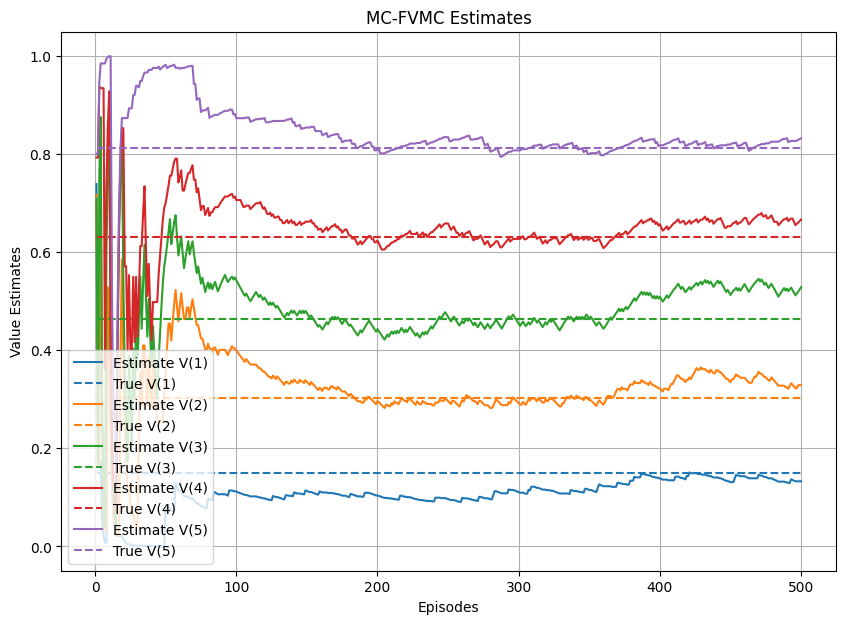

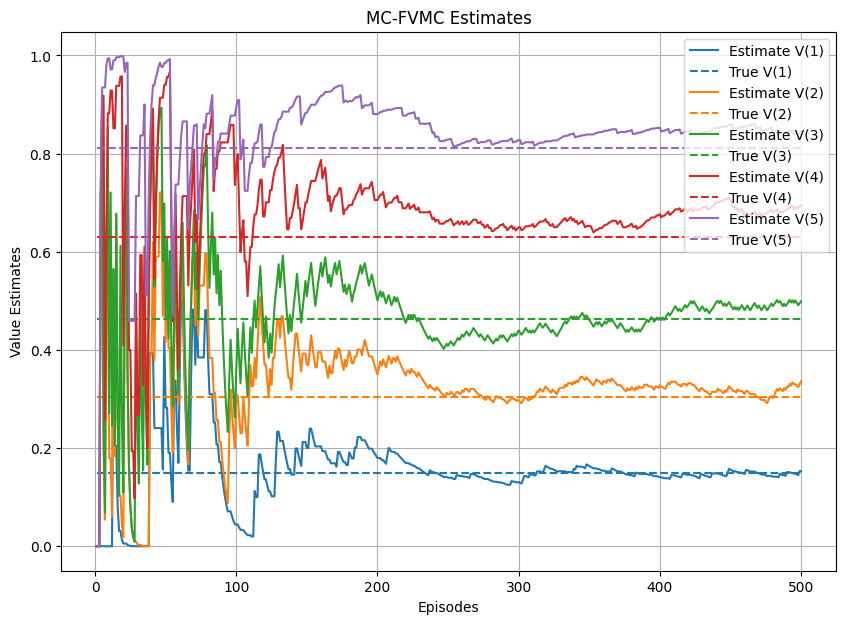

In [56]:
# I have added one more argument here ie log_scale_axis, so to reuse this below

def plot_value_estimates(V_history, true_values, title, log_scale=False, log_scale_axis='y'):
    """
    Plots the estimated value of non-terminal states (1-5) over episodes against the true values.

    Args:
        V_history (np.ndarray): The history of value estimates. Shape: [num_episodes, n_states].
        true_values (np.ndarray): The ground truth values for the states.
        title (str): Title for the plot.
        log_scale (boolean): If True, use a logarithmic scale for the y-axis.

    Returns:
        None (Displays the plot).
    """
    # Write your code here
    num_episodes = V_history.shape[0]
    episodes = np.arange(1, num_episodes + 1)  # start from 1 for log safety

    plt.figure(figsize=(10, 7))
    plt.title(title)
    plt.xlabel("Episodes")
    plt.ylabel("Value Estimates")

    for s in range(1, 6):
        line, = plt.plot(
            episodes,
            V_history[:, s],
            label=f"Estimate V({s})"
        )

        plt.hlines(
            true_values[s],
            xmin=episodes[0],
            xmax=episodes[-1],
            linestyles="dashed",
            colors=line.get_color(),
            label=f"True V({s})"
        )

    if log_scale:
        if log_scale_axis == 'y':
            plt.yscale('log')
            plt.ylabel("Log(Value Estimates)")
        elif log_scale_axis == 'x':
            plt.xscale('log')
            plt.xlabel("Log(Episodes)")

    plt.legend()
    plt.grid(True, which="both")
    plt.show()

# Example Usage for Q5 (MC-FVMC)
np.random.seed(seed = 444)
true_values = get_true_values()

history_fvmc = monte_carlo_prediction(env, 500, alpha_start=0.5, alpha_end=0.01, decay_period=100, mc_type="FVMC", gamma=0.99)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates")

history_fvmc = monte_carlo_prediction(env, 500, alpha_start=0.5, alpha_end=0.01, decay_period=250, mc_type="FVMC", gamma=0.99)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates")

history_fvmc = monte_carlo_prediction(env, 500, alpha_start=0.8, alpha_end=0.01, decay_period=100, mc_type="FVMC", gamma=0.99)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates")

history_fvmc = monte_carlo_prediction(env, 500, alpha_start=0.8, alpha_end=0.01, decay_period=250, mc_type="FVMC", gamma=0.99)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates")

**Observations (MC-FVMC):**

[Write your observations about the question and its solution here]

**1. Initial Volatility and Learning Dynamics:**

  * All plots exhibit high initial variance, with value estimates fluctuating sharply during the first 100 episodes before stabilizing. As the episode count increases, the "Estimated V" curves align more closely with the dashed "True Value" lines, demonstrating the convergence property of Monte Carlo methods.
  
**2. Impact of Learning Rate ($\alpha_{start}$):**

  1. Lower initial learning rates ($\alpha = 0.5$) result in smoother curves and fewer extreme jumps, as the agent places less weight on any single early trajectory.
  
  2. Higher initial values ($\alpha = 0.8$) cause dramatic spikes (often hitting 0.0 or 1.0), indicating that the agent is aggressively overwriting its history with recent experience.
  
**3. Influence of Decay PeriodFast:**

  1. Stabilization (100 Episodes): A shorter decay period "locks in" the estimates faster by reducing the learning rate quickly, which minimizes late-stage noise but risks stopping before reaching full accuracy.
  
  2. Sustained Flexibility (250 Episodes): A longer decay maintains higher "plasticity" for more episodes; while this results in a noisier curve, it allows the agent more time to correct early sampling errors.
  
**4. State-Wise Convergence:**

  1. Boundary States ($V(1), V(5)$) converge more accurately and quickly due to their proximity to terminal rewards, which results in lower return variance.
  2. Central States ($V(3)$) shows the most persistent fluctuation, as the high variance of possible paths to either end requires a larger sample size to average effectively.

Node: Seed used is 444.

### 6. Every Visit Monte Carlo estimate (20 points)
Plot the **MC-EVMC** estimate of each non-terminal state of RWE as it progress through different episodes. In the same plot also plot the true estimate. Take maximum of 500 episodes. You can play with different settings of $\alpha$, for example, the step size parameter ($\alpha$) starts from 0.5 and decreases exponentially to 0.01 till 250 episodes and after that it is constant. Or else you can also try with small $(<1)$ value of constant $\alpha$. Analyze the plots for each state and report your observations, findings and possible reasons for the observed behavior. How does EVMC fair against FVMC?

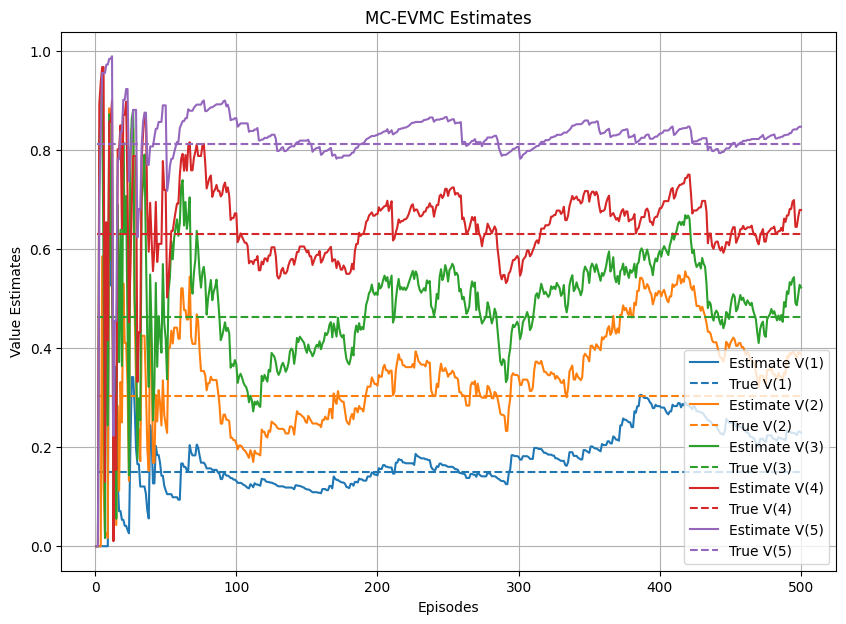

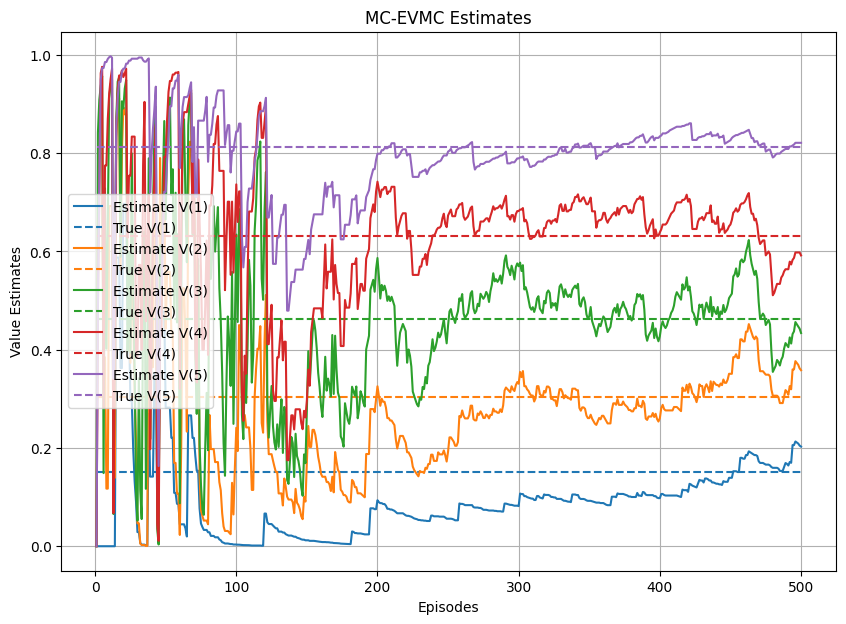

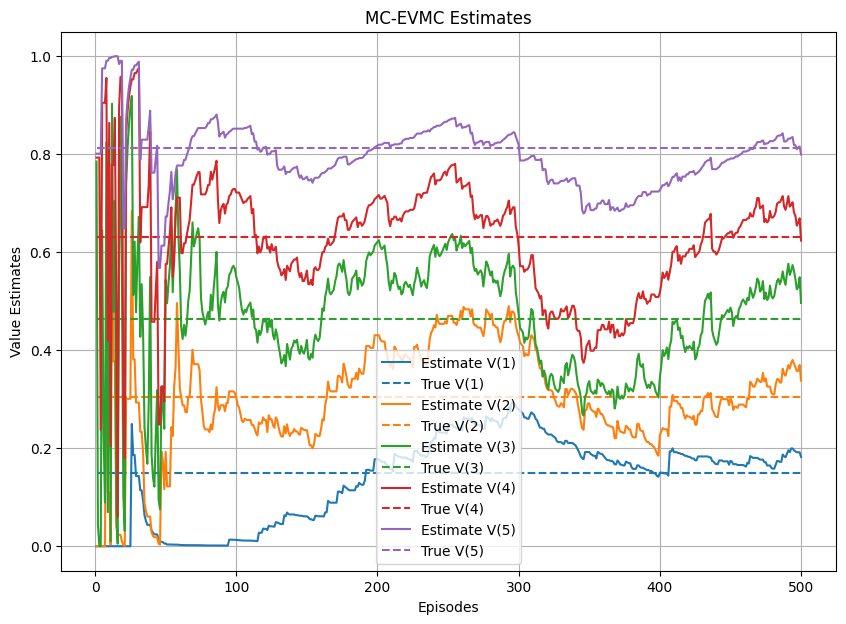

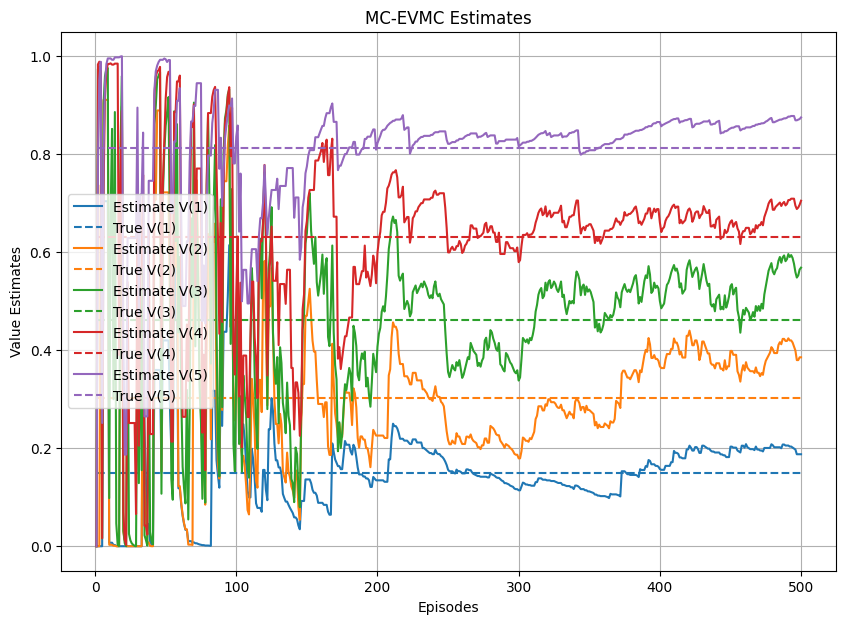

In [57]:
# TODO: Implement Every-Visit Monte Carlo prediction
# Hint: Use mc_type = 'EVMC'

num_episodes = 500

# Example Usage for Q6 (MC-EVMC)
# TODO: Call Monte Carlo prediction function
# Store value estimates across episodes
np.random.seed(seed = 555)
true_values = get_true_values()

history_evmc1 = monte_carlo_prediction(env, 500, alpha_start=0.5, alpha_end=0.01, decay_period=100, mc_type="EVMC", gamma=0.99)

history_evmc2 = monte_carlo_prediction(env, 500, alpha_start=0.5, alpha_end=0.01, decay_period=250, mc_type="EVMC", gamma=0.99)

history_evmc3 = monte_carlo_prediction(env, 500, alpha_start=0.8, alpha_end=0.01, decay_period=100, mc_type="EVMC", gamma=0.99)

history_evmc4 = monte_carlo_prediction(env, 500, alpha_start=0.8, alpha_end=0.01, decay_period=250, mc_type="EVMC", gamma=0.99)

# TODO: Plot the values
plot_value_estimates(history_evmc1, true_values, "MC-EVMC Estimates")
plot_value_estimates(history_evmc2, true_values, "MC-EVMC Estimates")
plot_value_estimates(history_evmc3, true_values, "MC-EVMC Estimates")
plot_value_estimates(history_evmc4, true_values, "MC-EVMC Estimates")



**Observations (MC-EVMC):**

[Write your observations about the question and its solution here]

**1. Extreme Early Stochasticity:**
    
  * Across all plots, the first 100 episodes show violent oscillations, with values frequently bouncing between 0.0 and 1.0. This is typical of Every-Visit MC, where multiple updates from the same trajectory can drastically shift estimates early on when the sample size is small.
  
**2. Impact of Alpha Start:**

  * $\alpha_{start} = 0.5$ (Top Two EVMC Plots):
    
      The estimates begin to stabilize and converge toward the dashed "True Value" lines more consistently after episode 200. The curves are relatively smoother compared to higher alpha settings.
      
  * $\alpha_{start} = 0.8$ (Bottom Two EVMC Plots):

      These plots exhibit much "noisier" behavior for a longer duration. The high initial step size causes the agent to over-prioritize recent, potentially rare sequences, leading to large spikes even after 150 episodes.
  

**3. Impact of Decay Period:**

  * Short Decay (100 episodes):
    
      The estimates "lock in" their values much sooner. While this reduces late-stage noise, it can lead to premature convergence, where the final estimate remains permanently offset from the true value because the learning rate dropped before the error was corrected.
      
  * Long Decay (250 episodes):
  
      The curves remain jagged for longer, but they generally track the true values with better accuracy in the long run. The extended decay allows the agent more time to "iron out" the high variance inherent in Every-Visit samples.
  
**4. Convergent Trends by State:**
  
  * Similar to the First-Visit approach, boundary States ($V(1), V(5)$) converge with the highest precision because their proximity to terminal states results in more consistent returns.
  
  * Central State ($V(3)$) shows the highest degree of "wandering" or instability. In EVMC, $V(3)$ is often visited multiple times in a single episode, and if that episode is an outlier, it shifts the estimate significantly, requiring many more episodes to balance out.

\
Note: Seed used is 555.  

### 7. TD esitmate (20 points)
Plot the **TD** estimate of each non-terminal state of RWE as it progress through different episodes. In the same plot also plot the true estimate. Take maximum of 500 episodes. You can play with different settings of $\alpha$, for example, the step size parameter ($\alpha$) starts from 0.5 and decreases exponentially to 0.01 till 250 episodes and after that it is constant. Or else you can also try with small $(<1)$ value of constant $\alpha$. Analyze the plots for each state and report your observations, findings and possible reasons for the observed behavior.

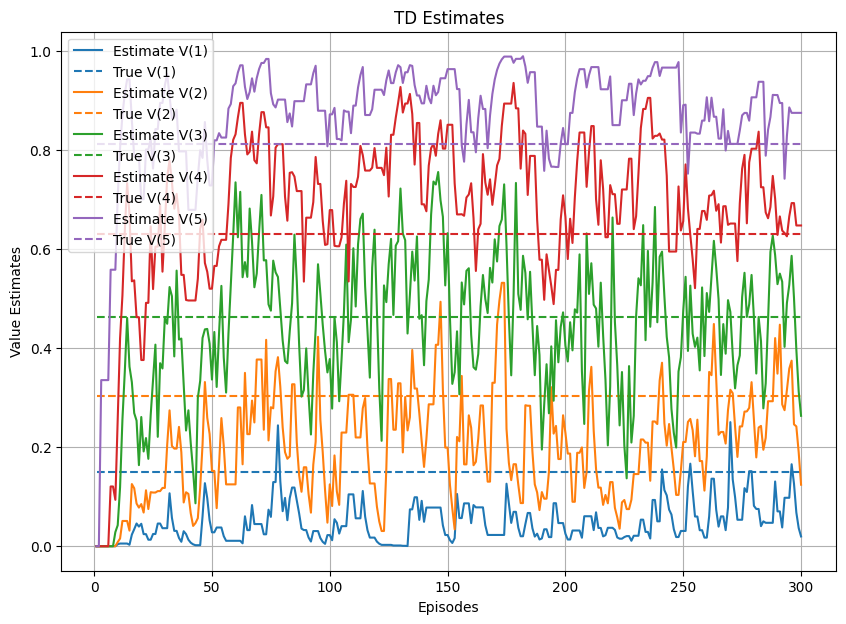

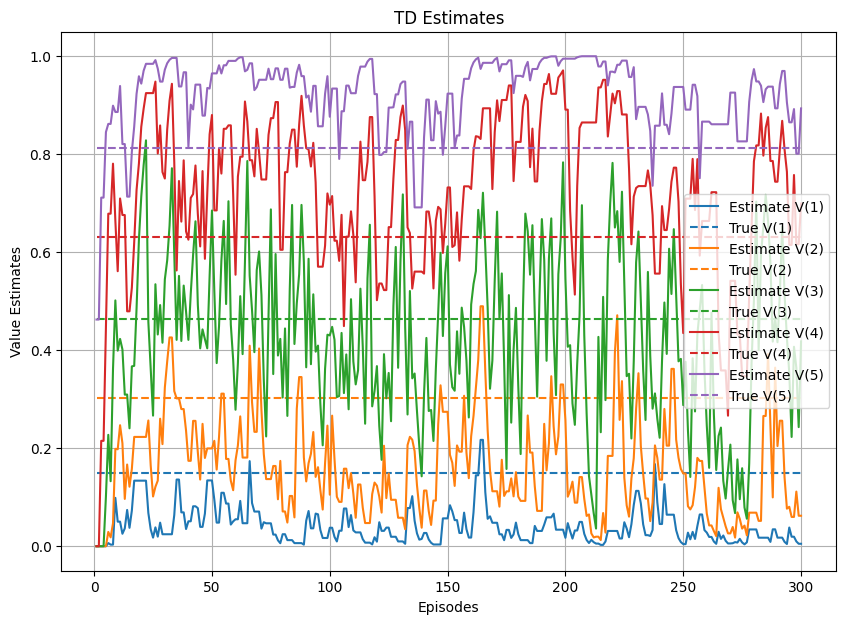

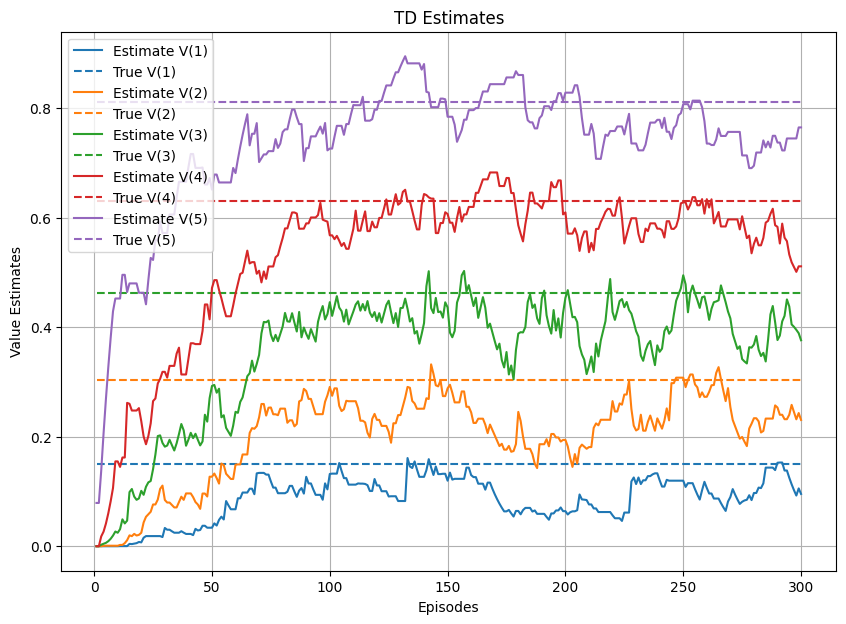

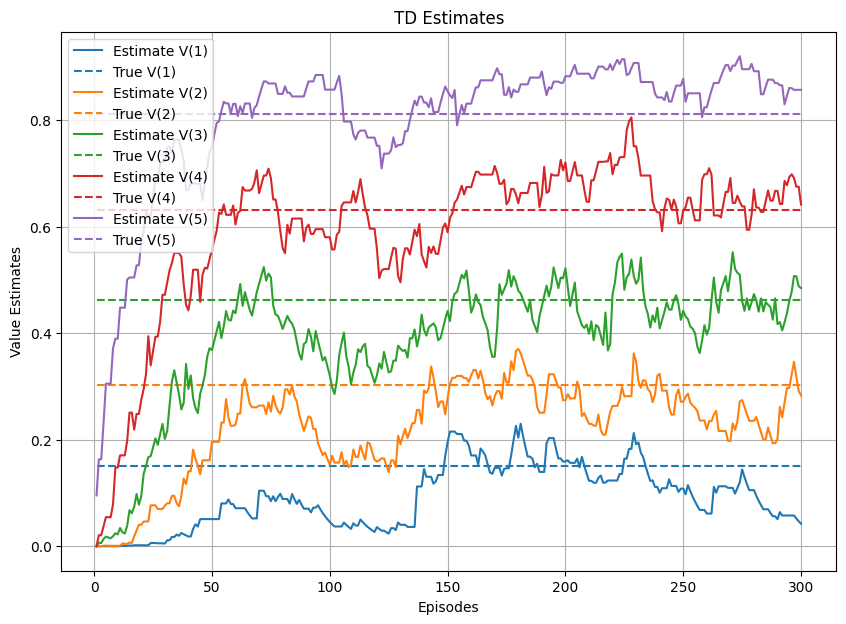

In [58]:
# TODO: Implement Temporal Difference (TD(0)) prediction

num_episodes = 500

# Example Usage for Q7 (TD)
# TODO: Call TD prediction function
# Store value estimates across episodes
np.random.seed(seed = 666)
true_values = get_true_values()

history_td1 = temporal_difference_prediction(env, 300, alpha_start=0.5, alpha_end=0.01, decay_period=50, gamma=0.99)

history_td2 = temporal_difference_prediction(env, 300, alpha_start=0.5, alpha_end=0.01, decay_period=250, gamma=0.99)

history_td3 = temporal_difference_prediction(env, 300, alpha_start=0.1, alpha_end=0.01, decay_period=50, gamma=0.99)

history_td4 = temporal_difference_prediction(env, 300, alpha_start=0.1, alpha_end=0.01, decay_period=250, gamma=0.99)

# TODO: Plot the values
plot_value_estimates(history_td1, true_values, "TD Estimates")
plot_value_estimates(history_td2, true_values, "TD Estimates")
plot_value_estimates(history_td3, true_values, "TD Estimates")
plot_value_estimates(history_td4, true_values, "TD Estimates")


**Observations (TD):**

[Write your observations about the question and its solution here]

**1. Learning Rate ($\alpha_{start}$) and Stability:**
  
  * High $\alpha$ (0.5) results in extreme oscillation. The agent over-corrects based on single random walks, causing value estimates to "chase noise" and swing wildly around true values.
  
  * Low $\alpha$ (0.1) produces smooth convergence. Small, incremental updates allow the agent to effectively average the environment's stochasticity, resulting in stable, accurate estimates.
  
**2. Decay Period and Plasticity:**

  * Short Decay (50 episodes) rapidly "freezes" the learning process. While it reduces late-stage noise, it risks locking in inaccurate values if the agent hasn't reached the truth before $\alpha$ drops.
  
  * Long Decay (250 episodes) maintains plasticity longer. This allows the agent to continue refining estimates and correcting early errors, though the curves remain slightly "jittery" for a longer duration.
  
**3. Sequential Reward Propagation:**

  * A clear "delay" is visible in the plots. States near the reward ($V_5$) learn and stabilize first.
  
  * Because TD bootstraps from the immediate neighbor, the reward signal must "wash back" one state at a time, making distant states ($V_1, V_2$) the last to converge.

**4. Final Comparison (Optimal Setting):**

  * The combination of a low initial $\alpha$ (0.1) and a longer decay (250) provides the most reliable results, balancing the need for stable averages with enough time for reward information to fully propagate.

\
Note: Seed used here is 666.

### 8. Smoothing variation (20 points)
As you might notice, the above plots may have lot of variance and look very noisy. One way to overcome this is to create several different instances of the environment using different seeds and then average out the results across these and plot these (this is similar to the Bandit setting). Plot MC-FVMC, MC-EVMC and TD with this averaged out version. This will give you smoother plots. The plot will be similar to shown in lecture 7. Record your seeds and report these along with the plots.

Averaging complete over 50 runs.
Sample Seeds (TD): [777, 778, 779, 780, 781]


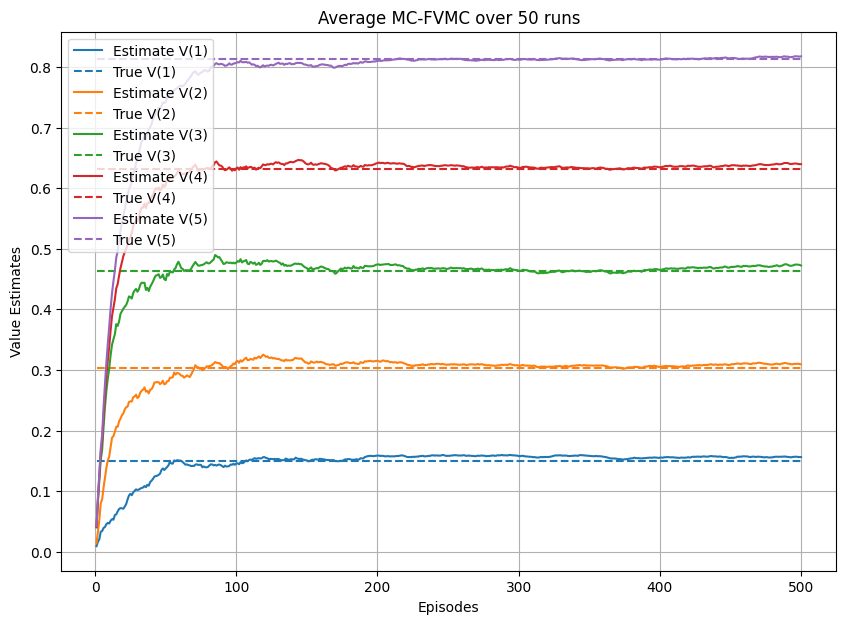

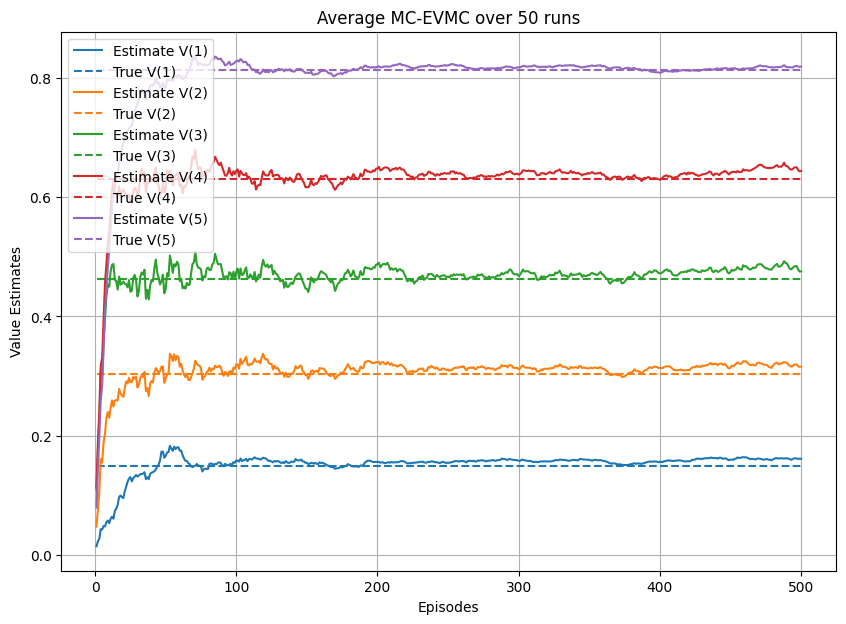

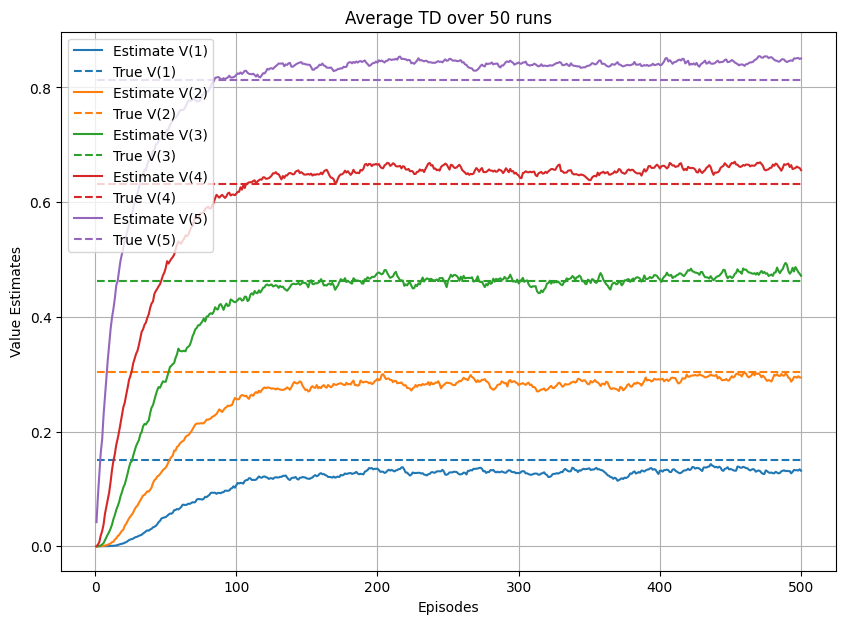

avg fvmc: [0.         0.14759347 0.29958757 0.45916408 0.61863688 0.78202263
 0.        ]
avg evmc: [0.         0.15264693 0.30882094 0.46789751 0.63082527 0.79912343
 0.        ]
avg td: [0.         0.11241192 0.25448297 0.42348895 0.60802178 0.8034007
 0.        ]
Averaging complete over 500 runs.
Sample Seeds (TD): [777, 778, 779, 780, 781]


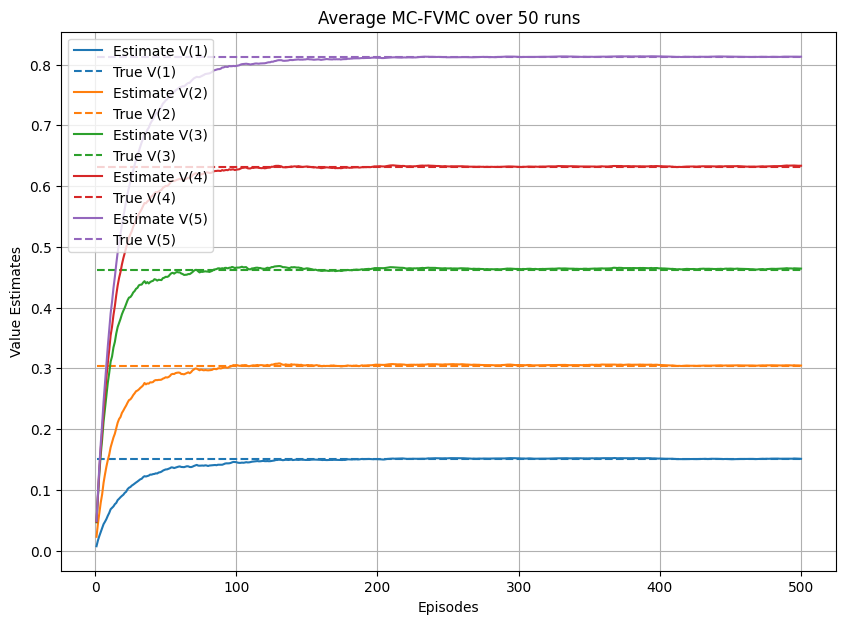

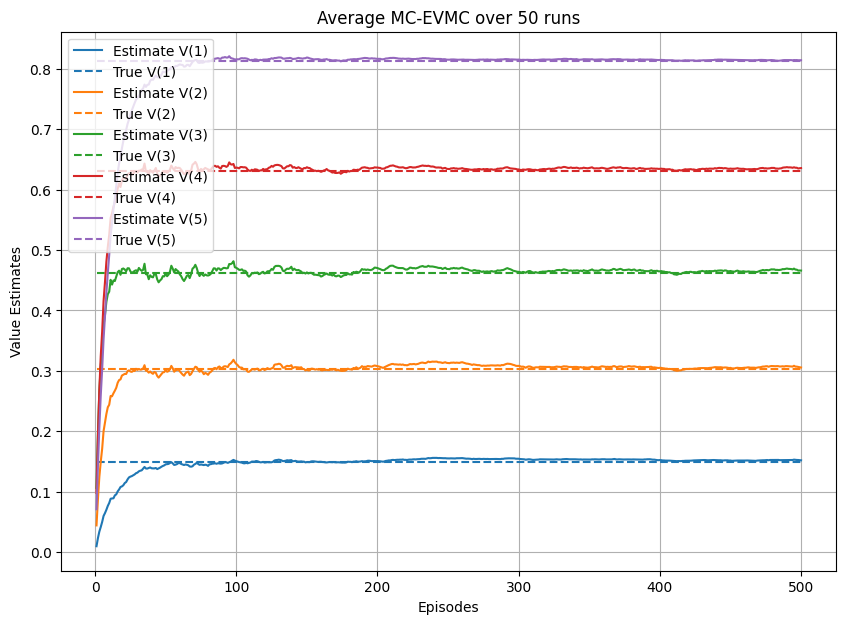

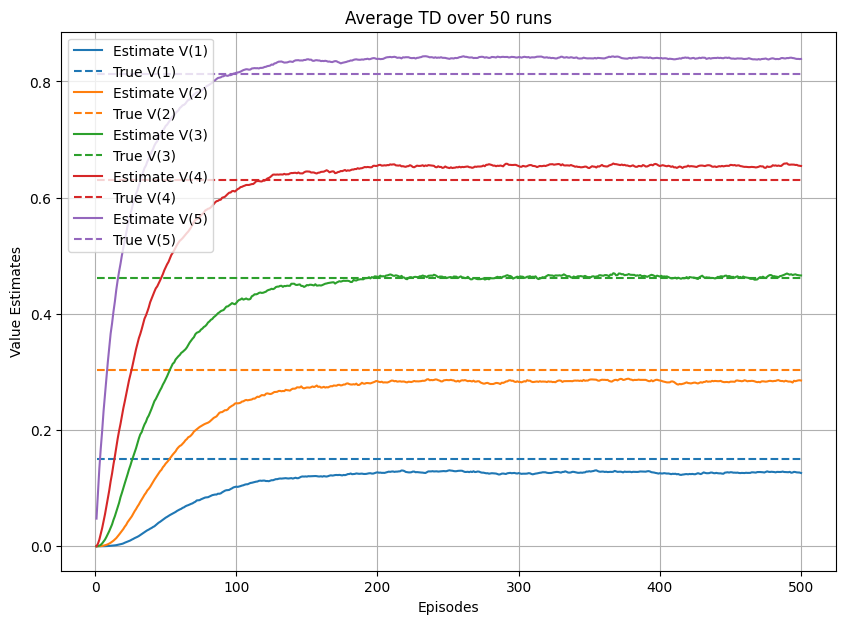

avg fvmc: [0.         0.14411597 0.29608826 0.45433629 0.61382206 0.78128508
 0.        ]
avg evmc: [0.         0.14762653 0.30251665 0.46252081 0.62816439 0.79742459
 0.        ]
avg td: [0.         0.10932568 0.25033838 0.41874425 0.60453107 0.80059735
 0.        ]


In [59]:
# TODO: Average value estimates over multiple runs
# Methods: MC-FVMC, MC-EVMC, TD

num_runs = 50
num_episodes = 500


def run_averaged_experiment(agent_func, env, num_runs=50, num_episodes=500, **kwargs):
    """
    Runs an RL agent/algorithm multiple times on a given environment to compute
    averaged value estimates. Each run uses a different random seed for reproducibility.

    Args:
        agent_func (callable): The agent function to execute (e.g., monte_carlo_prediction,
                               temporal_difference_prediction).
                               Expected signature: func(env, num_episodes, **kwargs) -> V
        env (gym.Env): The environment instance to run the experiment on.
        num_runs (int, optional): Number of independent runs to perform. Defaults to 50.
        num_episodes (int, optional): Number of episodes per run. Defaults to 500.
        **kwargs: Arbitrary keyword arguments passed directly to the agent_func
                  (e.g., mc_type='FVMC', alpha=0.1, gamma=0.99).

    Returns:
        avg_estimates (np.ndarray): The estimated value function averaged over `num_runs`.
                                    Shape should correspond to the number of non-terminal states.
        seeds (list of int): A list of the random seeds used for each run.
    """
    # Write your code here
    avg_estimates = np.zeros(shape=(num_episodes, len(env.observation_space)))
    seeds = []

    for seed in range(num_runs):
        np.random.seed(777+seed)
        V_history = agent_func(env, num_episodes, **kwargs)
        avg_estimates += V_history
        seeds.append(777+seed)

    avg_estimates /= num_runs
    return avg_estimates, seeds


# Run Averaged Experiments
env = RandomWalkEnv()
# --------------------------------------------------------------------------------------------------------------
avg_fvmc, seeds_fvmc = run_averaged_experiment(monte_carlo_prediction, env, num_runs = 50, mc_type='FVMC', alpha_start=0.1, alpha_end=0.01,
                                   decay_period=250, gamma=0.99)
avg_evmc, seeds_evmc = run_averaged_experiment(monte_carlo_prediction, env, num_runs = 50,  mc_type='EVMC', alpha_start=0.1, alpha_end=0.01,
                                   decay_period=250, gamma=0.99)
avg_td, seeds_td = run_averaged_experiment(temporal_difference_prediction, env, num_runs = 50, alpha_start=0.1, alpha_end=0.01,
                                   decay_period=250, gamma=0.99)

print("Averaging complete over 50 runs.")
print("Sample Seeds (TD):", seeds_td[:5])

true_values = get_true_values(gamma=0.99)

# Plot all three averaged
plot_value_estimates(avg_fvmc, true_values, 'Average MC-FVMC over 50 runs')
plot_value_estimates(avg_evmc, true_values, 'Average MC-EVMC over 50 runs')
plot_value_estimates(avg_td  , true_values, 'Average TD over 50 runs')

# TODO: Compute averaged estimates for all methods
avg_fvmc_values_over_episodes = avg_fvmc.mean(axis = 0)
avg_evmc_values_over_episodes = avg_evmc.mean(axis = 0)
avg_td_values_over_episodes = avg_td.mean(axis = 0)

print(f'avg fvmc: {avg_fvmc_values_over_episodes}')
print(f'avg evmc: {avg_evmc_values_over_episodes}')
print(f'avg td: {avg_td_values_over_episodes}')

# -----------------------------------------------------------------------------------------------------------------

avg_fvmc, seeds_fvmc = run_averaged_experiment(monte_carlo_prediction, env, num_runs = 500, mc_type='FVMC', alpha_start=0.1, alpha_end=0.01,
                                   decay_period=250, gamma=0.99)
avg_evmc, seeds_evmc = run_averaged_experiment(monte_carlo_prediction, env, num_runs = 500,  mc_type='EVMC', alpha_start=0.1, alpha_end=0.01,
                                   decay_period=250, gamma=0.99)
avg_td, seeds_td = run_averaged_experiment(temporal_difference_prediction, env, num_runs = 500, alpha_start=0.1, alpha_end=0.01,
                                   decay_period=250, gamma=0.99)

print("Averaging complete over 500 runs.")
print("Sample Seeds (TD):", seeds_td[:5])

true_values = get_true_values(gamma=0.99)

# Plot all three averaged
plot_value_estimates(avg_fvmc, true_values, 'Average MC-FVMC over 50 runs')
plot_value_estimates(avg_evmc, true_values, 'Average MC-EVMC over 50 runs')
plot_value_estimates(avg_td  , true_values, 'Average TD over 50 runs')

# TODO: Compute averaged estimates for all methods
avg_fvmc_values_over_episodes = avg_fvmc.mean(axis = 0)
avg_evmc_values_over_episodes = avg_evmc.mean(axis = 0)
avg_td_values_over_episodes = avg_td.mean(axis = 0)

print(f'avg fvmc: {avg_fvmc_values_over_episodes}')
print(f'avg evmc: {avg_evmc_values_over_episodes}')
print(f'avg td: {avg_td_values_over_episodes}')

**Observations:**

[Write your observations about the question and its solution here]

**1. Variance Reduction through Averaging:**

  * Unlike the single-run plots which were jagged and erratic, the averaged plots show smooth, logarithmic growth. This confirms that the underlying learning process is stable, even if individual episodes are random.
  
  * The transition from 50 runs to 500 runs further tightens the curves around the true values, reducing the small "wiggles" seen in the early stages of learning. (Law of Large Numbers)
  
**2. Convergence Speed:**

  * FVMC & EVMC curves tend to rise more quickly in the very first few episodes. Since Monte Carlo updates based on the actual final reward, it doesn't have to wait for information to "propagate" through the chain.
  
  * TD curves (especially for states far from the goal, like $V_1$) show a more pronounced "slow start" or lag. Because it must bootstrap from its neighbors, it takes more episodes for the reward signal from State 6 to reach the beginning of the chain.

**3. Asymptotic Accuracy:**
  
  * In the plots, FVMC and EVMC eventually settle almost perfectly on the dashed "True Value" lines. Since MC is unbiased, it will always converge to the true average return given enough episodes.
  
  * From the plots, it has been noticed that TD converges more smoothly but might still have a tiny persistent gap compared to the true values if the alpha decay is too fast. However, it is generally much lower variance than EVMC at any given episode.

**4. Bias-Variance Tradeoff:**

  * Average TD plot is visibly the smoothest of the three. This illustrates TD’s primary advantage: it has lower variance than MC because it updates based on expected values (neighbor estimates) rather than single, high-variance terminal rewards.
  
  * FVMC typically appears slightly more stable than EVMC. EVMC updates multiple times per episode, which can introduce "correlative noise" that requires more runs to smooth out completely.

\
Note: Seed used here are from 777 to 1776.

### 9. FVMC estimate in log-scale (20 points)
Plot the **MC-FVMC** estimate of each non-terminal state of RWE as it progress through different episodes. But this time, the **x-axis (episodes) should be log-scale**. In the same plot also plot the true estimate. The plot will be similar to shown in lecture 7. Take maximum of 500 episodes. You can play with different settings of $\alpha$, for example, the step size parameter ($\alpha$) starts from 0.5 and decreases exponentially to 0.01 till 250 episodes and after that it is constant. Or else you can also try with small $(<1)$ value of constant $\alpha$. This plot will help to zoom in and observe the behavior of the estimates in the initial stages. Analyze the plots for each state and report your observations, findings and possible reasons for the observed behavior.

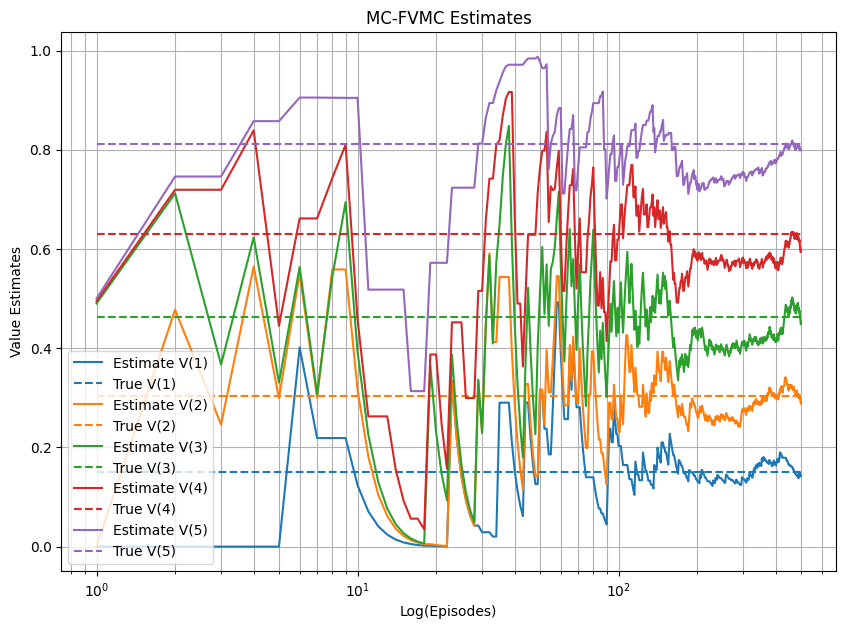

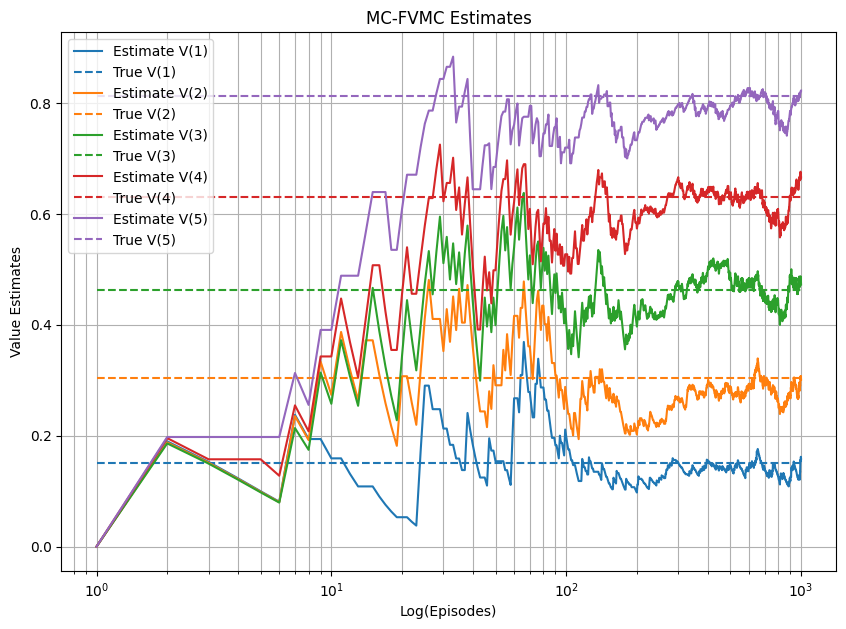

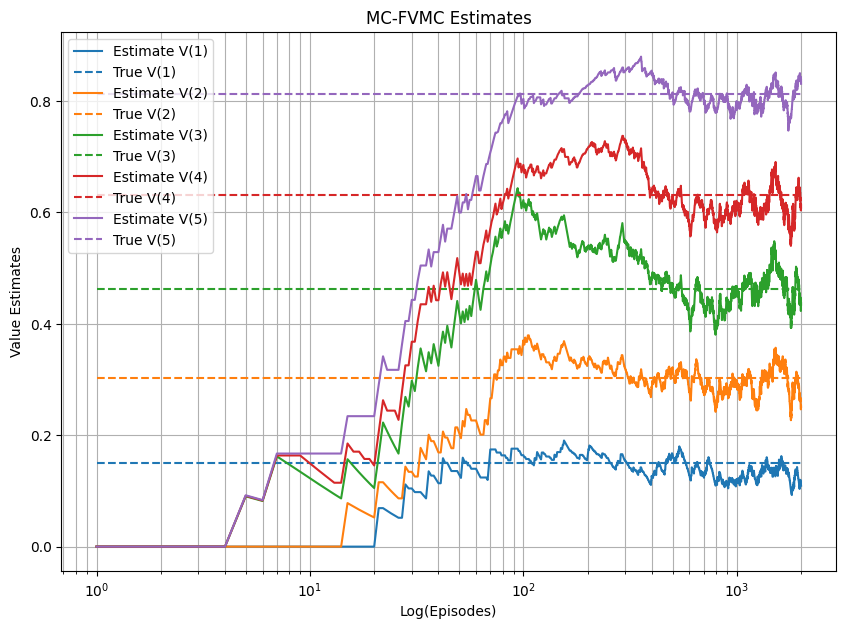

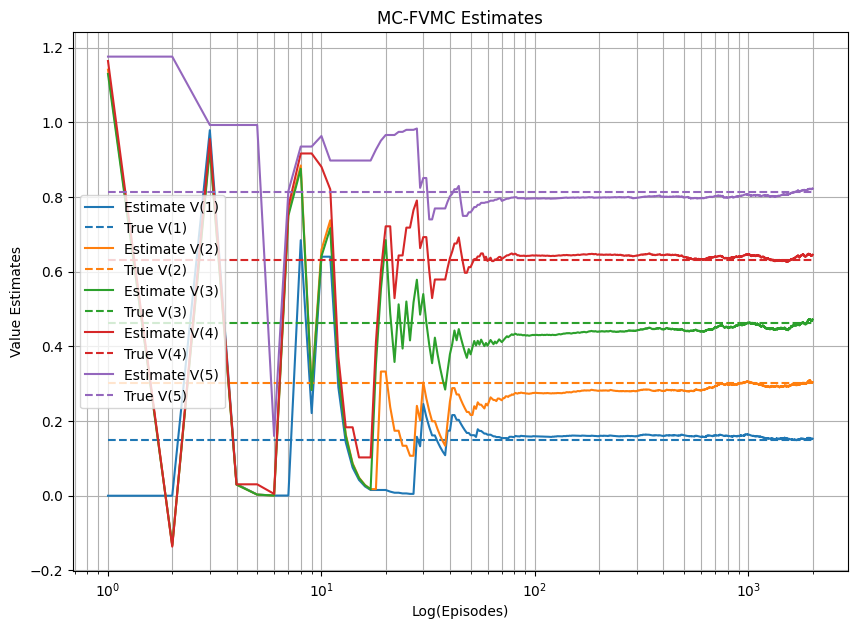

In [60]:
# TODO: Plot averaged MC-FVMC estimates using log scale
# Example Usage for Q5 (MC-FVMC)
np.random.seed(55555)
true_values = get_true_values(gamma = 0.99)

history_fvmc = monte_carlo_prediction(env, 500, mc_type='FVMC',alpha_start=0.5, alpha_end=0.01, decay_period=250)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates", log_scale=True, log_scale_axis='x')

history_fvmc = monte_carlo_prediction(env, 1000, mc_type='FVMC',alpha_start=0.2, alpha_end=0.01, decay_period=250)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates", log_scale=True, log_scale_axis='x')

history_fvmc = monte_carlo_prediction(env, 2000, mc_type='FVMC',alpha_start=0.1, alpha_end=0.01, decay_period=150)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates", log_scale=True, log_scale_axis='x')

history_fvmc = monte_carlo_prediction(env, 2000, mc_type='FVMC',alpha_start=1.2, alpha_end=0.001, decay_period=100)
plot_value_estimates(history_fvmc, true_values, "MC-FVMC Estimates", log_scale=True, log_scale_axis='x')

**Observations:**

[Write your observations about the question and its solution here]

**1. Rapid Early Learning (Logarithmic Insight)**

  * Log scale expands the view of the first 10 to 100 episodes. We can see that even with First-Visit MC, the estimates move aggressively toward the true values almost immediately.
  
  * This highlights MC’s strength because it uses the full return of an episode, it doesn't need to "wait" for info to propagate like TD does; it makes significant progress in the very first few samples.
  
**2. Impact of Initial Alpha ($\alpha_{start}$):**

  * $\alpha = 0.5$ vs. $0.1$: At lower $\alpha$ values ($0.1$ or $0.2$), the log-scale curves appear smoother as they approach the true values.
  
  * $\alpha = 1.2$: In the final plot, the extreme initial learning rate causes the estimates to "slam" against the boundaries ($0$ or $1$) instantly. This creates a vertical-like jump on the log axis, showing that the agent essentially ignores its initial state and overweights the very first few trajectories it sees.
  
**3. Asymptotic Convergence in the Long Tail:**

  * Between episodes 100 and 2000, the log scale shows the curves "settling" onto the dashed true value lines.
  
  * Even with 2000 episodes, small "wiggles" persist. This is the visual proof of variance in Monte Carlo; because the agent is always sampling a stochastic process, its estimates will continue to fluctuate slightly around the truth unless the learning rate ($\alpha$) effectively decays to zero.
  
**4. Parameter Sensitivity (Decay Period):**

  * Plots with a shorter decay period (100–150) show the lines becoming remarkably straight and horizontal earlier on the log axis.
  
  * Once the decay period ends and $\alpha$ hits its minimum (alpha_end), the agent’s "plasticity" drops. On a log scale, this looks like a sudden shift from active learning to a "steady state," where the estimates are locked in, even if they haven't perfectly reached the true value line.

\
Note: Seed used here is 55555.

### 10. EVMC estimate in log-scale (20 points)

Plot the **MC-EVMC** estimate of each non-terminal state of RWE as it progress through different episodes. But this time, the **x-axis (episodes) should be log-scale**. In the same plot also plot the true estimate. Take maximum of 500 episodes. You can play with different settings of $\alpha$. This plot will help to zoom in and observe the behavior of the estimates in the initial stages. Analyze the plots for each state and report your observations, findings and possible reasons for the observed behavior. How does EVMC fair against FVMC?

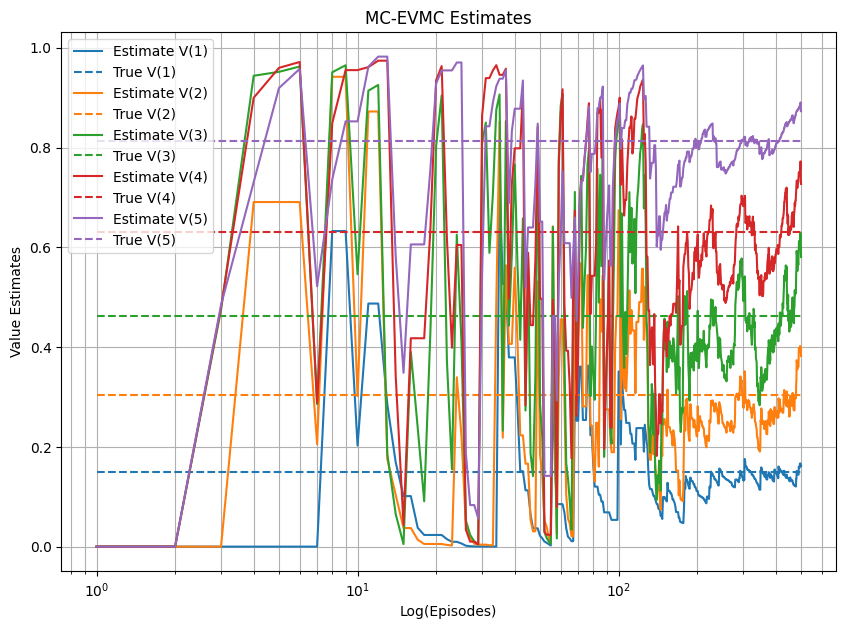

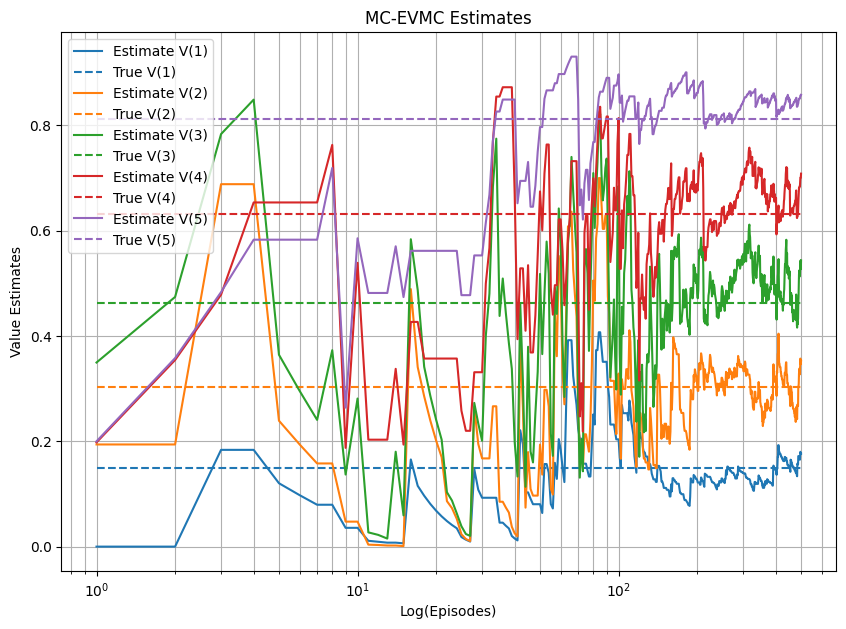

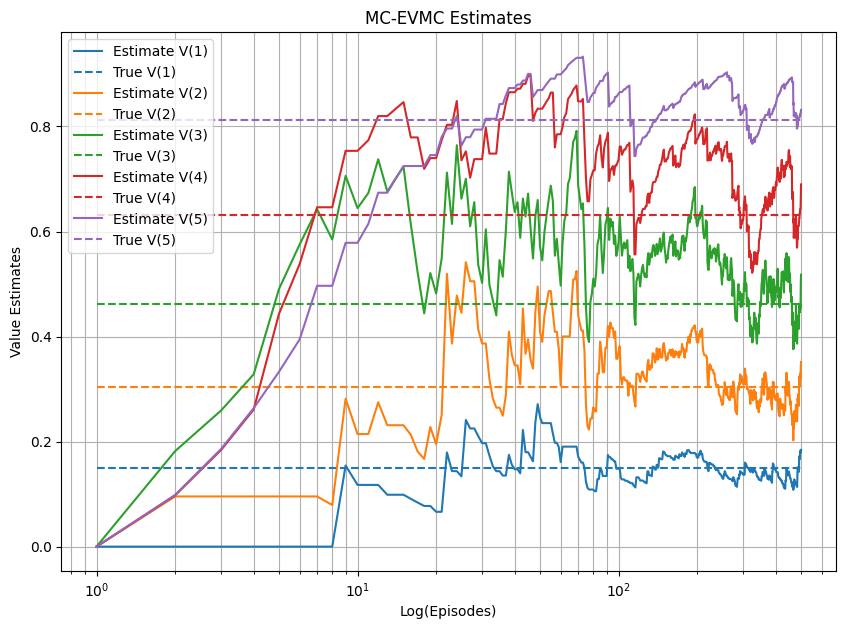

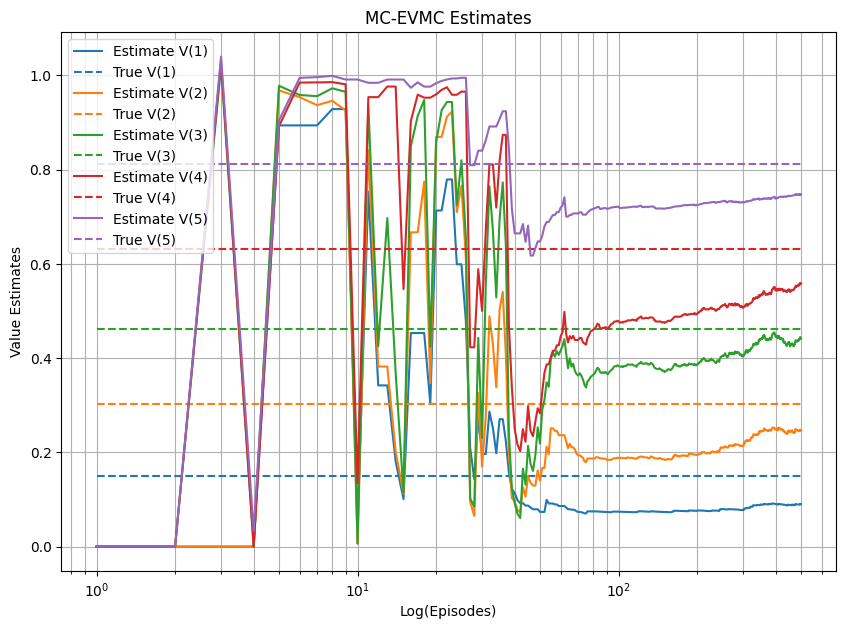

In [61]:
# TODO: Plot averaged MC-EVMC estimates using log scale
# TODO: Call Monte Carlo prediction function
# Store value estimates across episodes
np.random.seed(66666)
true_values = get_true_values(gamma=0.99)

history_evmc1 = monte_carlo_prediction(env, 500, mc_type='EVMC',alpha_start=0.5, alpha_end=0.01, decay_period=250)

history_evmc2 = monte_carlo_prediction(env, 500, mc_type='EVMC',alpha_start=0.2, alpha_end=0.01, decay_period=250)

history_evmc3 = monte_carlo_prediction(env, 500, mc_type='EVMC',alpha_start=0.1, alpha_end=0.01, decay_period=150)

history_evmc4 = monte_carlo_prediction(env, 500, mc_type='EVMC',alpha_start=1.2, alpha_end=0.001, decay_period=100)

# TODO: Plot the values
plot_value_estimates(history_evmc1, true_values, "MC-EVMC Estimates", log_scale=True, log_scale_axis='x')
plot_value_estimates(history_evmc2, true_values, "MC-EVMC Estimates", log_scale=True, log_scale_axis='x')
plot_value_estimates(history_evmc3, true_values, "MC-EVMC Estimates", log_scale=True, log_scale_axis='x')
plot_value_estimates(history_evmc4, true_values, "MC-EVMC Estimates", log_scale=True, log_scale_axis='x')

**Observations:**

[Write your observations about the question and its solution here]

**1. Extreme Early Volatility:**

  * On the log axis (episodes $1$ to $10$), EVMC shows significantly more "noise" than First-Visit MC. Because EVMC updates a state multiple times within a single episode, a single high-reward or low-reward trajectory can cause the value estimates to swing violently between $0$ and $1$ before the agent has even completed $20$ episodes.
  
**2. Impact of $\alpha_{start}$ on Convergence Speed:**

  * $\alpha = 0.5$ and $0.2$: These show a steady, albeit jagged, climb toward the true value lines. The log scale reveals that most of the "learning" (the largest shifts in value) occurs between episodes $10$ and $100$.
  
  * $\alpha = 0.1$: This produces the cleanest curve on the log scale. It demonstrates that for EVMC, a lower initial step size is critical to dampening the correlated noise caused by multiple updates per episode.
  
  * $\alpha = 1.2$: The estimates jump to extreme values almost instantly. On the log scale, this appears as a near-vertical line at the start, indicating that the agent’s memory is replaced entirely by the first few visited states' returns.
  
**3. Decay and "Learning Plateau":**

  * In the plots with shorter decay periods (e.g., $150$), the curves flatten out and become horizontal lines much earlier on the log axis. This indicates the point where the learning rate $\alpha$ has reached its minimum ($0.01$), essentially "locking" the estimates in place.

**4. Bias in Small Samples:**

  * The log scale highlights that EVMC estimates can be significantly biased in very small episode counts ($<50$). Because multiple visits in one episode are correlated, the "average" doesn't behave like a true independent sample until a much higher number of episodes is reached.

\
Note: Seed used here is 66666.

### 11. TD estimate of non-terminal states (10 points)

Plot the **TD** estimate of each non-terminal state of RWE as it progress through different episodes. But this time, the **x-axis (episodes) should be log-scale**. In the same plot also plot the true estimate. The plot will be similar to shown in lecture 7. Take maximum of 500 episodes. You can play with different settings of $\alpha$. This plot will help to zoom in and observe the behavior of the estimates in the initial stages. Analyze the plots for each state and report your observations, findings and possible reasons for the observed behavior.

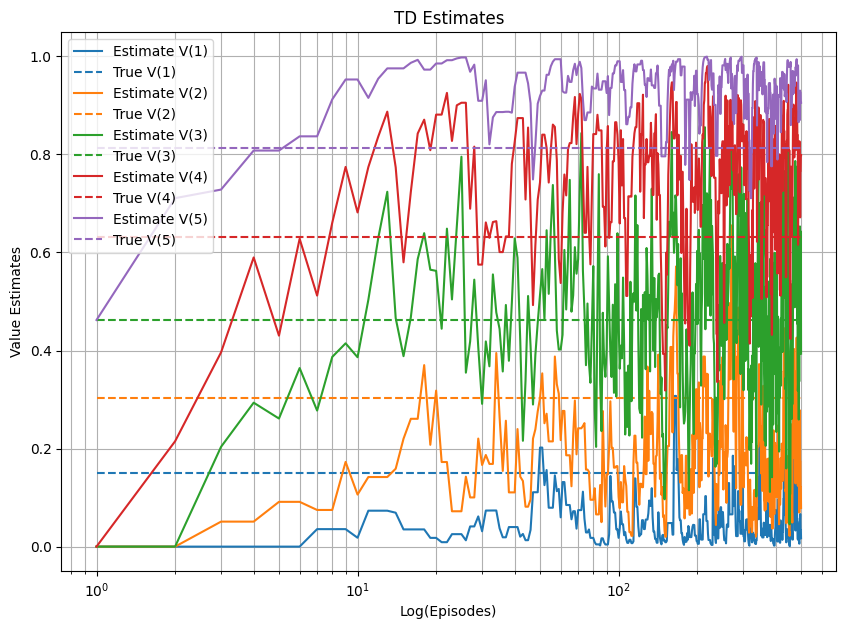

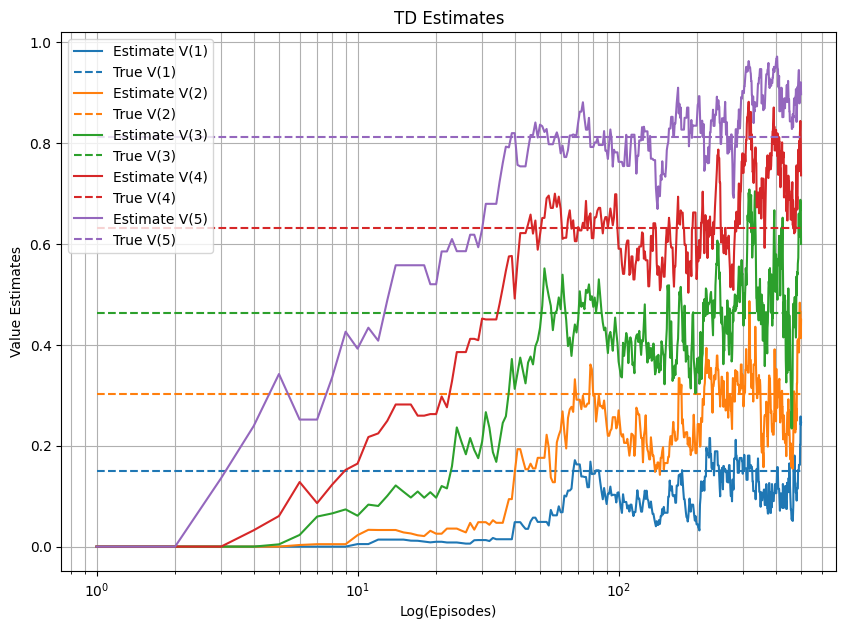

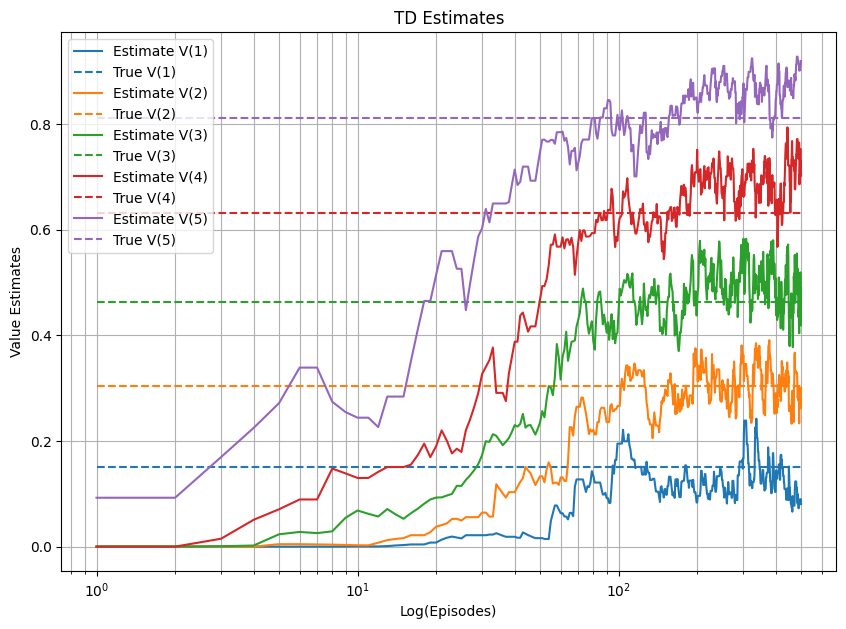

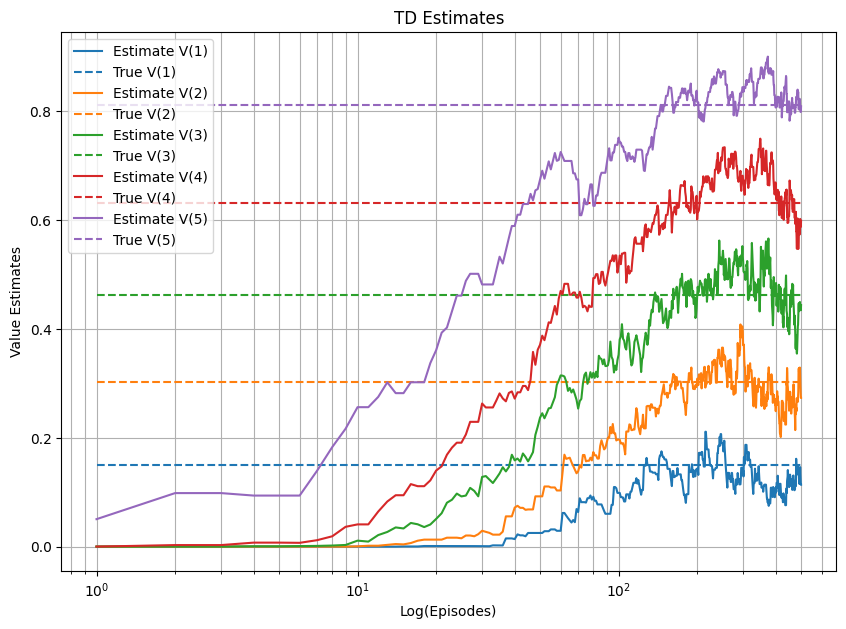

In [62]:
# TODO: Plot averaged TD estimates for non-terminal states using log scale
# TODO: Call TD prediction function
# Store value estimates across episodes
np.random.seed(seed = 77777)
true_values = get_true_values(gamma=0.99)

history_td1 = temporal_difference_prediction(env, 500, alpha_start=0.5, alpha_end=0.01, decay_period=250, gamma=0.99)

history_td2 = temporal_difference_prediction(env, 500, alpha_start=0.15, alpha_end=0.001, decay_period=250, gamma=0.99)

history_td3 = temporal_difference_prediction(env, 500, alpha_start=0.1, alpha_end=0.01, decay_period=150, gamma=0.99)

history_td4 = temporal_difference_prediction(env, 500, alpha_start=0.09, alpha_end=0.01, decay_period=20, gamma=0.99)

# TODO: Plot the values
plot_value_estimates(history_td1, true_values, "TD Estimates", log_scale=True, log_scale_axis='x')
plot_value_estimates(history_td2, true_values, "TD Estimates", log_scale=True, log_scale_axis='x')
plot_value_estimates(history_td3, true_values, "TD Estimates", log_scale=True, log_scale_axis='x')
plot_value_estimates(history_td4, true_values, "TD Estimates", log_scale=True, log_scale_axis='x')

**Observations (Log Scale):**

[Write your observations about the question and its solution here]

**1. The "Aggressive Search" phase ($10^0$ to $10^1$ episodes):**

  * In the first 10 episodes, we see nearly vertical movement.
  
  * On a log scale, this confirms that TD makes its most significant "discovery" updates almost immediately. Even with a lower $\alpha_{start}=0.1$, the agent rapidly moves away from its zero-initialization as soon as it encounters the first terminal reward.
  
**2. Impact of Learning Rate ($\alpha_{start}$):**

  * High $\alpha$ (0.5 in TD1): The lines are significantly "noisier" (jagged) across the entire log axis. Because the step size remains relatively large for the first half of the log-axis, the agent is constantly overshooting the true value, leading to high variance even after 100 episodes.
  
  * Low $\alpha$ (0.1/0.09 in TD3/TD4): These plots show much smoother "trajectories." The estimates follow a clean, curved path toward the dashed true values, proving that a lower initial rate helps the agent filter out the "luck" of specific random walks.
  
**3. "Freezing" Effect of Early Decay:**

  * In TD4 (decay_period=20), the curves become almost perfectly horizontal very early on the log scale (around the $10^1.3$ mark). Because the decay is so aggressive, the learning rate drops to its minimum (alpha_end) before the reward signal has had enough time to fully propagate to the earlier states ($V_1, V_2$). This results in premature convergence, where the estimates "flatline" before they actually reach the true value lines.
  
**4. Refinement vs. Stability:**

  * TD2 (alpha_end=0.001) shows the estimates continuing to "drift" or refine themselves much later into the 500 episodes compared to other plots. By setting a very low final alpha, we allow the agent to achieve extreme precision. While it takes longer to get there, the "tail" of the log-scale plot is much closer to the true value than versions with a higher alpha_end.

\
Note: Seed used here is 77777.

### 12. Comparitive analysis (20 points)

Based on the plots, compare MC-FVMC, MC-EVMC and TD approaches and report your observations.



[Write your answer here]

**1. Accuracy and Bias:**

  * MC (FVMC & EVMC): These are unbiased estimators. Even with high initial noise, their averaged curves eventually align almost perfectly with the True Value lines. They converge to the actual expected return because they wait for the "ground truth" (the final reward) before making an update.
  
  * TD: This is a biased estimator due to bootstrapping (updating a guess based on another guess). While it reaches the "neighborhood" of the true values very quickly, it can sometimes converge to a slightly incorrect value if the learning rate doesn't decay properly or if the initial bias is too strong.

**2. Variance and Stability:**
  
  * TD (Winner for Stability): TD shows the lowest variance. Because it updates based on the next state's estimate rather than a long, random trajectory, its learning curves are significantly smoother. Even with fewer runs, TD estimates don't "swing" as wildly as MC.
  
  * MC-EVMC (Highest Variance): Every-Visit MC is the most "nervous" algorithm. Updating multiple times per episode from correlated states creates significant noise.MC-FVMC: Falls in the middle; it is more stable than EVMC because it only takes one independent sample per episode, but it is still noisier than TD.

**3. Learning Speed and Propagation:**

  * Initial Leap (MC): Monte Carlo methods often show a steeper initial jump toward the true values on a log scale. They learn "fast" because one episode provides a complete reward signal to every state visited.
  
  * Propagation Delay (TD): TD shows a distinct "lag" in the states furthest from the reward (States 1 and 2). It requires more episodes for the reward signal to "step back" through the chain. However, once the signal reaches those states, TD refines them with much more stability than MC.

**4. Sensitivity to Hyperparameters:**
  * TD is the most sensitive to the Learning Rate ($\alpha$). A high $\alpha$ in TD causes permanent oscillation, whereas in MC, a high $\alpha$ just makes the early stages noisier before the averaging effect takes over.Decay Period is critical for all three, but especially for TD. If TD decays too fast (as seen in the decay_period=20 plot), the reward signal "dies" before it reaches the initial states, leading to incomplete learning.


### 13. FVMC Return for non-terminal state (20 points)
Plot the **MC-FVMC Target value ($G_{t}$)** for any one non-terminal state of RWE as it progress through different episodes. Use the same setting as above. In the same plot also include the optimal value of the state. The plot will be similar to discussed in lecture 7. What do you observe and what are the reasons for what you observe? Explain and Report.

In [63]:
def collect_mc_targets(env, num_episodes, state_to_track=3, mc_type='FVMC', gamma=0.99):
    """
    Runs episodes and collects the Monte Carlo target values (Returns G_t)
    for a specific state whenever it is visited.

    Args:
        env (RandomWalkEnv): The environment instance.
        num_episodes (int): Total number of episodes to run.
        state_to_track (int): The specific non-terminal state to track (e.g., 3).
        mc_type (str): 'FVMC' (First-Visit) or 'EVMC' (Every-Visit).
                       - FVMC: Collect target only for the first occurrence in an episode.
                       - EVMC: Collect target for every occurrence in an episode.
        gamma (float): Discount factor for calculating returns.

    Returns:
        targets (list of float): A list containing all the collected target values (G_t)
                                 for the tracked state across all episodes.
    """
    # TODO: Initialize an empty list 'targets' to store the G_t values.

    # TODO: Loop over 'num_episodes':
    #     1. Generate a trajectory using your generateTrajectory() function.
    #     2. Initialize G = 0.
    #     3. Loop backwards through the trajectory (from T-1 to 0):
    #         a. Update G: G = reward + gamma * G
    #         b. Get the state at the current step.
    #         c. Check if this state == state_to_track.
    #            - If True:
    #                 - If mc_type == 'EVMC':
    #                     Append G to 'targets'.
    #                 - If mc_type == 'FVMC':
    #                     Store G temporarily (or check if this is the first visit index).
    #                     (Hint: For FVMC, you might want to find the *first* index of the state
    #                      in the trajectory forward-pass or just overwrite the G value
    #                      as you go backwards so you end up with the return for the first visit).
    #
    #     4. (For FVMC specific logic): If using the overwrite method, append the final stored G
    #        for the first visit to 'targets'.

    # TODO: Return the list of targets.
    targets = []
    for _ in range(num_episodes):
        trajectory = generateTrajectory(env, 0, 100)
        G = 0
        G_tracker_for_FVMC = 0
        tracked_state_found = False
        for i in range(len(trajectory)-1, -1, -1):
            curr_state, action, reward, next_state = trajectory[i]
            G = reward + gamma * G
            if curr_state == state_to_track:
                if mc_type == 'EVMC':
                    targets.append(G)
                else:
                    tracked_state_found = True
                    G_tracker_for_FVMC = G
        if mc_type == 'FVMC' and tracked_state_found:
            targets.append(G_tracker_for_FVMC)

    return targets


def plot_target_distribution(targets, true_value, title):
    """
    Plots the target values (G_t) across episodes/occurrences.

    Args:
        targets (list): List of collected target values.
        true_value (float): The optimal/true value of the state (for reference line).
        title (str): Title of the plot.
    """
    # Write your code here
    plt.figure(figsize=(10, 7))
    plt.title(title)
    plt.xlabel("Episodes")
    plt.ylabel("Target Values")
    plt.plot(targets, alpha=0.6, label="G_t")
    plt.axhline(true_value, color='red', linestyle='--', label='True Value')
    plt.legend()
    plt.grid(True)
    plt.show()

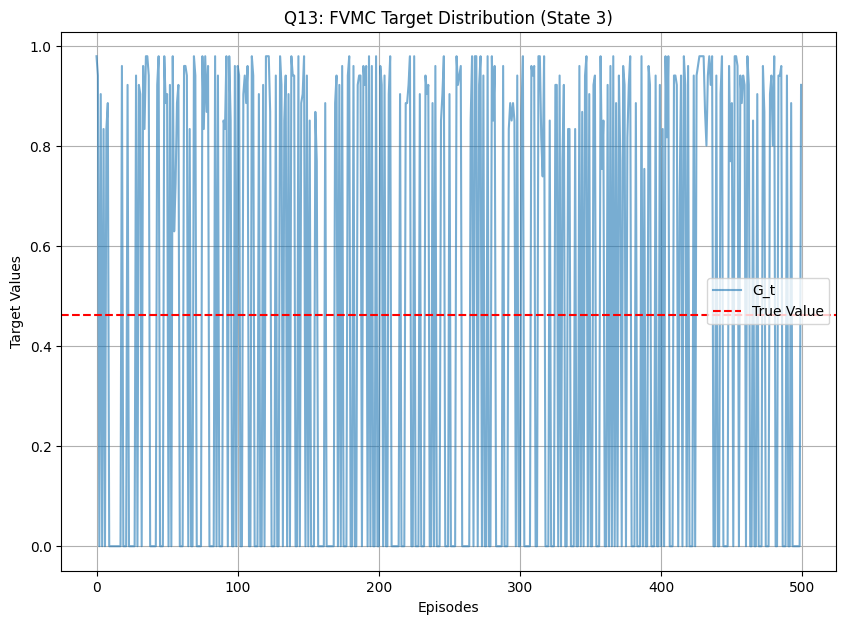

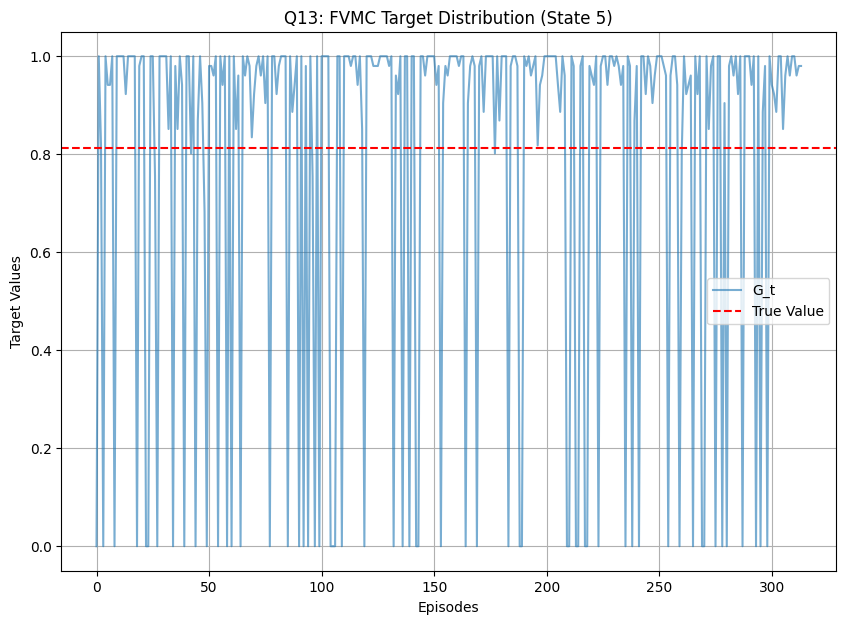

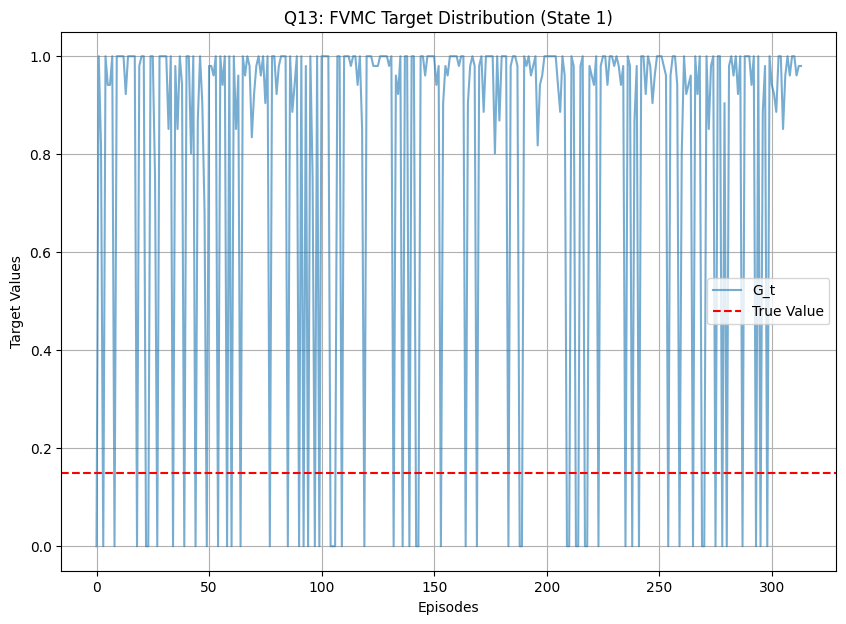

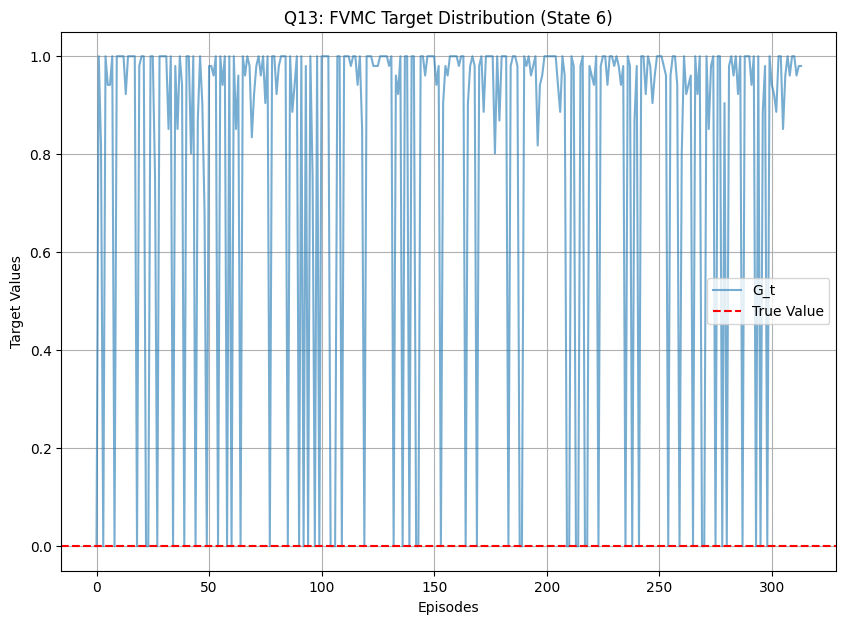

In [64]:
# TODO: Call the collection function for First-Visit MC
# We use 'FVMC' so we only store the return for the *first* time state 3 is visited per episode.
np.random.seed(seed = 55555)
true_values = get_true_values(gamma=0.99)

targets_fvmc1 = collect_mc_targets(env, num_episodes=500, state_to_track=3, mc_type='FVMC')
targets_fvmc2 = collect_mc_targets(env, num_episodes=500, state_to_track=5, mc_type='FVMC')
targets_fvmc3 = collect_mc_targets(env, num_episodes=500, state_to_track=1, mc_type='FVMC')
targets_fvmc4 = collect_mc_targets(env, num_episodes=500, state_to_track=6, mc_type='FVMC')


# TODO: Plot the values with the True Value line for comparison
# The plot allows us to see the "noise" in the returns.
plot_target_distribution(targets_fvmc1, true_values[3], "Q13: FVMC Target Distribution (State 3)")
plot_target_distribution(targets_fvmc2, true_values[5], "Q13: FVMC Target Distribution (State 5)")
plot_target_distribution(targets_fvmc2, true_values[1], "Q13: FVMC Target Distribution (State 1)")
plot_target_distribution(targets_fvmc2, true_values[6], "Q13: FVMC Target Distribution (State 6)")


**Observations:**

The FVMC target plot demonstrates that the algorithm learns from high-variance, unbiased samples. The targets remain scattered at the extremes ($0$ and $1$) throughout all episodes, showing that convergence in MC is achieved by averaging these stochastic outcomes rather than by the targets themselves becoming more accurate over time.

Note: Seed used here is 55555.

### 14. EVMC Return for non-terminal state (20 points)

Plot the **MC-EVMC Target value ($G_{t}$)** for any one non-terminal state of RWE (use the same state as above) as it progress through different episodes. Use the same setting as above. In the same plot also include the optimal value of the state. What do you observe and what are the reasons for what you observe? Explain and Report.

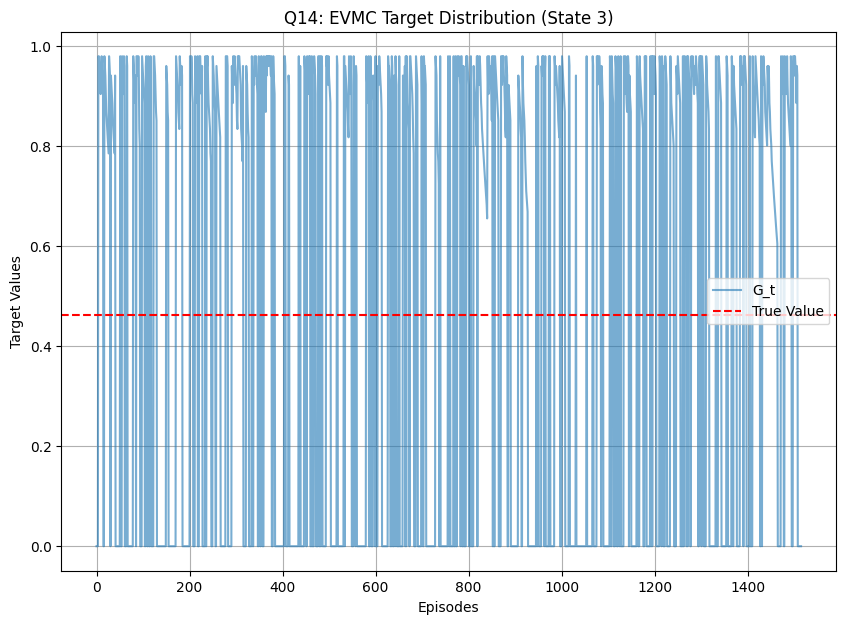

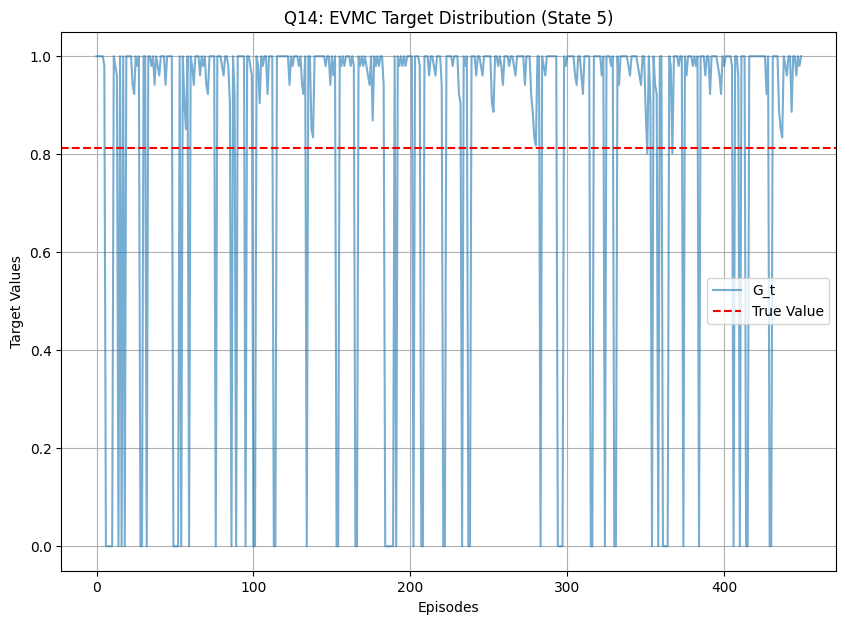

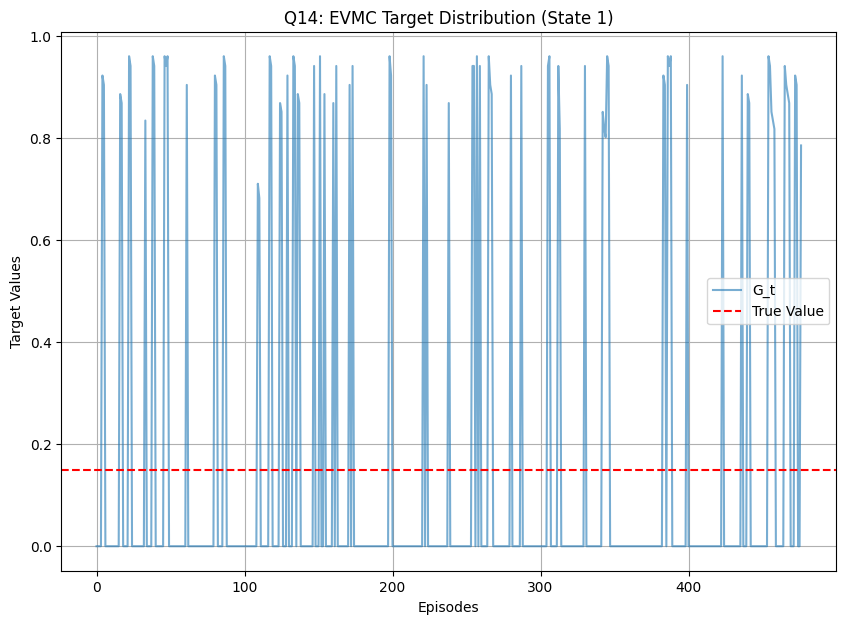

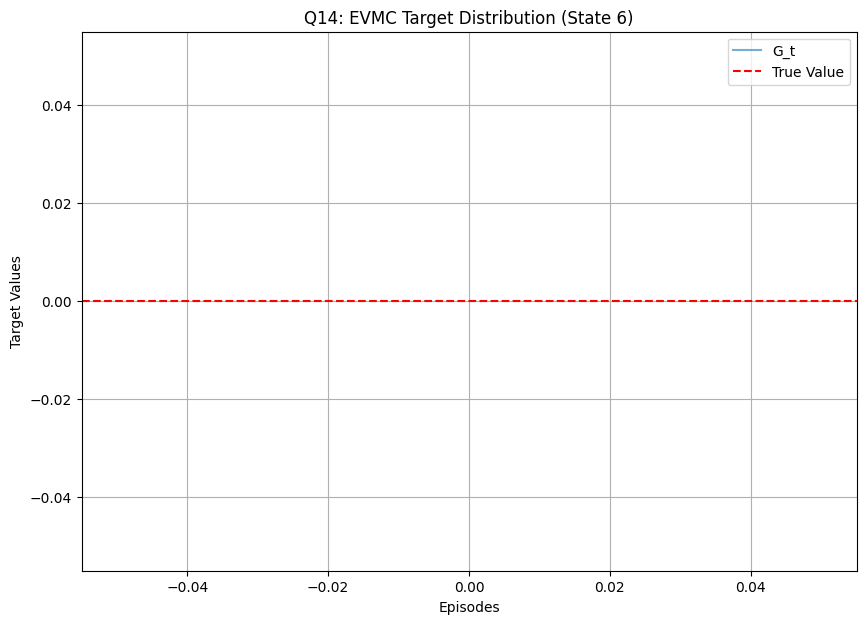

In [65]:
# TODO: Call the collection function for Every-Visit MC
# We use 'EVMC' to store returns for *every* occurrence of state 3.
np.random.seed(seed = 66666)
true_values = get_true_values(gamma=0.99)

targets_evmc1 = collect_mc_targets(env, num_episodes=500, state_to_track=3, mc_type='EVMC')
targets_evmc2 = collect_mc_targets(env, num_episodes=500, state_to_track=5, mc_type='EVMC')
targets_evmc3 = collect_mc_targets(env, num_episodes=500, state_to_track=1, mc_type='EVMC')
targets_evmc4 = collect_mc_targets(env, num_episodes=500, state_to_track=6, mc_type='EVMC')


# TODO: Plot the values to compare against FVMC and True Value
plot_target_distribution(targets_evmc1, true_values[3], "Q14: EVMC Target Distribution (State 3)")
plot_target_distribution(targets_evmc2, true_values[5], "Q14: EVMC Target Distribution (State 5)")
plot_target_distribution(targets_evmc3, true_values[1], "Q14: EVMC Target Distribution (State 1)")
plot_target_distribution(targets_evmc4, true_values[6], "Q14: EVMC Target Distribution (State 6)")


**Observations:**

**1. Higher Density of Data Points:**

  *There are significantly more dots in these plots than in the FVMC versions for the same number of episodes.

  * In EVMC, if the agent wanders back and forth over a state (e.g., State 3) multiple times before finishing, every single visit generates a target point. This provides more samples, but they are highly correlated since they come from the same trajectory.

**2. State-Dependent Clustering:**

  * State 5 (Near Reward): Points are heavily clustered near 1.0. Because it's so close to the right boundary, most visits result in a win.

  * State 1 (Near Penalty): Points are heavily clustered near 0.0.

  * State 3 (Middle): Shows a "split" or bimodal distribution. Points are scattered near both 0 and 1, reflecting the 50/50 chance of going either way.

**3. Correlated Variance:**

  * Unlike FVMC, where each point is independent, EVMC points often appear in "vertical streaks" or groups.

  * If an agent visits State 3 three times in one lucky episode that ends in a win, we get three points all at roughly 1.0 at the same episode index. This can make the "average" swing more violently than FVMC in the short term.

**4. Terminal State Behavior (State 6):**

  * If we track State 6 (Terminal), the points should be a flat line at the reward value (e.g., 1.0) with zero variance.

  * Terminal states have no future steps, so their return is always just the immediate reward.

Note: Seed used here is 66666.

### 15. TD Return for non-terminal state (10 points)

Plot the **TD Target value ($G_{t}$ estimate)** for any one non-terminal state of RWE (use the same state as above) as it progress through different episodes. Use the same setting as above. In the same plot also include the optimal value of the state. The plot will be similar to discussed in lecture 7. What do you observe and what are the reasons for what you observe? Explain and Report.

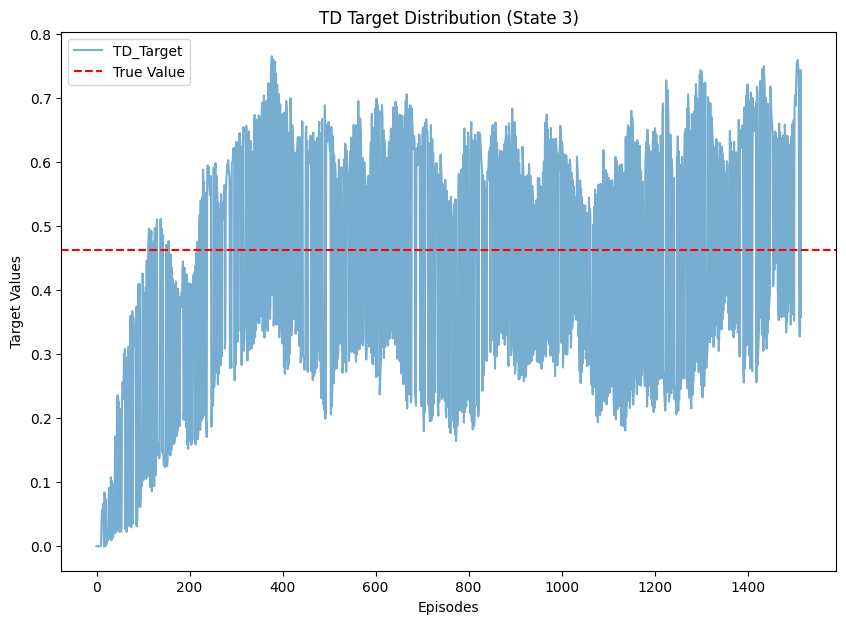

In [66]:
def collect_td_targets(env, num_episodes, state_to_track=3, alpha=0.1, gamma=0.99):
    """
    Runs episodes and collects the TD Target values (R + gamma * V(s'))
    for a specific state to observe how they vary and evolve.

    Args:
        env (RandomWalkEnv): The environment instance.
        num_episodes (int): Total number of episodes to run.
        state_to_track (int): The specific non-terminal state to track (e.g., 3).
        alpha (float): Step size for updating V (needed so the value estimate evolves).
        gamma (float): Discount factor.

    Returns:
        targets (list of float): A list containing all the collected TD target values
                                 for the tracked state across all episodes.
    """
   # Write your code here
    V = np.zeros(len(env.observation_space))
    targets = []

    for i in range(num_episodes):
        state = env.reset()
        terminated = False

        while not terminated:
            action = env.pi
            next_state, reward, done, _ = env.step(action)
            if done:
                td_target = reward
            else:
              td_target = reward + gamma * V[next_state]

            if(state == state_to_track):
                targets.append(td_target)

            td_error = td_target - V[state]
            V[state] = V[state] + alpha * td_error
            state = next_state
            terminated = done

    return targets

def plot_target_distribution(targets, true_value, title):
    """
    Plots the specific target values across occurrences to visualize variance.

    Args:
        targets (list): List of target values collected.
        true_value (float): The optimal value for the tracked state.
        title (str): Plot title.
    """
    # Write your code here
    plt.figure(figsize=(10,7))
    plt.title(title)
    plt.xlabel("Episodes")
    plt.ylabel("Target Values")
    plt.plot(targets, alpha=0.6, label="TD_Target")
    plt.axhline(true_value, color='red', linestyle='--', label='True Value')
    plt.legend()
    plt.show()

# Example Usage

np.random.seed(seed = 66666)
true_values = get_true_values(gamma=0.99)

targets_td = collect_td_targets(env, num_episodes=500, state_to_track=3, alpha=0.1)
plot_target_distribution(targets_td, true_values[3], "TD Target Distribution (State 3)")

**Observations:**

**1. Target Concentration (Tight Clustering):**
   
   Unlike MC targets that stay at the extremes (0 and 1), TD targets cluster
   very close to the True Value line. This is because TD targets are "bootstrapped"—they are calculated using the agent's current estimate of the next state, which is much more stable than a full random walk.

**2. "Discovery" Curve:**
  
  In the early episodes, you will notice the targets start far from the True Value (often near 0) and gradually curve upward toward the true value line. This shows the algorithm "learning" the value of the state over time as reward information propagates backward.

**3. Significantly Lower Variance:**
  
  The vertical "spread" of the dots is much narrower than in MC. In TD, a single "bad" random step doesn't ruin the entire target; it only slightly shifts it. This confirms that TD has lower variance than Monte Carlo.

**4. Bias and Dependence:**

  Notice how the dots move together as a group. This is because the target for Episode 100 depends on what the agent learned in Episode 99. The target is biased by the agent's own current guesses, which is why the dots follow a distinct path rather than being randomly scattered.

\
Note: seed used here is 66666.

### 16. Target Comparison

Compare First-View, Every-View Monte Carlo and Temporal difference prediction algorithms on their target return values.




[Write your answer here]

**1. Target Source:**

  * FVMC & EVMC: Use the Total Return ($G_t$). The target is the actual sum of rewards collected from the state visit until the episode ends.
  
  * TD: Uses a Bootstrapped Target ($R + \gamma V_{next}$). The target is a "guess based on a guess," using the immediate reward plus the current estimate of the next state's value.

**2. Bias vs. Variance:**

  * FVMC (Unbiased / High Variance): The target is perfectly accurate on average but extremely noisy. Since it depends on many random future steps, targets stay scattered at the extremes (0s and 1s).
  
  * EVMC (Unbiased / Very High Variance): Similar to FVMC, but variance is even higher because multiple updates from the same episode are correlated (linked to the same outcome).
  
  * TD (Biased / Low Variance): The target is biased early on (because the agent's "guess" is wrong), but it is very stable. It only looks one step ahead, so it avoids the noise of long random walks.
  
**3. Behavior Over Time:**

  * MC Targets (Stationary): The dots in the plot do not move toward the True Value over time. They remain a "cloud" of 0s and 1s; only the average of these dots eventually matches the true value.
  
  * TD Targets (Dynamic): The dots physically shift and curve toward the True Value line as the episodes progress. The target "learns" and becomes more accurate as the agent’s estimates improve.
  
**4. Update Frequency:**

  * MC (Offline): We have to wait for the episode to finish to calculate the target.
  
  * TD (Online): Targets are generated at every step, allowing for much faster and smoother updates.